<a href="https://colab.research.google.com/github/SashaSBonacina/PET-Alzheimer-Prediction-Thesis/blob/main/Copy_of_Code_29_8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Set up

## Importing libraries

In [414]:
from google.colab import drive
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import nibabel as nib
import cv2, re, itertools,pathlib
from skimage import transform
import scipy.ndimage as ndi
from keras.models import Model
from keras.layers import Input, Dense, Flatten, Conv3D, MaxPooling3D, concatenate
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from sklearn.model_selection import KFold
from sklearn import metrics
from sklearn.metrics import r2_score
from keras import metrics
import random

In [415]:
from keras.models import Model
from keras.layers import Input, Dense, Flatten, Conv3D, MaxPooling3D, concatenate
from keras.models import load_model
from sklearn.model_selection import StratifiedKFold
from keras.callbacks import ReduceLROnPlateau
import keras.backend as K
from tensorflow.keras.initializers import GlorotUniform
from keras.optimizers import Adam
from keras.backend import dropout
import time
from sklearn.model_selection import cross_val_score
import traceback


In [416]:
from numpy.random import seed
seed(42)
# Set the random seed
tf.random.set_seed(42)

## Mounting google drive to access the data

In [417]:
drive.mount('/content/drive') #mounting drive

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Loading in CSV with Image ID, Age, Sex

In [418]:
cols = ['Image Data ID', 'Subject', 'Group', 'Sex', 'Age', 'Visit',
       'Description', 'Type', 'Acq Date'] # we dont need all the columns
df = pd.read_csv('/content/drive/MyDrive/CN FOR BAE DATA/Tx_Origin_SpatNORM_CN.csv', usecols = cols)
df.columns = ['ID', 'Subject', 'Group', 'Sex', 'Age', 'Visit',
       'Descrip', 'Type', 'Acq Date'] # renaming cols


In [419]:
df.head()

,ID,Subject,Group,Sex,Age,Visit,Descrip,Type,Acq Date
0,I387827,024_S_4084,CN,F,71,v21,[F-18]AV-45 Dy2 4i/16s AV45,Original,8/27/2013
1,I388229,024_S_4158,CN,M,86,v21,[F-18]AV-45 Dy2 4i/16s AV45,Original,8/30/2013
2,I509380,024_S_4158,CN,M,88,v41,[F-18]AV-45 Dy1 4i/16s AV45,Original,9/03/2015
3,I388228,024_S_4158,CN,M,86,v21,[F-18]AV-45 Dy1 4i/1 Early AV45,Original,8/30/2013
4,I387826,024_S_4084,CN,F,71,v21,[F-18]AV-45 Dy1 4i/1 Early AV45,Original,8/27/2013


Collecting file paths with the images

In [420]:
directory = '/content/drive/MyDrive/CN FOR BAE DATA/Tx_Origin_SpatNORM_CN_imageID' # enter the dir were the images are stored
image_ids = []
for filename in os.listdir(directory):
  image_ids.append(filename)
print(len(image_ids))

102


In [421]:
df = df[df['ID'].isin(image_ids)] #filterring the df so it only contains the data we need
df = df.reset_index()

In [422]:
df.shape

(102, 10)

Adding the image paths to the df for the corresponding image ID

In [423]:
# new colunm for the paths
df['Loc'] = ''
# iterate over files in that directory
for filename in os.listdir(directory):
    f = os.path.join(directory, filename)
    image_id_folder = filename

    for image in os.listdir(f):
      f = os.path.join(f, image)
      if os.path.isfile(f) and f.endswith('nii'):  # checking if it is a file and a .nii file
          df.loc[df['ID']==image_id_folder, 'Loc' ] = f # appending the path

In [424]:
df['Sex'] = df['Sex'].apply(lambda x: 1 if x == 'M' else -1)

# Data Information (vis)

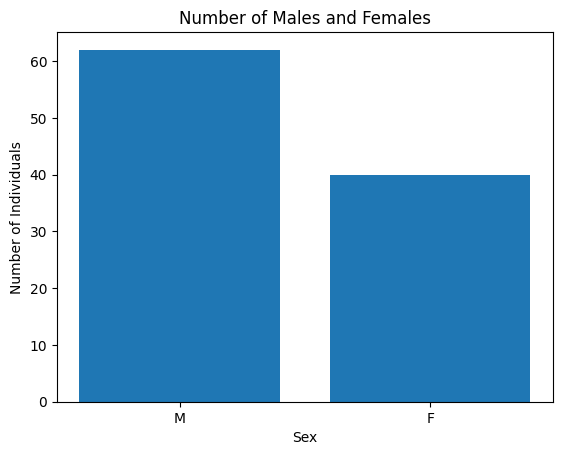

In [ ]:
sex_counts = df["Sex"].value_counts()
# Plot the bar chart
plt.bar(sex_counts.index, sex_counts.values)
plt.xlabel("Sex")
plt.ylabel("Number of Individuals")
plt.title("Number of Males and Females")
plt.show()

Text(0.5, 1.0, 'Age Distribution for CN data')

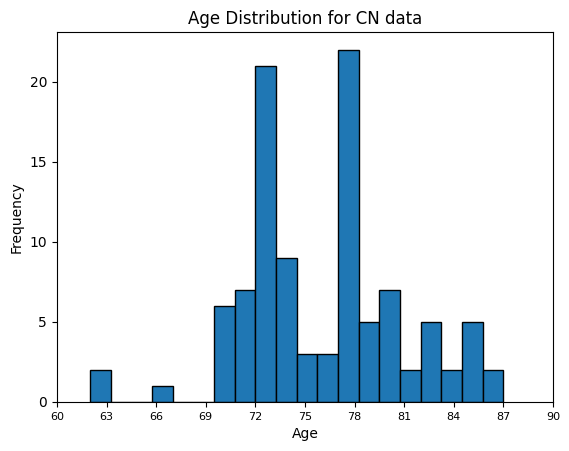

In [ ]:
plt.hist(df["Age"], bins=20, edgecolor="black")
plt.xlabel("Age")
plt.ylabel("Frequency")
num_ticks = 11  # The number of ticks you want
x_ticks = np.linspace(60, 90, num_ticks)
plt.xticks(x_ticks, fontsize=8)

plt.title("Age Distribution for CN data")

In [ ]:
len(df['Subject'].unique())

102

Each subject has only 1 image in the df

No reshaping needed as all are the same shape! This is because the same processing steps were taken by ADNI for each image.

Furthermore each image is 3d not 4d, so t has been average through the image in processing

<class 'nibabel.nifti1.Nifti1Image'>
<class 'numpy.memmap'>


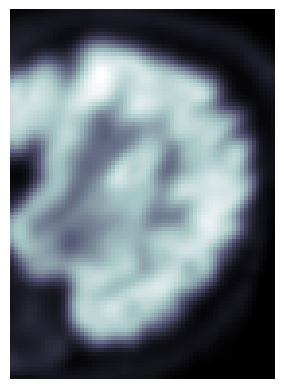

In [ ]:
x = list(df['Loc'])[11] # getting a random image path
brain_vol = nib.load(x)
# What is the type of this object?
print(type(brain_vol))
brain_vol_data = brain_vol.get_fdata()
print(type(brain_vol_data))
plt.imshow(brain_vol_data[60], cmap='bone')
plt.axis('off')
plt.show()

# BAE

## Preparing the data

In [425]:
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv3D, MaxPooling3D, Flatten, Dense, Dropout
import keras
from keras.models import load_model
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score



Extracting data in the correct format for the model

In [426]:
# Extract image data and corresponding ages from the DataFrame
image_paths = df['Loc'].values
ages = df['Age'].values
sexes = df['Sex'].values
ids_ = df['ID'].values

# Initialize empty lists to store image arrays and labels
image_data = []

# Loop through each image path, load the image, and append to the lists
for path, age in zip(image_paths, ages):
    image = nib.load(path).get_fdata()
    image_data.append(image)

# Convert lists to numpy arrays
image_data = np.array(image_data)

# Reshape the image data to match the CNN input shape (128, 128, 82, 6) -> (samples, 128, 128, 82, 6)
image_data = image_data.reshape(-1, 79, 95, 68, 1)



In [427]:
train_idx, test_idx, bae_3d_sexes_train, bae_3d_sexes_test = train_test_split(np.arange(102), sexes, test_size=0.2, stratify=sexes)

In [428]:
count = 0
locations = []
shape = image_data.shape
for a in range(shape[0]):
  for b in range(shape[1]):
    for c in range(shape[2]):
      for d in range(shape[3]):
        if pd.isna(image_data[a][b][c][d]):
          locations.append([a,b,c,d])
          count+=1
print(count)

9677


In [429]:
from collections import Counter
Counter([ele[0] for ele in locations])

Counter({10: 5392, 60: 4285})

images 10 and 60 have some nans, as this is only 1% of the image we can replace the pixels with averages

In [430]:
x = list(df['Loc'])[10] # getting a random image path
brain_vol = nib.load(x)
# What is the type of this object?
type(brain_vol)

nibabel.nifti1.Nifti1Image

In [431]:
brain_vol_data = brain_vol.get_fdata()
type(brain_vol_data)

numpy.memmap

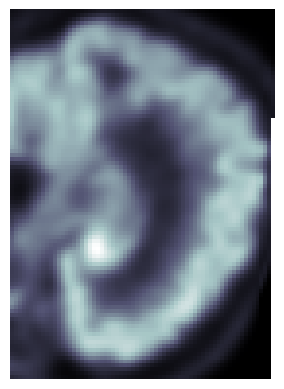

In [432]:
plt.imshow(brain_vol_data[50], cmap='bone')
plt.axis('off')
plt.show()

we can see the nans on the right hand side of the image

In [433]:
for location in locations:
  surrounding_pixels = []
  try:
    surrounding_pixels.append(image_data[location[0]][location[1]-1][location[2]][location[3]])
  except:
    None
  try:
    surrounding_pixels.append(image_data[location[0]][location[1]+1][location[2]][location[3]])
  except:
    None
  try:
    surrounding_pixels.append(image_data[location[0]][location[1]][location[2]-1][location[3]])
  except:
    None
  try:
    surrounding_pixels.append(image_data[location[0]][location[1]][location[2]+1][location[3]])
  except:
    None
  try:
    surrounding_pixels.append(image_data[location[0]][location[1]][location[2]][location[3]-1])
  except:
    None
  try:
    surrounding_pixels.append(image_data[location[0]][location[1]][location[2]][location[3]+1])
  except:
    None
  image_data[location[0]][location[1]][location[2]][location[3]]  =  np.nanmean(surrounding_pixels)


In [434]:
"""count = 0
shape = image_data.shape
for a in range(shape[0]):
  for b in range(shape[1]):
    for c in range(shape[2]):
      for d in range(shape[3]):
        if pd.isna(image_data[a][b][c][d]):
          locations.append([a,b,c,d])
          count+=1
print(count)"""

'count = 0\nshape = image_data.shape\nfor a in range(shape[0]):\n  for b in range(shape[1]):\n    for c in range(shape[2]):\n      for d in range(shape[3]):\n        if pd.isna(image_data[a][b][c][d]):\n          locations.append([a,b,c,d])\n          count+=1\nprint(count)'

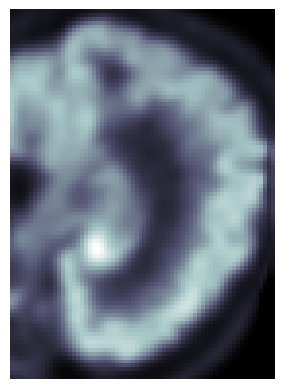

In [435]:
plt.imshow(image_data[10][50], cmap='bone')
plt.axis('off')
plt.show()

th e image data now have no Nans, i have filled in the nana by looking at pixels around the nan

In [436]:
image_data.shape

(102, 79, 95, 68, 1)

In [437]:
bae_3d_im_train, bae_3d_im_test = image_data[train_idx], image_data[test_idx]
bae_3d_ages_train, bae_3d_ages_test = ages[train_idx], ages[test_idx]

## Preparing extended CN dataset

In [438]:
cols = ['Image Data ID', 'Subject', 'Group', 'Sex', 'Age', 'Visit',
       'Description', 'Type', 'Acq Date'] # we dont need all the columns
extended_df = pd.read_csv('/content/drive/MyDrive/CN FOR BAE DATA/CN_not_BL.csv', usecols = cols)
extended_df.columns = ['ID', 'Subject', 'Group', 'Sex', 'Age', 'Visit',
       'Descrip', 'Type', 'Acq Date'] # renaming cols

In [178]:
extended_df.head()

,ID,Subject,Group,Sex,Age,Visit,Descrip,Type,Acq Date
0,I211739,128_S_0272,CN,F,71,m06,"Tx Origin, Aligned Baseline, Spatially Normalized",Post-processed,11/02/2006
1,I211511,022_S_0130,CN,M,76,m36,"Tx Origin, Aligned Baseline, Spatially Normalized",Post-processed,4/28/2009
2,I211755,130_S_0232,CN,M,79,m06,"Tx Origin, Aligned Baseline, Spatially Normalized",Post-processed,9/07/2006
3,I211527,027_S_0120,CN,M,73,m06,"Tx Origin, Aligned Baseline, Spatially Normalized",Post-processed,8/03/2006
4,I211771,137_S_0301,CN,F,74,m06,"Tx Origin, Aligned Baseline, Spatially Normalized",Post-processed,10/31/2006


In [583]:
len(extended_df.Subject.unique())

97

Collecting file paths with the images

In [439]:
ex_directory = '/content/drive/MyDrive/CN FOR BAE DATA/CN_not_BL' # enter the dir were the images are stored
ex_image_ids = []
for filename in os.listdir(ex_directory):
  ex_image_ids.append(filename)
print(len(ex_image_ids))

314


In [440]:
extended_df = extended_df[extended_df['ID'].isin(ex_image_ids)] #filterring the df so it only contains the data we need
extended_df = extended_df.reset_index()

In [441]:
extended_df.shape

(314, 10)

Adding the image paths to the df for the corresponding image ID

In [442]:
# new colunm for the paths
extended_df['Loc'] = ''
# iterate over files in that directory
for filename in os.listdir(ex_directory):
    f = os.path.join(ex_directory, filename)
    image_id_folder = filename

    for image in os.listdir(f):
      f = os.path.join(f, image)
      if os.path.isfile(f) and f.endswith('nii'):  # checking if it is a file and a .nii file
          extended_df.loc[extended_df['ID']==image_id_folder, 'Loc' ] = f # appending the path

In [443]:
extended_df['Sex'] = extended_df['Sex'].apply(lambda x: 1 if x == 'M' else -1)

In [445]:
ex_image_data.shape

(314, 79, 95, 69)

In [189]:
bae_3d_im_test.shape

(21, 79, 95, 68, 1)

In [444]:
# Extract image data and corresponding ages from the DataFrame
ex_image_paths = extended_df['Loc'].values
ex_ages = extended_df['Age'].values
ex_sexes = extended_df['Sex'].values
ex_ids = extended_df['ID'].values

# Initialize empty lists to store image arrays and labels
ex_image_data = []

# Loop through each image path, load the image, and append to the lists
for path, age in zip(ex_image_paths, ex_ages):
    image = nib.load(path).get_fdata()
    ex_image_data.append(image)

# Convert lists to numpy arrays
ex_image_data = np.array(ex_image_data)

# Reshape the image data to match the CNN input shape (128, 128, 82, 6) -> (samples, 128, 128, 82, 6)



ValueError: ignored

In [ ]:
cropped_data = ex_image_data[:, :, :, :68]
print(cropped_data.shape)

In [447]:
ex_image_data_ = cropped_data[..., np.newaxis]

In [448]:
ex_image_data_ = np.array(ex_image_data_)

In [449]:
count = 0
locations = []
shape = ex_image_data_.shape
for a in range(shape[0]):
  for b in range(shape[1]):
    for c in range(shape[2]):
      for d in range(shape[3]):
        if pd.isna(ex_image_data_[a][b][c][d]):
          locations.append([a,b,c,d])
          count+=1
print(count)

109267


In [ ]:
from collections import Counter
Counter([ele[0] for ele in locations])

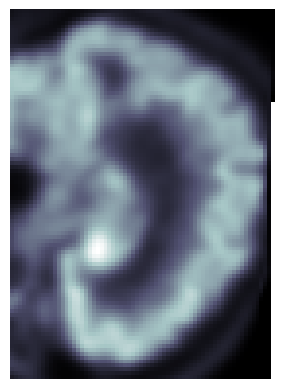

In [198]:
x = list(extended_df['Loc'])[42] # getting a random image path
brain_vol = nib.load(x)
brain_vol_data = brain_vol.get_fdata()
plt.imshow(brain_vol_data[50], cmap='bone')
plt.axis('off')
plt.show()

we can see the nans on the right hand side of the image

In [450]:
for location in locations:
  surrounding_pixels = []
  try:
    surrounding_pixels.append(ex_image_data_[location[0]][location[1]-1][location[2]][location[3]])
  except:
    None
  try:
    surrounding_pixels.append(ex_image_data_[location[0]][location[1]+1][location[2]][location[3]])
  except:
    None
  try:
    surrounding_pixels.append(ex_image_data_[location[0]][location[1]][location[2]-1][location[3]])
  except:
    None
  try:
    surrounding_pixels.append(ex_image_data_[location[0]][location[1]][location[2]+1][location[3]])
  except:
    None
  try:
    surrounding_pixels.append(ex_image_data_[location[0]][location[1]][location[2]][location[3]-1])
  except:
    None
  try:
    surrounding_pixels.append(ex_image_data_[location[0]][location[1]][location[2]][location[3]+1])
  except:
    None
  ex_image_data_[location[0]][location[1]][location[2]][location[3]]  =  np.nanmean(surrounding_pixels)


In [ ]:
count = 0
shape = ex_image_data_.shape
for a in range(shape[0]):
  for b in range(shape[1]):
    for c in range(shape[2]):
      for d in range(shape[3]):
        if pd.isna(ex_image_data_[a][b][c][d]):
          locations.append([a,b,c,d])
          count+=1
print(count)

th e image data now have no Nans, i have filled in the nana by looking at pixels around the nan

In [ ]:
print(ex_image_data_.shape, image_data.shape)
print(ex_sexes.shape, sexes.shape)
print(ex_ages.shape, ages.shape)

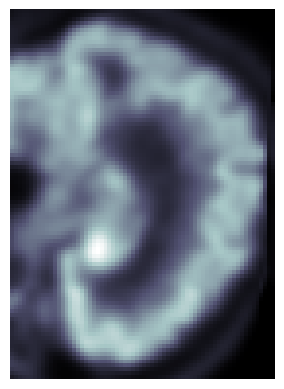

In [234]:
plt.imshow(ex_image_data_[42][50], cmap='bone')
plt.axis('off')
plt.show()

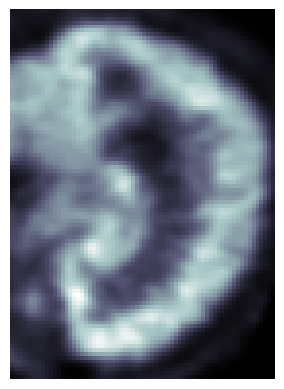

In [235]:
plt.imshow(image_data[42][50], cmap='bone')
plt.axis('off')
plt.show()

In [451]:
full_image_data = np.concatenate((ex_image_data_,  image_data))
full_sexes = np.concatenate((ex_sexes, sexes))
full_ages = np.concatenate((ex_ages, ages))

In [460]:
train_idx, test_idx, full_3d_sexes_train, full_3d_sexes_test = train_test_split(np.arange(416), full_sexes, test_size=0.1, stratify=full_sexes)

In [461]:
full_3d_im_train, full_3d_im_test = full_image_data[train_idx], full_image_data[test_idx]
full_3d_ages_train, full_3d_ages_test = full_ages[train_idx], full_ages[test_idx]

## Baseline
the baseline will be the average of the ages

In [25]:
mean_age = np.mean(ages)

In [26]:
predictions = np.ones(len(ages))*mean_age


# Calculate different evaluation metrics
mse = mean_squared_error(ages, predictions)
mae = mean_absolute_error(ages, predictions)
r2 = r2_score(ages, predictions)

# Display the metrics
print("Mean Squared Error:", mse)
print("Mean Absolute Error:", mae)
print("R-squared:", r2)

Mean Squared Error: 23.24423298731257
Mean Absolute Error: 3.951557093425605
R-squared: 0.0


## 3D model

### Vanilla model
Adding early stopping to prevent overfitting

In [162]:
model = Sequential() # using sequential

# Add 3D Convolutional layers with MaxPooling
model.add(Conv3D(32, kernel_size=(3, 3, 3), activation='relu', input_shape=(79, 95, 68, 1)))
model.add(MaxPooling3D(pool_size=(2, 2, 2)))
model.add(Conv3D(64, kernel_size=(3, 3, 3), activation='relu'))
model.add(MaxPooling3D(pool_size=(2, 2, 2)))

# Flatten the output and add Dense layers for age prediction
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(1, activation='linear'))  # Use 'linear' activation for regression tasks

# Compile the model
model.compile(loss='mean_squared_error', optimizer='adam')

In [160]:
bae_3d_im_train = np.array(bae_3d_im_train)
bae_3d_im_test = np.array(bae_3d_im_test)
bae_3d_ages_train = np.array(bae_3d_ages_train)
bae_3d_ages_test = np.array(bae_3d_ages_test)

Lets train the model with early stopping

In [144]:
callbacks = [EarlyStopping(monitor='val_loss', patience=100),
             ModelCheckpoint(filepath='basic_model.h5', monitor='val_loss', save_best_only=True)]

Epoch 1/200
6/6 [==============================] - 5s 672ms/step - loss: 6613.8867 - val_loss: 4979.5312
Epoch 2/200
6/6 [==============================] - 2s 261ms/step - loss: 5122.5356 - val_loss: 5137.8511
Epoch 3/200
6/6 [==============================] - 3s 620ms/step - loss: 4128.6533 - val_loss: 1619.6691
Epoch 4/200
6/6 [==============================] - 3s 547ms/step - loss: 615.1562 - val_loss: 1094.2151
Epoch 5/200
6/6 [==============================] - 3s 594ms/step - loss: 514.7809 - val_loss: 431.6961
Epoch 6/200
6/6 [==============================] - 3s 525ms/step - loss: 115.6424 - val_loss: 33.5422
Epoch 7/200
6/6 [==============================] - 2s 260ms/step - loss: 34.2981 - val_loss: 33.8634
Epoch 8/200
6/6 [==============================] - 2s 256ms/step - loss: 28.6035 - val_loss: 39.6529
Epoch 9/200
6/6 [==============================] - 3s 502ms/step - loss: 24.9160 - val_loss: 26.9171
Epoch 10/200
6/6 [==============================] - 2s 258ms/step - loss:

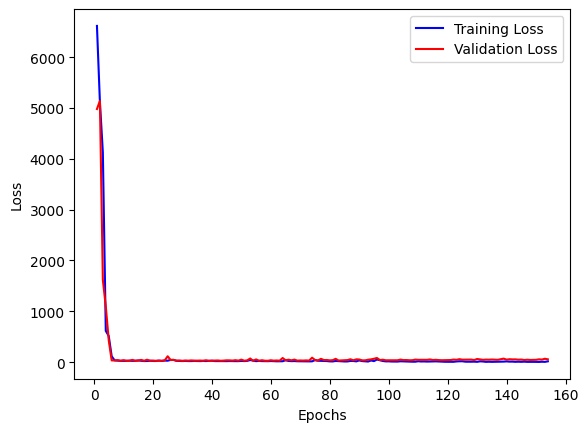

In [163]:
# Run model.fit() and store the training history
history = model.fit(bae_3d_im_train, bae_3d_ages_train, epochs=200, batch_size=16, validation_data=(bae_3d_im_test, bae_3d_ages_test), callbacks = callbacks)

# Access the loss values from the training history
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Access the number of epochs
epochs = range(1, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


Zoom in on the graph

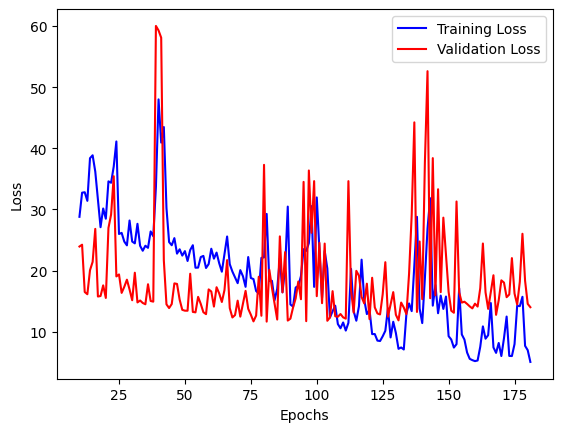

In [ ]:
epochs = range(10, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss[9:], 'b', label='Training Loss')
plt.plot(epochs, val_loss[9:], 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

We see that the model begins to over fit for high epochs and this is where the early stopping stops the models from training

In [172]:
saved_model = load_model('basic_model.h5')
predictions = saved_model.predict(bae_3d_im_test)


1/1 [==============================] - 0s 96ms/step


In [170]:
predictions = model.predict(bae_3d_im_test)


1/1 [==============================] - 0s 53ms/step


In [173]:
# Calculate different evaluation metrics
mse = mean_squared_error(bae_3d_ages_test, predictions)
mae = mean_absolute_error(bae_3d_ages_test, predictions)
r2 = r2_score(bae_3d_ages_test, predictions)

# Display the metrics
print("Mean Squared Error:", mse)
print("Mean Absolute Error:", mae)
print("R-squared:", r2)

Mean Squared Error: 26.272063991512237
Mean Absolute Error: 4.020945594424293
R-squared: -0.12310781506949375


The model has improved a very small amount

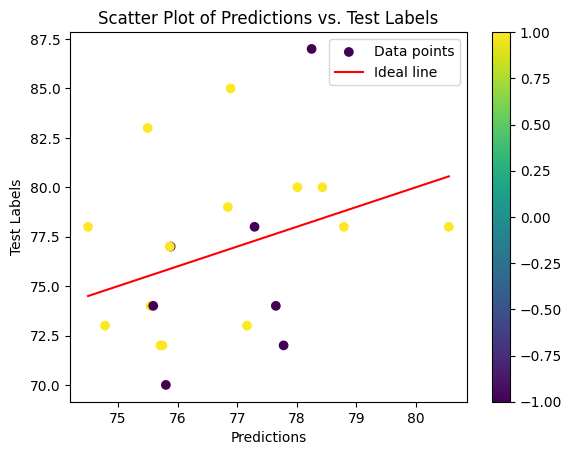

In [ ]:
# Assuming you have your data for predictions, test_labels, and sex_train
# Create a scatter plot
plt.scatter(predictions, test_labels, c=test_sex, cmap='viridis', label='Data points')
plt.plot([min(predictions), max(predictions)], [min(predictions), max(predictions)], c='red', label='Ideal line')

# Add labels and title
plt.xlabel('Predictions')
plt.ylabel('Test Labels')
plt.title('Scatter Plot of Predictions vs. Test Labels')

# Add a legend
plt.legend()

# Show the plot
plt.colorbar()  # Add a colorbar to show the mapping of colors to sex_train values
plt.show()



Somehow sex is now more scattered, we can still try adding it as a feature to see if it helps


###  V3
Adding sex as a feature with early stopping

In [ ]:

def compile_model():
    # Define the input layer for the 3D Convolutional network
    input_img = Input(shape=(79, 95, 68, 1))

    # Apply 3D Convolutional layers with MaxPooling using the Functional API
    x = Conv3D(32, kernel_size=(3, 3, 3), activation='relu')(input_img)
    x = MaxPooling3D(pool_size=(2, 2, 2))(x)
    x = Conv3D(64, kernel_size=(3, 3, 3), activation='relu')(x)
    x = MaxPooling3D(pool_size=(2, 2, 2))(x)

    # Flatten the output and add Dense layers for age prediction
    x = Flatten()(x)
    x = Dense(128, activation='relu')(x)
    output_img = Dense(16, activation='relu')(x)

    # Define the input layer for the extra feature
    input_extra = Input(shape=(1,))

    # Concatenate the output of the Convolutional network with the extra feature
    merged = concatenate([output_img, input_extra])

    # Add Dense layers for further prediction
    merged = Dense(8, activation='relu')(merged)
    output = Dense(1, activation='linear')(merged)  # Use 'linear' activation for regression tasks

    # Define the model with both inputs and the final output
    model = Model(inputs=[input_img, input_extra], outputs=output)

    # Compile the model
    model.compile(loss='mean_squared_error', optimizer='adam',metrics=[metrics.mean_absolute_error])
    return model


In [ ]:

def cross_validate(X, y, z, K = 5):
    scores = []
    histories = []
    r2 = []

    for train, test in StratifiedKFold(n_splits=K, shuffle=True).split(X,z):
        model = compile_model() # compile model
        histories.append(model.fit([X[train], z[train]], y[train],
                                   validation_data = ([X[test], z[test]],y[test]), epochs=200, batch_size=16 # feed in the test data for plotting
                                   ).history)
        scores.append(model.evaluate([X[test], z[test]], y[test], verbose = 0)) # evaluate the test dataset
        r2.append(r2_score(model.predict([X[test], z[test]]), y[test]))
    print(model.summary())
    return scores, histories, r2

In [ ]:
scores_112, histories_112, r2_112 = cross_validate(image_data, ages, sexes, K = 5)

In [ ]:
# Assuming you have your data for predictions, test_labels, and sex_train
# Create a scatter plot
model = compile_model()
X_train, X_test, y_train, y_test, sex_train, sex_test= train_test_split(image_data, ages, sexes, test_size=0.2)
model.fit([X_train, sex_train], y_train, epochs = 200, batch_size = 16)
predictions = model.predict([X_test, sex_test])

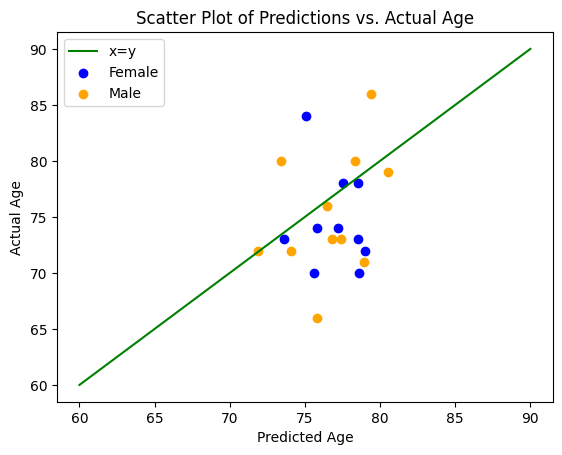

In [ ]:
color = {1:'orange',-1:'blue'}
label = {1:'Male',-1:'Female'}
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.plot([60,90], [60,90], c='green', label='x=y')

for g in [-1,1]:
    i = np.where(sex_test == g)
    plt.scatter(predictions[i], y_test[i], c=color[g], label = label[g])

# Add labels and title
plt.xlabel('Predicted Age')
plt.ylabel('Actual Age')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

In [ ]:
callbacks = [EarlyStopping(monitor='val_loss', patience=100),
             ModelCheckpoint(filepath='basic_sex_model.h5', monitor='val_loss', save_best_only=True)]

In [ ]:
# Run model.fit() and store the training history
history = model.fit([train_data, train_sex], train_labels, epochs=100, batch_size=16, validation_split=0.2, callbacks = callbacks)

# Access the loss values from the training history
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Access the number of epochs
epochs = range(1, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

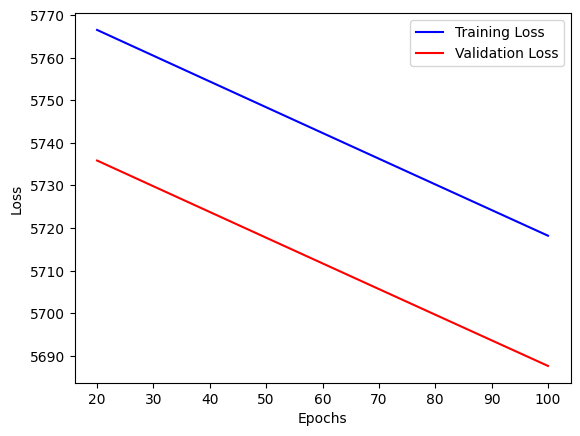

In [ ]:
epochs = range(20, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss[19:], 'b', label='Training Loss')
plt.plot(epochs, val_loss[19:], 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
saved_model = load_model('basic_sex_model.h5')
train_acc = saved_model.evaluate([train_data, train_sex], train_labels, verbose=0)
test_acc = saved_model.evaluate([test_data, test_sex], test_labels, verbose=0)
print('Train: %.3f, Test: %.3f' % (train_acc, test_acc))

Train: 20.991, Test: 18.977


In [ ]:
predictions = saved_model.predict([test_data, test_sex])
# Calculate different evaluation metrics
mse = mean_squared_error(test_labels, predictions)
mae = mean_absolute_error(test_labels, predictions)
r2 = r2_score(test_labels, predictions)

# Display the metrics
print("Mean Squared Error:", mse)
print("Mean Absolute Error:", mae)
print("R-squared:", r2)

1/1 [==============================] - 0s 98ms/step
Mean Squared Error: 18.97686843771953
Mean Absolute Error: 3.5381048293340776
R-squared: 0.024615503375953973


The model has improved slightly

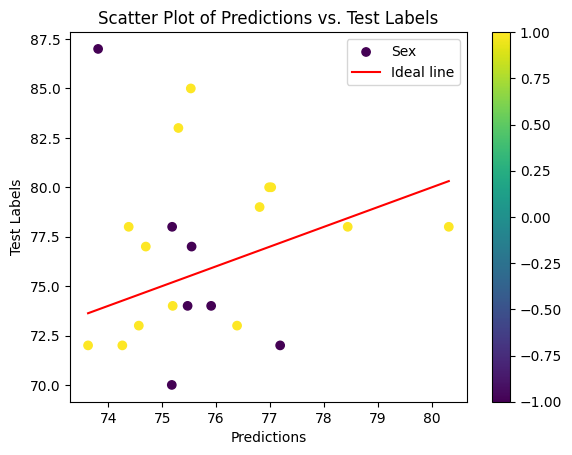

In [ ]:
# Assuming you have your data for predictions, test_labels, and sex_train
# Create a scatter plot
plt.scatter(predictions, test_labels, c=test_sex, cmap='viridis', label='Sex')
plt.plot([min(predictions), max(predictions)], [min(predictions), max(predictions)], c='red', label='Ideal line')

# Add labels and title
plt.xlabel('Predictions')
plt.ylabel('Test Labels')
plt.title('Scatter Plot of Predictions vs. Test Labels')

# Add a legend
plt.legend()

# Show the plot
plt.colorbar()  # Add a colorbar to show the mapping of colors to sex_train values
plt.show()



We see that after adding sex the poins are more equally spread however the model still does not perform too well, perhaps tuning the model will help

### V4
Tuning the model with bayesian optimisation, this is more effecient than grid and random search (typically)

In [ ]:
from keras.backend import dropout
import time
import optuna
from optuna.samplers import TPESampler
from sklearn.model_selection import cross_val_score
from keras.optimizers import Adam
import traceback
import gc

def create_model(kernel_size, num_layers, neurons1, neurons2, neurons3, learning_rate, dilation_rate, pool_size, dropout = dropout, activation = 'relu', strides=(1,1,1), padding='same'):
  # Define the input layer for the 3D Convolutional network
  input_img = Input(shape=(79, 95, 68, 1))
  x = Conv3D(neurons1, kernel_size=kernel_size, activation=activation, dilation_rate = dilation_rate)(input_img)
  x = MaxPooling3D(pool_size=pool_size)(x)
  x = Dropout(dropout)(x)
  # Apply 3D Convolutional layers with MaxPooling using the Functional API
  for i in range(num_layers):
    try:
      x = Conv3D(neurons1, kernel_size=kernel_size, activation=activation, dilation_rate = dilation_rate)(x)
      x = MaxPooling3D(pool_size=pool_size)(x)
      x = Dropout(dropout)(x)
    except:
      traceback.print_exc()
  # Flatten the output and add Dense layers for age prediction
  x = Flatten()(x)
  x = Dense(neurons2, activation=activation)(x)
  output_img = Dense(128, activation='relu')(x)
  # Define the input layer for the extra feature
  input_extra = Input(shape=(1,))
  # Concatenate the output of the Convolutional network with the extra feature
  merged = concatenate([output_img, input_extra])
  # Add Dense layers for further prediction
  merged = Dense(neurons3, activation=activation)(merged)
  output = Dense(1, activation='linear')(merged)  # Use 'linear' activation for regression tasks
  # Define the model with both inputs and the final output
  model = Model(inputs=[input_img, input_extra], outputs=output)
  optimizer = Adam(learning_rate=learning_rate)
  # Compile the model
  model.compile(loss='mean_squared_error', optimizer=optimizer)
  return model




def objective(trial, X = image_data,y=ages,z=sexes,K = 5):
    global the_best_score
    """return the mse"""
    num_layers = trial.suggest_int('num_layers', low = 1, high = 2, step = 1)
    neurons1 = trial.suggest_int('neurons1', low = 2, high = 64, step = 4)
    neurons2 = trial.suggest_int('neurons2', low = 2, high = 64, step = 4)
    neurons3 = trial.suggest_int('neurons3', low = 2, high = 64, step = 4)
    batch_size = trial.suggest_int('batch_size', low = 8, high = 64, step = 8)
    learning_rate = trial.suggest_float('learning_rate', low = 0.00001, high = 0.01, step = 0.0005)
    dropout = trial.suggest_float('dropout', low = 0.05, high =0.4, step =10)
    kernel_size = trial.suggest_int('kernel_size', low = 2, high =5, step =1)
    dilation_rate = trial.suggest_int('dilation_rate', low = 1, high =3, step =1)
    pool_size = trial.suggest_int('pool_size', low = 1, high =3, step =1)

    callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=25, start_from_epoch=50, baseline = 100)
    # random forest classifier object
    scores = []
    best_scores = []
    for train, test in StratifiedKFold(n_splits=K, shuffle=True).split(X,z):
        model = create_model(kernel_size = (kernel_size,kernel_size,kernel_size), num_layers = num_layers, neurons1 = neurons1, neurons2 = neurons2, neurons3 = neurons3, learning_rate = learning_rate, dilation_rate=(dilation_rate,dilation_rate,dilation_rate), pool_size=(pool_size,pool_size,pool_size), dropout=dropout)
        try:
          history = model.fit([X[train], z[train]], y[train],
                                    validation_data = ([X[test], z[test]],y[test]), epochs=125, batch_size=batch_size, callbacks= [callback]).history
          scores.append(model.evaluate([X[test], z[test]], y[test], verbose = 0))# evaluate the test dataset
          best_scores.append(min(history['val_loss']))
        except:
          traceback.print_exc()
          return(2000)
    the_best_score.append(np.mean(best_scores))
    return(np.mean(scores))


the_best_score = []
# create a study (aim to maximize score)
study = optuna.create_study(sampler=TPESampler(), direction='minimize')

# perform hyperparamter tuning (while timing the process)
time_start = time.time()
study.optimize(objective, n_trials=20, gc_after_trial=True)
time_bayesian = time.time() - time_start

columns = ['Number of iterations', 'Iteration Number of Optimal Hyperparamters', 'Score', 'Time Elapsed (s)']

# store result in a data frame
values_bayesian = [100, study.best_trial.number, study.best_trial.value, time_bayesian]
results_bayesian = pd.DataFrame([values_bayesian], columns = columns)

In [ ]:
values = [study.trials[i].values[0] for i in range(len(study.trials))]
params = [study.trials[i].params for i in range(len(study.trials))]
columns = list(params[0].keys()) + ['val']
bayesian_results = pd.DataFrame(columns = columns)
bayesian_results['val'] = values
for param in list(params[0].keys()):
  param_list = [study[param] for study in params]
  bayesian_results[param] = param_list

In [ ]:
bayesian_results.sort_values(by=['val'])

In [ ]:
optuna.visualization.plot_contour(study)

In [ ]:
optuna.visualization.plot_param_importances(study)

Tuning the model seems to make no real improvement, therefore other approaches must be taken, transfer learning can help as we only have 100 images

### PIP installs for BO and 3D VGG

In [27]:
pip install keras_applications

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 1.5 MB/s eta 0:00:00


In [28]:
pip install classification-models-3D

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.5/69.5 kB 2.0 MB/s eta 0:00:00


In [29]:
pip install optuna

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 404.2/404.2 kB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 225.4/225.4 kB 31.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 kB 12.6 MB/s eta 0:00:00


In [30]:
import optuna
from optuna.samplers import TPESampler



### Version 5 no fine tuning

In [ ]:
from classification_models_3D.tfkeras import Classifiers

vgg19, preprocess_input = Classifiers.get('vgg19')
pretrained_model = vgg19(input_shape=(79, 95, 68, 3), weights='imagenet')

In [ ]:
def compile_model():

  # Define the input layer for the 3D Convolutional network
  model = Sequential()

  for layer in pretrained_model.layers:
      model.add(layer)

  # Freeze the weights of the pre-trained layers so they are not updated during training
  for layer in model.layers:
      layer.trainable = False


  # Flatten the output of the pre-trained model
  x = Flatten()(model.output)

  # Add Dense layers after concatenation
  x = Dense(256, activation='relu')(x)
  x = Dense(64, activation='relu')(x)

  additional_input = Input(shape=(1,))
  # Concatenate the flattened output with the new input
  concatenated = concatenate([x, additional_input])
  output = Dense(1, activation='linear')(concatenated)  # Use 'linear' activation for regression tasks

  # Create the final model
  model = Model(inputs=[pretrained_model.input, additional_input], outputs=output)

  for layer in model.layers[23:]:
            layer.trainable = True

  METRICS = [keras.metrics.MeanAbsoluteError(name='mae')]

  # Compile the model
  model.compile(loss='mean_squared_error', optimizer='adam', metrics=METRICS)

  return(model)

As this cnn takes in rgb input we must duplicate each image twice so that the input shapes match

In [ ]:
duplicated_data = np.repeat(image_data, 3, axis=-1)
print(duplicated_data.shape)

(102, 79, 95, 68, 3)


In [ ]:
from sklearn.model_selection import StratifiedKFold

def cross_validate(X, y, z, K = 5):
    scores = []
    histories = []
    r2 = []

    for train, test in StratifiedKFold(n_splits=K, shuffle=True).split(X,z):
        model = compile_model() # compile model
        histories.append(model.fit([X[train], z[train]], y[train],
                                   validation_data = ([X[test], z[test]],y[test]), epochs=200, batch_size=16 # feed in the test data for plotting
                                   ).history)
        scores.append(model.evaluate([X[test], z[test]], y[test], verbose = 0)) # evaluate the test dataset
        r2.append(r2_score(model.predict([X[test], z[test]]), y[test]))
    print(model.summary())
    return scores, histories, r2

In [ ]:
scores_115, histories_115, r2_115 = cross_validate(duplicated_data, ages, sexes, K = 5)

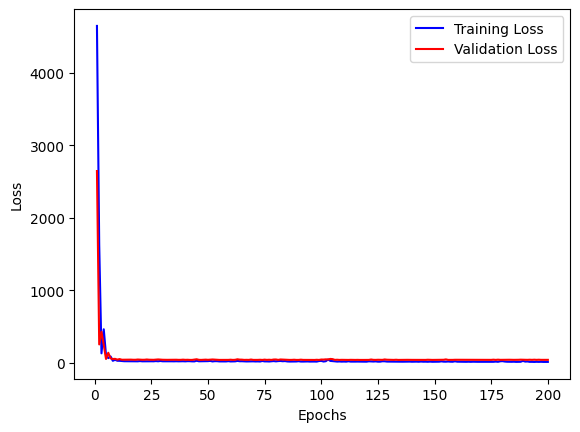

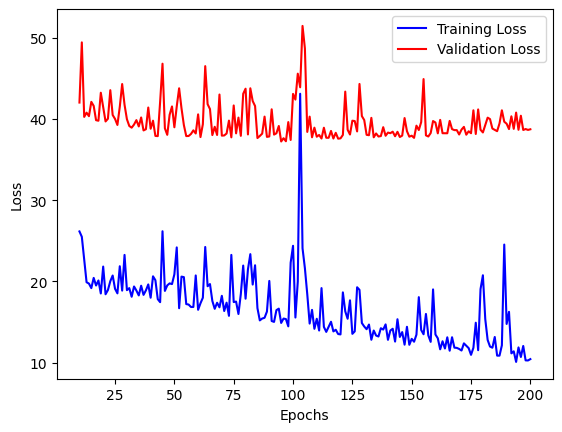

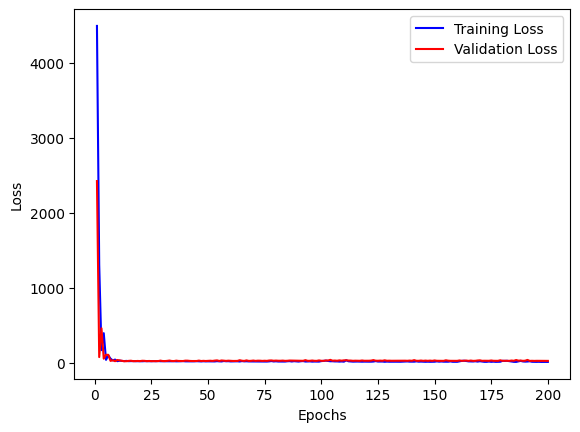

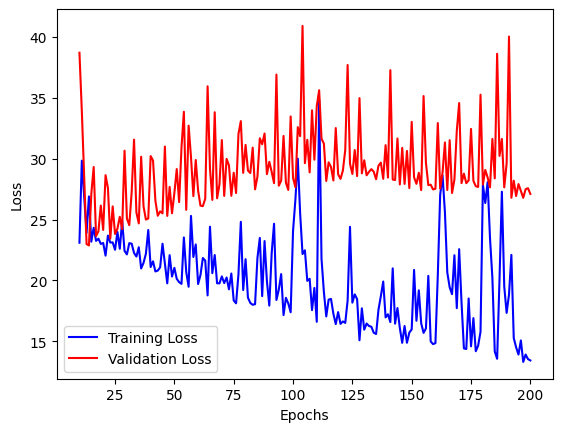

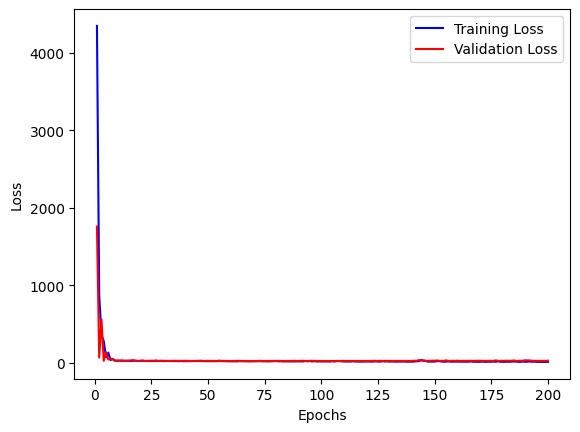

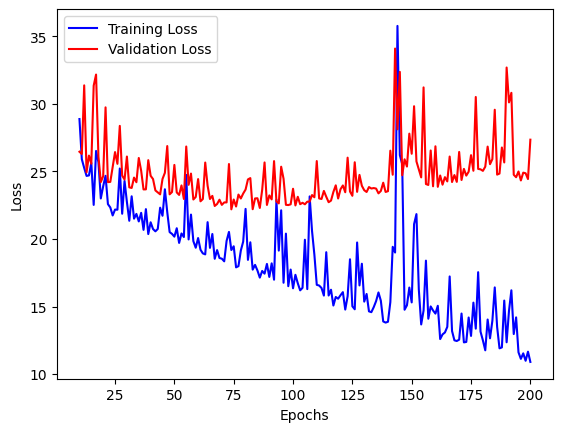

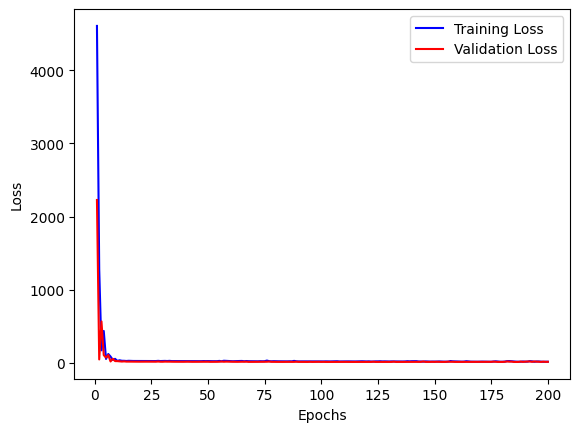

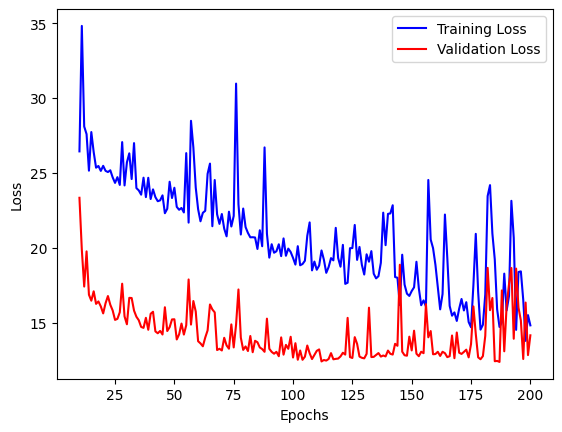

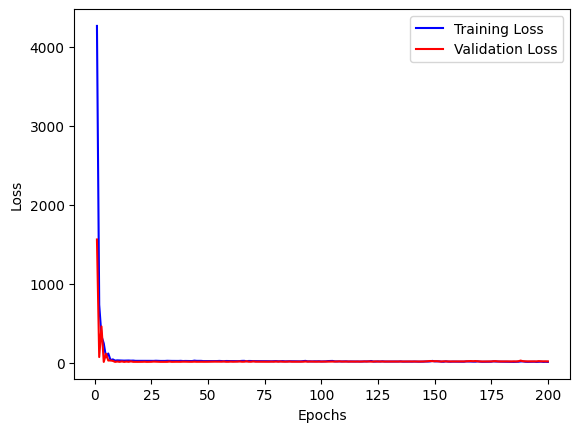

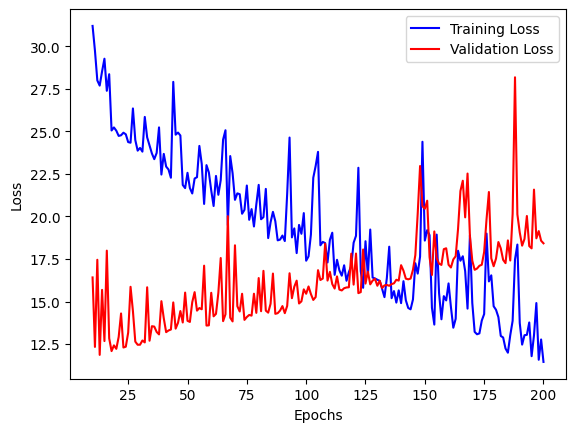

In [ ]:
for history in (histories_115):
  # Access the loss values from the training history
  train_loss = history['loss']
  val_loss = history['val_loss']

  # Access the number of epochs
  epochs = range(1, len(train_loss) + 1)

  # Plot the training and validation curves
  plt.plot(epochs, train_loss, 'b', label='Training Loss')
  plt.plot(epochs, val_loss, 'r', label='Validation Loss')
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()
  epochs = range(10, len(train_loss) + 1)

  # Plot the training and validation curves
  plt.plot(epochs, train_loss[9:], 'b', label='Training Loss')
  plt.plot(epochs, val_loss[9:], 'r', label='Validation Loss')
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

In [ ]:
dup_bae_3d_im_train = np.repeat(bae_3d_im_train, 3, axis=-1)
dup_bae_3d_im_test = np.repeat(bae_3d_im_test, 3, axis=-1)

model = compile_model()

In [ ]:
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, start_from_epoch=10, baseline = 50)
history = model.fit([dup_bae_3d_im_train, bae_3d_sexes_train], bae_3d_ages_train, validation_data= ([dup_bae_3d_im_test, bae_3d_sexes_test], bae_3d_ages_test), epochs = 100, batch_size = 16, callbacks =[callback]).history


Epoch 1/100
6/6 [==============================] - 10s 2s/step - loss: 4509.7544 - mae: 66.8506 - val_loss: 2929.5027 - val_mae: 53.9292
Epoch 2/100
6/6 [==============================] - 10s 2s/step - loss: 1872.4474 - mae: 42.2503 - val_loss: 513.2653 - val_mae: 22.2073
Epoch 3/100
6/6 [==============================] - 11s 2s/step - loss: 171.1388 - mae: 10.7153 - val_loss: 193.8350 - val_mae: 13.1940
Epoch 4/100
6/6 [==============================] - 10s 2s/step - loss: 429.8904 - mae: 20.0234 - val_loss: 316.1963 - val_mae: 17.2167
Epoch 5/100
6/6 [==============================] - 10s 2s/step - loss: 207.0587 - mae: 12.8802 - val_loss: 21.8537 - val_mae: 3.7059
Epoch 6/100
6/6 [==============================] - 10s 2s/step - loss: 53.6144 - mae: 6.0504 - val_loss: 158.7791 - val_mae: 11.7827
Epoch 7/100
6/6 [==============================] - 10s 2s/step - loss: 124.6684 - mae: 10.2825 - val_loss: 112.9653 - val_mae: 9.6458
Epoch 8/100
6/6 [==============================] - 10s 2s

In [ ]:
predictions = model.predict([dup_bae_3d_im_test, bae_3d_sexes_test])

1/1 [==============================] - 0s 300ms/step


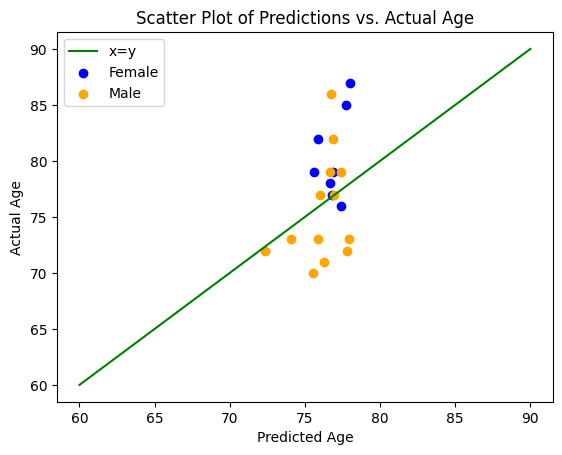

In [ ]:
color = {1:'orange',-1:'blue'}
label = {1:'Male',-1:'Female'}
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.plot([60,90], [60,90], c='green', label='x=y')

for g in [-1,1]:
    i = np.where(bae_3d_sexes_test == g)
    plt.scatter(predictions[i], bae_3d_ages_test[i], c=color[g], label = label[g])

# Add labels and title
plt.xlabel('Predicted Age')
plt.ylabel('Actual Age')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

In [ ]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

def evaluate_predictions(predictions, true_values):
    # Calculate R^2
    r2 = r2_score(true_values, predictions)

    # Calculate MSE
    mse = mean_squared_error(true_values, predictions)

    # Calculate RMSE
    rmse = np.sqrt(mse)

    # Calculate MAE
    mae = mean_absolute_error(true_values, predictions)

    return r2, rmse, mse, mae

# Sample data


r2, rmse, mse, mae = evaluate_predictions(predictions, bae_3d_ages_test)
print(f"R^2: {r2}")
print(f"RMSE: {rmse}")
print(f"MSE: {mse}")
print(f"MAE: {mae}")


R^2: 0.10758218365706085
RMSE: 4.568992950712369
MSE: 20.875696583659323
MAE: 3.6234228951590404


### Version 4 no fine tuning

In [ ]:
from classification_models_3D.tfkeras import Classifiers

vgg16, preprocess_input = Classifiers.get('vgg16')
pretrained_model = vgg16(input_shape=(79, 95, 68, 3), weights='imagenet')

In [ ]:
def compile_model():

  # Define the input layer for the 3D Convolutional network
  model = Sequential()

  for layer in pretrained_model.layers:
      model.add(layer)

  # Freeze the weights of the pre-trained layers so they are not updated during training
  for layer in model.layers:
      layer.trainable = False


  # Flatten the output of the pre-trained model
  x = Flatten()(model.output)

  # Add Dense layers after concatenation
  x = Dense(256, activation='relu')(x)
  x = Dense(64, activation='relu')(x)

  additional_input = Input(shape=(1,))
  # Concatenate the flattened output with the new input
  concatenated = concatenate([x, additional_input])
  output = Dense(1, activation='linear')(concatenated)  # Use 'linear' activation for regression tasks

  # Create the final model
  model = Model(inputs=[pretrained_model.input, additional_input], outputs=output)

  for layer in model.layers[20:]:
            layer.trainable = True

  METRICS = [keras.metrics.MeanAbsoluteError(name='mae')]

  # Compile the model
  model.compile(loss='mean_squared_error', optimizer='adam', metrics=METRICS)

  return(model)

In [ ]:
dup_bae_3d_im_train = np.repeat(bae_3d_im_train, 3, axis=-1)
dup_bae_3d_im_test = np.repeat(bae_3d_im_test, 3, axis=-1)

model = compile_model()

In [ ]:
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, start_from_epoch=10, baseline = 50)
history = model.fit([dup_bae_3d_im_train, bae_3d_sexes_train], bae_3d_ages_train, validation_data= ([dup_bae_3d_im_test, bae_3d_sexes_test], bae_3d_ages_test), epochs = 200, batch_size = 16, callbacks =[callback]).history

Epoch 1/200
6/6 [==============================] - 17s 3s/step - loss: 2118.8062 - mse: 2118.8062 - mae: 39.6291 - val_loss: 40.2388 - val_mse: 40.2388 - val_mae: 5.0606
Epoch 2/200
6/6 [==============================] - 9s 2s/step - loss: 286.8680 - mse: 286.8680 - mae: 15.1327 - val_loss: 23.9797 - val_mse: 23.9797 - val_mae: 3.9794
Epoch 3/200
6/6 [==============================] - 9s 2s/step - loss: 209.3670 - mse: 209.3670 - mae: 12.5895 - val_loss: 27.0600 - val_mse: 27.0600 - val_mae: 4.2433
Epoch 4/200
6/6 [==============================] - 9s 2s/step - loss: 81.7718 - mse: 81.7718 - mae: 7.7214 - val_loss: 99.9086 - val_mse: 99.9086 - val_mae: 8.7136
Epoch 5/200
6/6 [==============================] - 9s 2s/step - loss: 42.4092 - mse: 42.4092 - mae: 5.3941 - val_loss: 30.8401 - val_mse: 30.8401 - val_mae: 4.6959
Epoch 6/200
6/6 [==============================] - 9s 1s/step - loss: 33.3838 - mse: 33.3838 - mae: 4.5673 - val_loss: 54.5408 - val_mse: 54.5408 - val_mae: 5.8317
Epoc

In [ ]:
predictions = model.predict([dup_bae_3d_im_test, bae_3d_sexes_test])

1/1 [==============================] - 0s 276ms/step


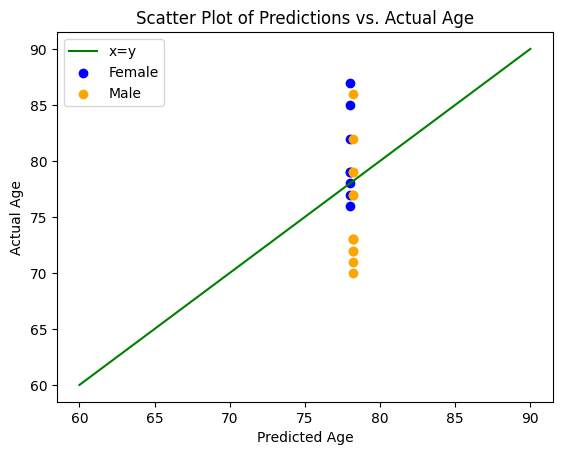

In [ ]:
color = {1:'orange',-1:'blue'}
label = {1:'Male',-1:'Female'}
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.plot([60,90], [60,90], c='green', label='x=y')

for g in [-1,1]:
    i = np.where(bae_3d_sexes_test == g)
    plt.scatter(predictions[i], bae_3d_ages_test[i], c=color[g], label = label[g])

# Add labels and title
plt.xlabel('Predicted Age')
plt.ylabel('Actual Age')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

In [ ]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

def evaluate_predictions(predictions, true_values):
    # Calculate R^2
    r2 = r2_score(true_values, predictions)

    # Calculate MSE
    mse = mean_squared_error(true_values, predictions)

    # Calculate RMSE
    rmse = np.sqrt(mse)

    # Calculate MAE
    mae = mean_absolute_error(true_values, predictions)

    return r2, rmse, mse, mae

# Sample data


r2, rmse, mse, mae = evaluate_predictions(predictions, bae_3d_ages_test)
print(f"R^2: {r2}")
print(f"RMSE: {rmse}")
print(f"MSE: {mse}")
print(f"MAE: {mae}")


R^2: -0.5425256889744725
RMSE: 6.006930050674607
MSE: 36.08320863369764
MAE: 5.041613624209449


### Version 4 fine-tuning v2

In [ ]:
from classification_models_3D.tfkeras import Classifiers

vgg16, preprocess_input = Classifiers.get('vgg16')
pretrained_model = vgg16(input_shape=(79, 95, 68, 3), weights='imagenet')

In [ ]:
import keras.backend as K
from tensorflow.keras.initializers import GlorotUniform
import random
def compile_model():

  # Define the input layer for the 3D Convolutional network
  model = Sequential()

  for layer in pretrained_model.layers:
      model.add(layer)

  # Freeze the weights of the pre-trained layers so they are not updated during training
  for layer in model.layers:
      layer.trainable = False


  # Flatten the output of the pre-trained model
  x = Flatten()(model.output)

  # Add Dense layers after concatenation
  x = Dense(256, activation='relu')(x)
  x = Dense(64, activation='relu')(x)

  additional_input = Input(shape=(1,))
  # Concatenate the flattened output with the new input
  concatenated = concatenate([x, additional_input])
  output = Dense(1, activation='linear')(concatenated)  # Use 'linear' activation for regression tasks

  # Create the final model
  model = Model(inputs=[pretrained_model.input, additional_input], outputs=output)

  for layer in model.layers[15:]:
            layer.trainable = True

  session = K.get_session()
  for layer in model.layers[15:19]:
      if layer.get_weights():
        weights_shape = layer.get_weights()[0].shape
        bias_shape = layer.get_weights()[1].shape

        # Re-initialize weights and biases
        new_weights = GlorotUniform()(weights_shape).numpy()
        new_biases = GlorotUniform()(bias_shape).numpy()

        layer.set_weights([new_weights, new_biases])




  METRICS = [keras.metrics.MeanAbsoluteError(name='mae')]

  # Compile the model
  model.compile(loss='mean_squared_error', optimizer='adam', metrics=METRICS)

  return(model)

In [ ]:
dup_bae_3d_im_train = np.repeat(bae_3d_im_train, 3, axis=-1)
dup_bae_3d_im_test = np.repeat(bae_3d_im_test, 3, axis=-1)

model = compile_model()

In [ ]:
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, start_from_epoch=10, baseline = 50)
history = model.fit([dup_bae_3d_im_train, bae_3d_sexes_train], bae_3d_ages_train, validation_data= ([dup_bae_3d_im_test, bae_3d_sexes_test], bae_3d_ages_test), epochs = 200, batch_size = 16, callbacks =[callback]).history

Epoch 1/200
6/6 [==============================] - 12s 2s/step - loss: 499242.0625 - mae: 376.5577 - val_loss: 1181.7386 - val_mae: 34.0078
Epoch 2/200
6/6 [==============================] - 10s 2s/step - loss: 1312.9357 - mae: 31.1180 - val_loss: 616.8050 - val_mae: 24.3045
Epoch 3/200
6/6 [==============================] - 10s 2s/step - loss: 375.3654 - mae: 16.7743 - val_loss: 274.2664 - val_mae: 15.7258
Epoch 4/200
6/6 [==============================] - 9s 2s/step - loss: 108.6578 - mae: 8.5633 - val_loss: 57.2607 - val_mae: 6.0682
Epoch 5/200
6/6 [==============================] - 9s 2s/step - loss: 153.5462 - mae: 10.8866 - val_loss: 103.2562 - val_mae: 8.9659
Epoch 6/200
6/6 [==============================] - 9s 2s/step - loss: 91.0633 - mae: 8.2239 - val_loss: 90.1188 - val_mae: 7.8995
Epoch 7/200
6/6 [==============================] - 9s 2s/step - loss: 48.1290 - mae: 5.3346 - val_loss: 45.9017 - val_mae: 5.5709
Epoch 8/200
6/6 [==============================] - 9s 1s/step - l

In [ ]:
predictions = model.predict([dup_bae_3d_im_test, bae_3d_sexes_test])

1/1 [==============================] - 0s 286ms/step


In [ ]:
for layer in model.layers:
    if layer.trainable:
        print(f"Layer {layer.name} is trainable (not frozen).")
    else:
        print(f"Layer {layer.name} is not trainable (frozen).")


Layer input_61 is trainable (not frozen).
Layer block1_conv1 is not trainable (frozen).
Layer block1_conv2 is not trainable (frozen).
Layer block1_pool is not trainable (frozen).
Layer block2_conv1 is not trainable (frozen).
Layer block2_conv2 is not trainable (frozen).
Layer block2_pool is not trainable (frozen).
Layer block3_conv1 is not trainable (frozen).
Layer block3_conv2 is not trainable (frozen).
Layer block3_conv3 is not trainable (frozen).
Layer block3_pool is not trainable (frozen).
Layer block4_conv1 is not trainable (frozen).
Layer block4_conv2 is not trainable (frozen).
Layer block4_conv3 is not trainable (frozen).
Layer block4_pool is not trainable (frozen).
Layer block5_conv1 is trainable (not frozen).
Layer block5_conv2 is trainable (not frozen).
Layer block5_conv3 is trainable (not frozen).
Layer block5_pool is trainable (not frozen).
Layer flatten_61 is trainable (not frozen).
Layer dense_183 is trainable (not frozen).
Layer dense_184 is trainable (not frozen).
Layer

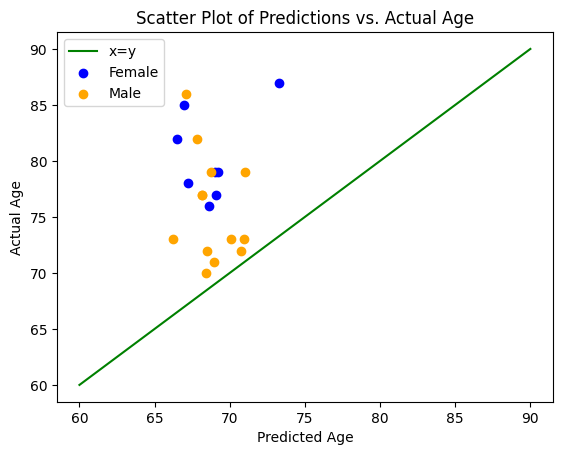

In [ ]:
color = {1:'orange',-1:'blue'}
label = {1:'Male',-1:'Female'}
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.plot([60,90], [60,90], c='green', label='x=y')

for g in [-1,1]:
    i = np.where(bae_3d_sexes_test == g)
    plt.scatter(predictions[i], bae_3d_ages_test[i], c=color[g], label = label[g])

# Add labels and title
plt.xlabel('Predicted Age')
plt.ylabel('Actual Age')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

In [ ]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

def evaluate_predictions(predictions, true_values):
    # Calculate R^2
    r2 = r2_score(true_values, predictions)

    # Calculate MSE
    mse = mean_squared_error(true_values, predictions)

    # Calculate RMSE
    rmse = np.sqrt(mse)

    # Calculate MAE
    mae = mean_absolute_error(true_values, predictions)

    return r2, rmse, mse, mae

# Sample data


r2, rmse, mse, mae = evaluate_predictions(predictions, bae_3d_ages_test)
print(f"R^2: {r2}")
print(f"RMSE: {rmse}")
print(f"MSE: {mse}")
print(f"MAE: {mae}")


R^2: -3.3612832460244286
RMSE: 10.10051501414622
MSE: 102.02040355099321
MAE: 8.672603062220983


### Version 4 BO old gen

In [ ]:
from classification_models_3D.tfkeras import Classifiers

vgg16, preprocess_input = Classifiers.get('vgg16')
pretrained_model = vgg16(input_shape=(79, 95, 68, 3), weights='imagenet')

In [ ]:
def create_model(num_ft_layers, neurons1, neurons2):

  # Define the input layer for the 3D Convolutional network
  model = Sequential()

  for layer in pretrained_model.layers:
      model.add(layer)

  # Freeze the weights of the pre-trained layers so they are not updated during training
  for layer in model.layers:
      layer.trainable = False


  # Flatten the output of the pre-trained model
  x = Flatten()(model.output)

  # Add Dense layers after concatenation
  x = Dense(neurons1, activation='relu')(x)

  x = Dense(neurons2, activation='relu')(x)

  additional_input = Input(shape=(1,))
  concatenated = concatenate([x, additional_input])
  # Concatenate the flattened output with the new input

  output = Dense(1, activation='linear')(concatenated)  # Use 'linear' activation for regression tasks

  # Create the final model
  model = Model(inputs=[pretrained_model.input, additional_input], outputs=output)

  for layer in model.layers[len(pretrained_model.layers)- num_ft_layers:]:
            layer.trainable = True

  METRICS = [keras.metrics.MeanAbsoluteError(name='mae')]

  # Compile the model
  model.compile(loss='mean_squared_error', optimizer='adam', metrics=METRICS)

  return(model)

In [ ]:
dup_bae_3d_im_train = np.repeat(bae_3d_im_train, 3, axis=-1)
dup_bae_3d_im_test = np.repeat(bae_3d_im_test, 3, axis=-1)

In [ ]:
from keras.backend import dropout
import time
import optuna
from optuna.samplers import TPESampler
from sklearn.model_selection import cross_val_score
from keras.optimizers import Adam
import traceback

def objective(trial, X = dup_bae_3d_im_train, y = bae_3d_ages_train, z = bae_3d_sexes_train,K = 3):
    global the_best_score
    """return the mse"""
    num_ft_layers = trial.suggest_int('num_layers', low = 0, high = 8, step = 1)
    neurons1 = trial.suggest_int('neurons1', low = 2, high = 256, step = 16)
    neurons2 = trial.suggest_int('neurons2', low = 2, high = 256, step = 16)
    batch_size = trial.suggest_int('batch_size', low = 8, high = 16, step = 1)


    callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, start_from_epoch=10, baseline = 50)
    # random forest classifier object
    scores = []
    best_scores = []
    for train, test in StratifiedKFold(n_splits=K, shuffle=True).split(X,z):
        model = create_model(num_ft_layers = num_ft_layers, neurons1 = neurons1, neurons2 = neurons2)
        try:
          history = model.fit([X[train], z[train]], y[train],
                                    validation_data = ([X[test], z[test]],y[test]), epochs=100, batch_size=batch_size, callbacks= [callback]).history
          scores.append(model.evaluate([X[test], z[test]], y[test], verbose = 0))# evaluate the test dataset
          best_scores.append(min(history['val_loss']))
        except:
          traceback.print_exc()
          return(2000)
    the_best_score.append(np.mean(best_scores))
    return(np.mean(scores))


the_best_score = []
# create a study (aim to maximize score)
study = optuna.create_study(sampler=TPESampler(), direction='minimize')

# perform hyperparamter tuning (while timing the process)
time_start = time.time()
study.optimize(objective, n_trials=5, gc_after_trial=True)
time_bayesian = time.time() - time_start

columns = ['Number of iterations', 'Iteration Number of Optimal Hyperparamters', 'Score', 'Time Elapsed (s)']

# store result in a data frame
values_bayesian = [100, study.best_trial.number, study.best_trial.value, time_bayesian]
results_bayesian = pd.DataFrame([values_bayesian], columns = columns)


[I 2023-08-27 19:44:21,431] A new study created in memory with name: no-name-8552fa5f-43c6-4924-ac6e-9de030c8aaa7
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 256] and step=16, but the range is not divisible by `step`. It will be replaced by [2, 242].
  warnings.warn(


Epoch 1/100
4/4 [==============================] - 35s 6s/step - loss: 3874.7957 - mae: 60.9660 - val_loss: 388.5290 - val_mae: 18.9716
Epoch 2/100
4/4 [==============================] - 8s 2s/step - loss: 502.8992 - mae: 21.3821 - val_loss: 72.4673 - val_mae: 7.0550
Epoch 3/100
4/4 [==============================] - 8s 2s/step - loss: 159.6186 - mae: 10.7374 - val_loss: 293.2043 - val_mae: 16.2571
Epoch 4/100
4/4 [==============================] - 8s 2s/step - loss: 128.7793 - mae: 8.8358 - val_loss: 121.3681 - val_mae: 9.6153
Epoch 5/100
4/4 [==============================] - 8s 2s/step - loss: 129.7841 - mae: 10.3931 - val_loss: 33.3383 - val_mae: 4.8223
Epoch 6/100
4/4 [==============================] - 8s 2s/step - loss: 46.8958 - mae: 5.7990 - val_loss: 74.8837 - val_mae: 7.2271
Epoch 7/100
4/4 [==============================] - 8s 2s/step - loss: 36.6199 - mae: 4.8440 - val_loss: 34.1089 - val_mae: 4.8735
Epoch 8/100
4/4 [==============================] - 8s 2s/step - loss: 29.6

[I 2023-08-27 19:57:50,237] Trial 0 finished with value: 13.479734619458517 and parameters: {'num_layers': 7, 'neurons1': 18, 'neurons2': 98, 'batch_size': 14}. Best is trial 0 with value: 13.479734619458517.
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 256] and step=16, but the range is not divisible by `step`. It will be replaced by [2, 242].
  warnings.warn(


Epoch 1/100
5/5 [==============================] - 18s 4s/step - loss: 2771.7520 - mae: 43.7115 - val_loss: 360.7971 - val_mae: 18.3561
Epoch 2/100
5/5 [==============================] - 8s 2s/step - loss: 647.6658 - mae: 24.6932 - val_loss: 206.3732 - val_mae: 13.5101
Epoch 3/100
5/5 [==============================] - 8s 2s/step - loss: 120.4936 - mae: 9.5223 - val_loss: 263.9986 - val_mae: 15.4968
Epoch 4/100
5/5 [==============================] - 8s 2s/step - loss: 265.8612 - mae: 15.5413 - val_loss: 80.9646 - val_mae: 7.9793
Epoch 5/100
5/5 [==============================] - 8s 2s/step - loss: 49.1378 - mae: 6.0808 - val_loss: 124.8174 - val_mae: 10.0483
Epoch 6/100
5/5 [==============================] - 8s 2s/step - loss: 106.8012 - mae: 9.1877 - val_loss: 34.5752 - val_mae: 4.6985
Epoch 7/100
5/5 [==============================] - 8s 2s/step - loss: 31.2985 - mae: 4.3749 - val_loss: 64.6899 - val_mae: 6.8989
Epoch 8/100
5/5 [==============================] - 8s 2s/step - loss: 57

[I 2023-08-27 20:09:28,267] Trial 1 finished with value: 13.172015269597372 and parameters: {'num_layers': 2, 'neurons1': 34, 'neurons2': 210, 'batch_size': 12}. Best is trial 1 with value: 13.172015269597372.
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 256] and step=16, but the range is not divisible by `step`. It will be replaced by [2, 242].
  warnings.warn(


Epoch 1/100
4/4 [==============================] - 23s 2s/step - loss: 2181.5881 - mae: 43.6818 - val_loss: 42.4530 - val_mae: 5.4969
Epoch 2/100
4/4 [==============================] - 7s 2s/step - loss: 236.3361 - mae: 12.9840 - val_loss: 542.9593 - val_mae: 22.7059
Epoch 3/100
4/4 [==============================] - 7s 2s/step - loss: 242.0422 - mae: 13.7384 - val_loss: 64.1327 - val_mae: 7.1933
Epoch 4/100
4/4 [==============================] - 7s 2s/step - loss: 146.9712 - mae: 11.0344 - val_loss: 71.9999 - val_mae: 7.6736
Epoch 5/100
4/4 [==============================] - 7s 2s/step - loss: 41.9375 - mae: 5.2153 - val_loss: 126.8853 - val_mae: 9.9742
Epoch 6/100
4/4 [==============================] - 7s 2s/step - loss: 89.0718 - mae: 8.2178 - val_loss: 39.9450 - val_mae: 4.8008
Epoch 7/100
4/4 [==============================] - 7s 2s/step - loss: 27.3621 - mae: 4.3668 - val_loss: 47.2104 - val_mae: 5.9410
Epoch 8/100
4/4 [==============================] - 7s 2s/step - loss: 43.8691

[I 2023-08-27 20:20:41,869] Trial 2 finished with value: 13.606011033058167 and parameters: {'num_layers': 2, 'neurons1': 18, 'neurons2': 50, 'batch_size': 15}. Best is trial 1 with value: 13.172015269597372.
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 256] and step=16, but the range is not divisible by `step`. It will be replaced by [2, 242].
  warnings.warn(


Epoch 1/100
4/4 [==============================] - 21s 6s/step - loss: 1782.2389 - mae: 35.2478 - val_loss: 575.8128 - val_mae: 23.6051
Epoch 2/100
4/4 [==============================] - 8s 2s/step - loss: 243.6787 - mae: 13.0717 - val_loss: 276.4283 - val_mae: 16.0567
Epoch 3/100
4/4 [==============================] - 8s 2s/step - loss: 116.8547 - mae: 8.6233 - val_loss: 113.3078 - val_mae: 9.7312
Epoch 4/100
4/4 [==============================] - 8s 2s/step - loss: 114.2952 - mae: 9.4855 - val_loss: 37.5998 - val_mae: 4.5639
Epoch 5/100
4/4 [==============================] - 7s 2s/step - loss: 70.0338 - mae: 7.3442 - val_loss: 41.5017 - val_mae: 4.9275
Epoch 6/100
4/4 [==============================] - 7s 2s/step - loss: 39.4036 - mae: 5.0287 - val_loss: 32.7104 - val_mae: 5.0156
Epoch 7/100
4/4 [==============================] - 7s 2s/step - loss: 34.2907 - mae: 4.5606 - val_loss: 45.5063 - val_mae: 5.2696
Epoch 8/100
4/4 [==============================] - 7s 2s/step - loss: 35.5405

[I 2023-08-27 20:33:53,283] Trial 3 finished with value: 13.828322410583496 and parameters: {'num_layers': 7, 'neurons1': 50, 'neurons2': 178, 'batch_size': 16}. Best is trial 1 with value: 13.172015269597372.
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 256] and step=16, but the range is not divisible by `step`. It will be replaced by [2, 242].
  warnings.warn(


Epoch 1/100
6/6 [==============================] - 11s 2s/step - loss: 3025.9688 - mae: 51.1299 - val_loss: 30.0947 - val_mae: 4.7055
Epoch 2/100
6/6 [==============================] - 8s 1s/step - loss: 473.3894 - mae: 18.4265 - val_loss: 120.6398 - val_mae: 9.8133
Epoch 3/100
6/6 [==============================] - 8s 1s/step - loss: 315.5076 - mae: 16.6086 - val_loss: 167.7444 - val_mae: 11.9121
Epoch 4/100
6/6 [==============================] - 8s 1s/step - loss: 105.8206 - mae: 9.1164 - val_loss: 107.1502 - val_mae: 9.0168
Epoch 5/100
6/6 [==============================] - 8s 1s/step - loss: 57.6011 - mae: 6.4885 - val_loss: 143.8156 - val_mae: 10.8613
Epoch 6/100
6/6 [==============================] - 8s 1s/step - loss: 65.5323 - mae: 6.9692 - val_loss: 35.8058 - val_mae: 4.9979
Epoch 7/100
6/6 [==============================] - 8s 1s/step - loss: 48.3066 - mae: 5.9704 - val_loss: 46.3765 - val_mae: 5.3764
Epoch 8/100
6/6 [==============================] - 8s 1s/step - loss: 35.43

[I 2023-08-27 20:47:17,191] Trial 4 finished with value: 14.94538938999176 and parameters: {'num_layers': 4, 'neurons1': 34, 'neurons2': 162, 'batch_size': 9}. Best is trial 1 with value: 13.172015269597372.


In [ ]:
values = [study.trials[i].values[0] for i in range(len(study.trials))]
params = [study.trials[i].params for i in range(len(study.trials))]
columns = list(params[0].keys()) + ['val']
bayesian_results = pd.DataFrame(columns = columns)
bayesian_results['val'] = values
for param in list(params[0].keys()):
  param_list = [study[param] for study in params]
  bayesian_results[param] = param_list

In [ ]:
bayesian_results.sort_values(by=['val'])

,num_layers,neurons1,neurons2,batch_size,val
1,2,34,210,12,13.172015
0,7,18,98,14,13.479735
2,2,18,50,15,13.606011
3,7,50,178,16,13.828322
4,4,34,162,9,14.945389


In [ ]:
optuna.visualization.plot_param_importances(study)

In [ ]:
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, start_from_epoch=10, baseline = 50)
model = create_model(4, 34, 162)
history = model.fit([dup_bae_3d_im_train, bae_3d_sexes_train], bae_3d_ages_train, validation_data= ([dup_bae_3d_im_test, bae_3d_sexes_test], bae_3d_ages_test), epochs = 100, batch_size = 9, callbacks = [callback]).history

Epoch 1/100
9/9 [==============================] - 12s 1s/step - loss: 1999.8088 - mae: 38.2559 - val_loss: 632.7097 - val_mae: 24.6697
Epoch 2/100
9/9 [==============================] - 11s 1s/step - loss: 242.3911 - mae: 13.7862 - val_loss: 245.9165 - val_mae: 14.8927
Epoch 3/100
9/9 [==============================] - 11s 1s/step - loss: 113.3902 - mae: 9.2255 - val_loss: 25.9955 - val_mae: 4.1210
Epoch 4/100
9/9 [==============================] - 11s 1s/step - loss: 61.0746 - mae: 6.6290 - val_loss: 24.9456 - val_mae: 4.0692
Epoch 5/100
9/9 [==============================] - 10s 1s/step - loss: 41.3003 - mae: 5.0660 - val_loss: 59.8654 - val_mae: 6.1913
Epoch 6/100
9/9 [==============================] - 10s 1s/step - loss: 32.1655 - mae: 4.5615 - val_loss: 27.7576 - val_mae: 4.3276
Epoch 7/100
9/9 [==============================] - 10s 1s/step - loss: 27.5698 - mae: 4.3667 - val_loss: 44.4350 - val_mae: 5.2354
Epoch 8/100
9/9 [==============================] - 10s 1s/step - loss: 24

In [ ]:
predictions = model.predict([dup_bae_3d_im_train, bae_3d_sexes_train])

3/3 [==============================] - 47s 10s/step


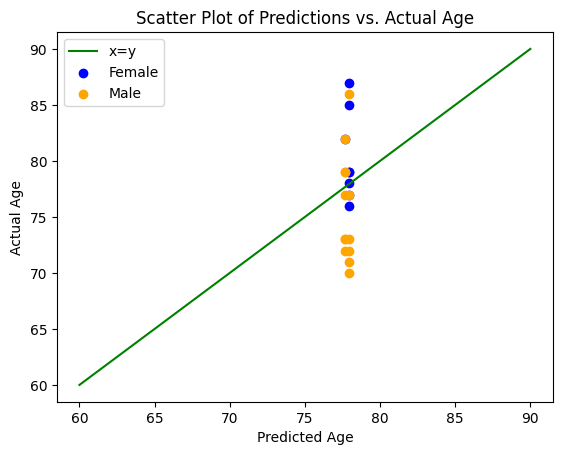

In [ ]:
color = {1:'orange',-1:'blue'}
label = {1:'Male',-1:'Female'}
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.plot([60,90], [60,90], c='green', label='x=y')

for g in [-1,1]:
    i = np.where(bae_3d_sexes_test == g)
    plt.scatter(predictions[i], bae_3d_ages_test[i], c=color[g], label = label[g])

# Add labels and title
plt.xlabel('Predicted Age')
plt.ylabel('Actual Age')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

In [ ]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

def evaluate_predictions(predictions, true_values):
    # Calculate R^2
    r2 = r2_score(true_values, predictions)

    # Calculate MSE
    mse = mean_squared_error(true_values, predictions)

    # Calculate RMSE
    rmse = np.sqrt(mse)

    # Calculate MAE
    mae = mean_absolute_error(true_values, predictions)

    return r2, rmse, mse, mae

# Sample data


r2, rmse, mse, mae = evaluate_predictions(predictions, bae_3d_ages_test)
print(f"R^2: {r2}")
print(f"RMSE: {rmse}")
print(f"MSE: {mse}")
print(f"MAE: {mae}")


R^2: -0.498937505624812
RMSE: 5.92145093683439
MSE: 35.06358119733687
MAE: 4.788323175339472


### Version 4 bo v2

In [454]:
from classification_models_3D.tfkeras import Classifiers

vgg16, preprocess_input = Classifiers.get('vgg16')
pretrained_model = vgg16(input_shape=(79, 95, 68, 3), weights='imagenet')

In [455]:
import keras.backend as K
from tensorflow.keras.initializers import GlorotUniform
from keras.optimizers import Adam

def create_model(num_ft_layers, neurons1, neurons2):

  # Define the input layer for the 3D Convolutional network
  model = Sequential()

  for layer in pretrained_model.layers:
      model.add(layer)

  # Freeze the weights of the pre-trained layers so they are not updated during training
  for layer in model.layers:
      layer.trainable = False


  # Flatten the output of the pre-trained model
  x = Flatten()(model.output)

  # Add Dense layers after concatenation
  x = Dense(neurons1, activation='relu')(x)

  x = Dense(neurons2, activation='relu')(x)

  additional_input = Input(shape=(1,))
  concatenated = concatenate([x, additional_input])
  # Concatenate the flattened output with the new input

  output = Dense(1, activation='linear')(concatenated)  # Use 'linear' activation for regression tasks

  # Create the final model
  model = Model(inputs=[pretrained_model.input, additional_input], outputs=output)

  for layer in model.layers[19 - num_ft_layers:]:
            layer.trainable = True

  session = K.get_session()
  for layer in model.layers[19 - num_ft_layers:19]:
      if layer.get_weights():
        weights_shape = layer.get_weights()[0].shape
        bias_shape = layer.get_weights()[1].shape

        # Re-initialize weights and biases
        new_weights = GlorotUniform()(weights_shape).numpy()
        new_biases = GlorotUniform()(bias_shape).numpy()

        layer.set_weights([new_weights, new_biases])

  METRICS = [keras.metrics.MeanAbsoluteError(name='mae')]


  # Compile the model
  model.compile(loss='mean_squared_error', optimizer='adam', metrics=METRICS)

  return(model)

In [33]:
dup_bae_3d_im_train = np.repeat(bae_3d_im_train, 3, axis=-1)
dup_bae_3d_im_test = np.repeat(bae_3d_im_test, 3, axis=-1)

In [ ]:
from keras.backend import dropout
import time
import optuna
from optuna.samplers import TPESampler
from sklearn.model_selection import cross_val_score
from keras.optimizers import Adam
import traceback

def objective(trial, X = dup_bae_3d_im_train, y = bae_3d_ages_train, z = bae_3d_sexes_train,K = 3):
    global the_best_score
    """return the mse"""
    num_ft_layers = trial.suggest_int('num_layers', low = 0, high = 12, step = 2)
    neurons1 = trial.suggest_int('neurons1', low = 2, high = 256, step = 16)
    neurons2 = trial.suggest_int('neurons2', low = 2, high = 256, step = 16)
    batch_size = trial.suggest_int('batch_size', low = 8, high = 16, step = 1)


    callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, start_from_epoch=10, baseline = 50)
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, verbose=1)

    # random forest classifier object
    scores = []
    best_scores = []
    for train, test in StratifiedKFold(n_splits=K, shuffle=True).split(X,z):
        model = create_model(num_ft_layers = num_ft_layers, neurons1 = neurons1, neurons2 = neurons2)
        try:
          history = model.fit([X[train], z[train]], y[train],
                                    validation_data = ([X[test], z[test]],y[test]), epochs=100, batch_size=batch_size, callbacks= [callback, reduce_lr]).history
          scores.append(model.evaluate([X[test], z[test]], y[test], verbose = 0))# evaluate the test dataset
          best_scores.append(min(history['val_loss']))
        except:
          traceback.print_exc()
          return(2000)
    the_best_score.append(np.mean(best_scores))
    return(np.mean(best_scores))


the_best_score = []
# create a study (aim to maximize score)
study = optuna.create_study(sampler=TPESampler(), direction='minimize')

# perform hyperparamter tuning (while timing the process)
time_start = time.time()
study.optimize(objective, n_trials=3, gc_after_trial=True)
time_bayesian = time.time() - time_start

columns = ['Number of iterations', 'Iteration Number of Optimal Hyperparamters', 'Score', 'Time Elapsed (s)']

# store result in a data frame
values_bayesian = [100, study.best_trial.number, study.best_trial.value, time_bayesian]
results_bayesian = pd.DataFrame([values_bayesian], columns = columns)


[I 2023-08-28 09:50:46,408] A new study created in memory with name: no-name-2622d153-e162-41a0-a7c1-77c73a891ca0
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 256] and step=16, but the range is not divisible by `step`. It will be replaced by [2, 242].
  warnings.warn(


Epoch 1/100
7/7 [==============================] - 27s 3s/step - loss: 1754.0692 - mae: 33.6134 - val_loss: 715.5513 - val_mae: 26.0954
Epoch 2/100
7/7 [==============================] - 8s 1s/step - loss: 311.5875 - mae: 15.4870 - val_loss: 116.7186 - val_mae: 9.1605
Epoch 3/100
7/7 [==============================] - 8s 1s/step - loss: 115.9233 - mae: 9.4373 - val_loss: 39.8988 - val_mae: 5.0280
Epoch 4/100
7/7 [==============================] - 8s 1s/step - loss: 68.6298 - mae: 6.5506 - val_loss: 85.5129 - val_mae: 7.9847
Epoch 5/100
7/7 [==============================] - 8s 1s/step - loss: 48.7176 - mae: 5.7673 - val_loss: 49.3340 - val_mae: 5.6304
Epoch 6/100
7/7 [==============================] - 8s 1s/step - loss: 37.0988 - mae: 4.8289 - val_loss: 41.8546 - val_mae: 5.2492
Epoch 7/100
7/7 [==============================] - 8s 1s/step - loss: 23.1873 - mae: 3.5314 - val_loss: 36.9672 - val_mae: 4.9242
Epoch 8/100
7/7 [==============================] - 8s 1s/step - loss: 19.2287 - 

[I 2023-08-28 10:15:14,786] Trial 0 finished with value: 19.6632506052653 and parameters: {'num_layers': 2, 'neurons1': 114, 'neurons2': 146, 'batch_size': 8}. Best is trial 0 with value: 19.6632506052653.
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 256] and step=16, but the range is not divisible by `step`. It will be replaced by [2, 242].
  warnings.warn(


Epoch 1/100
5/5 [==============================] - 27s 2s/step - loss: 4263516160.0000 - mae: 30836.6387 - val_loss: 1311.7587 - val_mae: 35.9119
Epoch 2/100
5/5 [==============================] - 9s 2s/step - loss: 4149.0581 - mae: 62.4738 - val_loss: 531.8912 - val_mae: 22.6582
Epoch 3/100
5/5 [==============================] - 9s 2s/step - loss: 7714.0498 - mae: 60.1479 - val_loss: 10915.3008 - val_mae: 104.3268
Epoch 4/100
5/5 [==============================] - 9s 2s/step - loss: 5531.9873 - mae: 71.1035 - val_loss: 5577.7930 - val_mae: 74.5690
Epoch 5/100
5/5 [==============================] - 9s 2s/step - loss: 4728.2837 - mae: 68.2533 - val_loss: 367.9487 - val_mae: 18.6900
Epoch 6/100
5/5 [==============================] - 9s 2s/step - loss: 1278.8773 - mae: 29.0391 - val_loss: 1467.0239 - val_mae: 38.0696
Epoch 7/100
5/5 [==============================] - 9s 2s/step - loss: 768.7859 - mae: 24.3800 - val_loss: 627.7223 - val_mae: 24.5853
Epoch 8/100
5/5 [=======================

[I 2023-08-28 10:31:42,854] Trial 1 finished with value: 19.45284144083659 and parameters: {'num_layers': 10, 'neurons1': 18, 'neurons2': 18, 'batch_size': 12}. Best is trial 1 with value: 19.45284144083659.
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 256] and step=16, but the range is not divisible by `step`. It will be replaced by [2, 242].
  warnings.warn(


Epoch 1/100
7/7 [==============================] - 13s 1s/step - loss: 11055.0244 - mae: 83.2428 - val_loss: 41.9190 - val_mae: 5.4892
Epoch 2/100
7/7 [==============================] - 9s 1s/step - loss: 4416.2646 - mae: 61.6645 - val_loss: 5781.5864 - val_mae: 75.9081
Epoch 3/100
7/7 [==============================] - 9s 1s/step - loss: 5616.4106 - mae: 74.7809 - val_loss: 5211.4199 - val_mae: 72.0547
Epoch 4/100
7/7 [==============================] - 9s 1s/step - loss: 2471.4502 - mae: 44.4316 - val_loss: 659.0879 - val_mae: 25.2892
Epoch 5/100
7/7 [==============================] - 9s 1s/step - loss: 488.5835 - mae: 20.0040 - val_loss: 406.3326 - val_mae: 19.6669
Epoch 6/100
7/7 [==============================] - 9s 1s/step - loss: 167.4536 - mae: 11.2032 - val_loss: 49.2113 - val_mae: 6.0689
Epoch 7/100
7/7 [==============================] - 9s 1s/step - loss: 63.4501 - mae: 6.8333 - val_loss: 69.0358 - val_mae: 7.4877
Epoch 8/100
7/7 [==============================] - 9s 1s/step 

[I 2023-08-28 10:54:12,396] Trial 2 finished with value: 22.325473149617512 and parameters: {'num_layers': 8, 'neurons1': 98, 'neurons2': 242, 'batch_size': 8}. Best is trial 1 with value: 19.45284144083659.


In [ ]:
values = [study.trials[i].values[0] for i in range(len(study.trials))]
params = [study.trials[i].params for i in range(len(study.trials))]
columns = list(params[0].keys()) + ['val']
bayesian_results = pd.DataFrame(columns = columns)
bayesian_results['val'] = values
for param in list(params[0].keys()):
  param_list = [study[param] for study in params]
  bayesian_results[param] = param_list

In [ ]:
bayesian_results.sort_values(by=['val'])

,num_layers,neurons1,neurons2,batch_size,val
1,10,18,18,12,19.452841
0,2,114,146,8,19.663251
2,8,98,242,8,22.325473


In [ ]:
optuna.visualization.plot_param_importances(study)

In [35]:
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, start_from_epoch=10, baseline = 50)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, verbose=1)
model = create_model(8, 18, 18)
history = model.fit([dup_bae_3d_im_train, bae_3d_sexes_train], bae_3d_ages_train, validation_data= ([dup_bae_3d_im_test, bae_3d_sexes_test], bae_3d_ages_test), epochs = 100, batch_size = 12, callbacks = [callback, reduce_lr]).history

Epoch 1/100
7/7 [==============================] - 15s 2s/step - loss: 19563706.0000 - mae: 1750.1960 - val_loss: 720.1085 - val_mae: 26.4006 - lr: 0.0010
Epoch 2/100
7/7 [==============================] - 11s 2s/step - loss: 1313.5348 - mae: 31.1600 - val_loss: 1350.7162 - val_mae: 36.4403 - lr: 0.0010
Epoch 3/100
7/7 [==============================] - 11s 2s/step - loss: 606.2047 - mae: 22.3342 - val_loss: 559.7786 - val_mae: 23.1574 - lr: 0.0010
Epoch 4/100
7/7 [==============================] - 11s 2s/step - loss: 270.6750 - mae: 14.3292 - val_loss: 101.1839 - val_mae: 8.7550 - lr: 0.0010
Epoch 5/100
7/7 [==============================] - 11s 2s/step - loss: 119.2897 - mae: 9.4762 - val_loss: 26.4205 - val_mae: 3.9371 - lr: 0.0010
Epoch 6/100
7/7 [==============================] - 11s 2s/step - loss: 66.4189 - mae: 6.8653 - val_loss: 50.2017 - val_mae: 6.1380 - lr: 0.0010
Epoch 7/100
7/7 [==============================] - 11s 2s/step - loss: 71.9051 - mae: 7.1308 - val_loss: 35.396

In [1]:
# Access the loss values from the training history
train_loss = history['loss']
val_loss = history['val_loss']

# Access the number of epochs
epochs = range(1, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

NameError: ignored

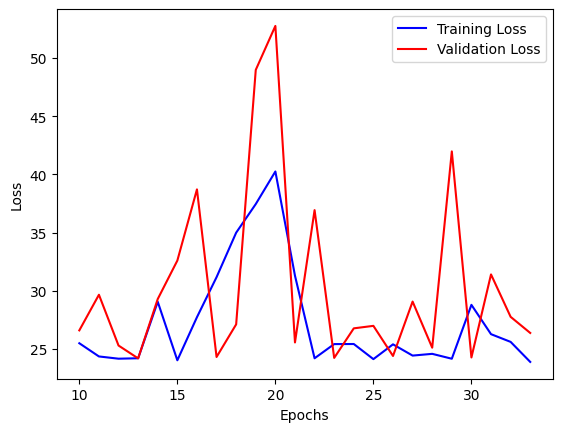

In [92]:
epochs = range(10, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss[9:], 'b', label='Training Loss')
plt.plot(epochs, val_loss[9:], 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [36]:
predictions = model.predict([dup_bae_3d_im_test, bae_3d_sexes_test])

1/1 [==============================] - 20s 20s/step


In [110]:
predictions = predictions.reshape(-1)

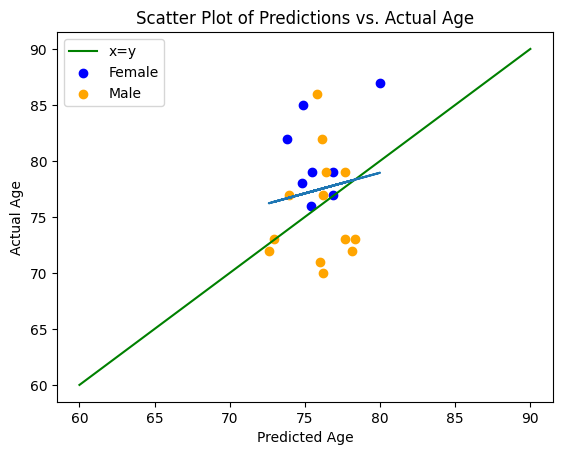

In [134]:
color = {1:'orange',-1:'blue'}
label = {1:'Male',-1:'Female'}
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.plot([60,90], [60,90], c='green', label='x=y')

for g in [-1,1]:
    i = np.where(bae_3d_sexes_test == g)
    plt.scatter(predictions[i], bae_3d_ages_test[i], c=color[g], label = label[g])

a, b = np.polyfit(predictions, bae_3d_ages_test, 1)


#add line of best fit to plot
plt.plot(predictions, a*predictions+b)


# Add labels and title
plt.xlabel('Predicted Age')
plt.ylabel('Actual Age')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

In [95]:
adjusted_ages = lr_model.predict(predictions)

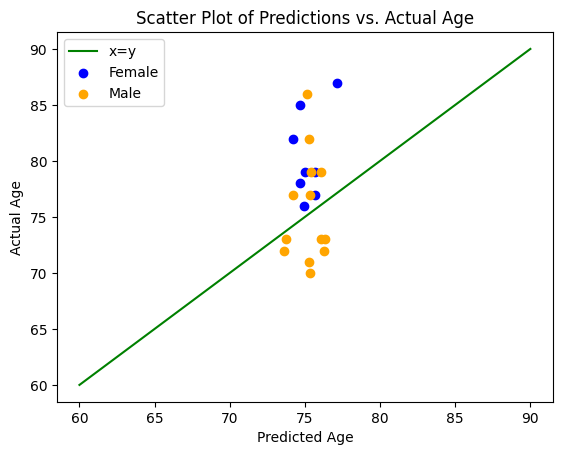

In [96]:
color = {1:'orange',-1:'blue'}
label = {1:'Male',-1:'Female'}
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.plot([60,90], [60,90], c='green', label='x=y')

for g in [-1,1]:
    i = np.where(bae_3d_sexes_test == g)
    plt.scatter(np.array(adjusted_ages)[i], bae_3d_ages_test[i], c=color[g], label = label[g])

# Add labels and title
plt.xlabel('Predicted Age')
plt.ylabel('Actual Age')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

In [118]:
age_gap = [predictions[i] - bae_3d_ages_test[i] for i in range(len(predictions))]
age_gap = np.array([i for i in age_gap])

In [98]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from scipy.stats import pearsonr

def evaluate_predictions(predictions, true_values):
    # Calculate R^2
    r2 = r2_score(true_values, predictions)

    # Calculate MSE
    mse = mean_squared_error(true_values, predictions)

    # Calculate RMSE
    rmse = np.sqrt(mse)

    # Calculate MAE
    mae = mean_absolute_error(true_values, predictions)

    # Calculate Pearson's correlation coefficient
    r, _ = pearsonr(true_values, predictions)



    return r2, rmse, mse, mae, r

# Sample data
# (You'll need to define 'predictions' and 'bae_3d_ages_test' before calling the function)

r2, rmse, mse, mae, pearson_r = evaluate_predictions([float(i) for i in adjusted_ages], bae_3d_ages_test)
print(f"R^2: {r2}")
print(f"RMSE: {rmse}")
print(f"MSE: {mse}")
print(f"MAE: {mae}")
print(f"Pearson's r: {pearson_r}")



R^2: -0.19766468697255357
RMSE: 5.293025597818173
MSE: 28.01611997915842
MAE: 4.387378874279204
Pearson's r: 0.13586796882145302


In [37]:
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, start_from_epoch=10, baseline = 50)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, verbose=1)
all_predictions = []
all_true_ages = []
for train, test in StratifiedKFold(n_splits=5, shuffle=True).split(dup_bae_3d_im_train,bae_3d_sexes_train):
  model = create_model(10, 18, 18)
  model.fit([dup_bae_3d_im_train[train], bae_3d_sexes_train[train]], bae_3d_ages_train[train],
            validation_data= ([dup_bae_3d_im_train[test], bae_3d_sexes_train[test]], bae_3d_ages_train[test]),
            epochs = 10, batch_size = 12, callbacks = [callback, reduce_lr])
  preds = model.predict([dup_bae_3d_im_train[test], bae_3d_sexes_train[test]])
  all_predictions = all_predictions + [i[0] for i in preds]
  all_true_ages = all_true_ages + [i for i in bae_3d_ages_train[test]]


Epoch 1/10
6/6 [==============================] - 21s 3s/step - loss: 2063558784.0000 - mae: 19730.8184 - val_loss: 5891.4146 - val_mae: 76.5796 - lr: 0.0010
Epoch 2/10
6/6 [==============================] - 9s 1s/step - loss: 5621.5977 - mae: 74.8258 - val_loss: 1712.1655 - val_mae: 41.0819 - lr: 0.0010
Epoch 3/10
6/6 [==============================] - 9s 1s/step - loss: 7810.0854 - mae: 66.9376 - val_loss: 1613.8424 - val_mae: 39.8936 - lr: 0.0010
Epoch 4/10
6/6 [==============================] - 9s 1s/step - loss: 686.8547 - mae: 23.4695 - val_loss: 399.2065 - val_mae: 19.4958 - lr: 0.0010
Epoch 5/10
6/6 [==============================] - 9s 1s/step - loss: 166.5417 - mae: 10.8209 - val_loss: 97.0621 - val_mae: 8.8776 - lr: 0.0010
Epoch 6/10
6/6 [==============================] - 9s 1s/step - loss: 69.5491 - mae: 7.1331 - val_loss: 21.1897 - val_mae: 3.7665 - lr: 0.0010
Epoch 7/10
6/6 [==============================] - 9s 2s/step - loss: 45.0315 - mae: 5.1637 - val_loss: 18.8692 - v

1/1 [==============================] - 15s 15s/step
Epoch 1/10
6/6 [==============================] - 13s 2s/step - loss: 82979733504.0000 - mae: 123797.7500 - val_loss: 1428.7520 - val_mae: 37.4207 - lr: 0.0010
Epoch 2/10
6/6 [==============================] - 9s 2s/step - loss: 1739.3462 - mae: 36.8419 - val_loss: 1051.3854 - val_mae: 31.9919 - lr: 0.0010
Epoch 3/10
6/6 [==============================] - 9s 2s/step - loss: 910.4030 - mae: 28.1602 - val_loss: 43.7657 - val_mae: 5.0307 - lr: 0.0010
Epoch 4/10
6/6 [==============================] - 9s 2s/step - loss: 155.0485 - mae: 10.3887 - val_loss: 97.7104 - val_mae: 8.7628 - lr: 0.0010
Epoch 5/10
6/6 [==============================] - 9s 2s/step - loss: 77.3529 - mae: 7.5629 - val_loss: 89.5918 - val_mae: 8.3279 - lr: 0.0010
Epoch 6/10
6/6 [==============================] - 9s 2s/step - loss: 104.4124 - mae: 8.8844 - val_loss: 93.2489 - val_mae: 8.5259 - lr: 0.0010
Epoch 7/10
6/6 [==============================] - 9s 2s/step - loss

1/1 [==============================] - 0s 274ms/step
Epoch 1/10
6/6 [==============================] - 13s 2s/step - loss: 278085504.0000 - mae: 7226.2417 - val_loss: 4116.7012 - val_mae: 64.0263 - lr: 0.0010
Epoch 2/10
6/6 [==============================] - 9s 2s/step - loss: 15238.0635 - mae: 90.8738 - val_loss: 2046.8129 - val_mae: 45.0542 - lr: 0.0010
Epoch 3/10
6/6 [==============================] - 9s 2s/step - loss: 1189.7509 - mae: 32.9389 - val_loss: 397.7418 - val_mae: 19.5284 - lr: 0.0010
Epoch 4/10
6/6 [==============================] - 9s 2s/step - loss: 412.3142 - mae: 19.0135 - val_loss: 438.1453 - val_mae: 20.5378 - lr: 0.0010
Epoch 5/10
6/6 [==============================] - 9s 2s/step - loss: 162.7357 - mae: 11.0461 - val_loss: 90.6963 - val_mae: 8.6587 - lr: 0.0010
Epoch 6/10
6/6 [==============================] - 9s 2s/step - loss: 57.1244 - mae: 6.2618 - val_loss: 69.9295 - val_mae: 7.3802 - lr: 0.0010
Epoch 7/10
6/6 [==============================] - 9s 2s/step - 

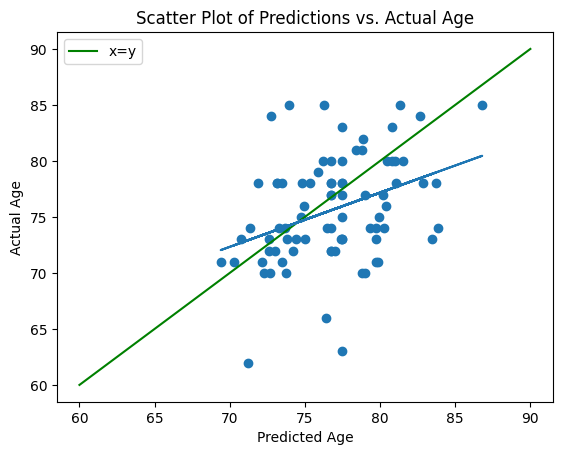

In [112]:
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.plot([60,90], [60,90], c='green', label='x=y')


plt.scatter(all_predictions, all_true_ages)

#find line of best fit
a, b = np.polyfit(all_predictions, all_true_ages, 1)


#add line of best fit to plot
plt.plot(all_predictions, (a*np.array(all_predictions))+b)

# Add labels and title
plt.xlabel('Predicted Age')
plt.ylabel('Actual Age')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

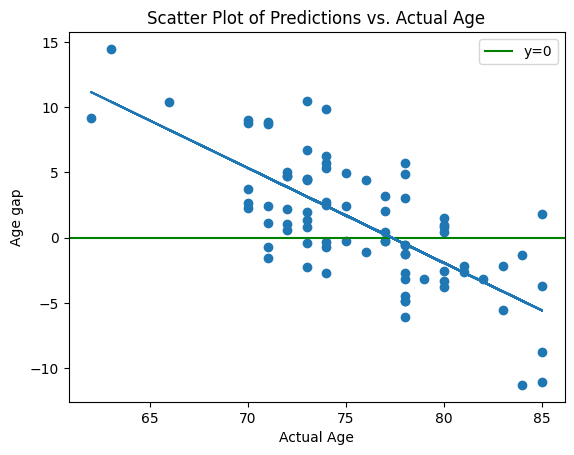

In [116]:
all_age_gaps = [i - j for i,j in zip(all_predictions, all_true_ages)]


plt.axhline(y= 0, c='green', label='y=0')


plt.scatter(all_true_ages, all_age_gaps)

#find line of best fit
a, b = np.polyfit(all_true_ages, all_age_gaps, 1)

#add line of best fit to plot
plt.plot(all_true_ages, (a*np.array(all_true_ages))+b)

# Add labels and title
plt.xlabel('Actual Age')
plt.ylabel('Age gap')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

In [117]:
r, _ = pearsonr(all_true_ages, all_age_gaps)
print(r)

-0.7208247757073991


In [125]:
from sklearn.linear_model import LinearRegression
import numpy as np

# Sample data
x = all_true_ages
y = all_predictions

# Reshape the data
x_reshaped = np.array(x).reshape(-1, 1)
y_reshaped = np.array(y)

# Fit the linear regression model
lr_model = LinearRegression().fit(x_reshaped, y_reshaped)

# Get the coefficients
a = lr_model.coef_[0]
b = lr_model.intercept_

print(f"a (slope) = {a}")
print(f"b (intercept) = {b}")

a (slope) = 0.27272814355506747
b (intercept) = 56.23879464552127


y = 0.27272814355506747x + 56.23879464552127
y is chronological age
x is predictions

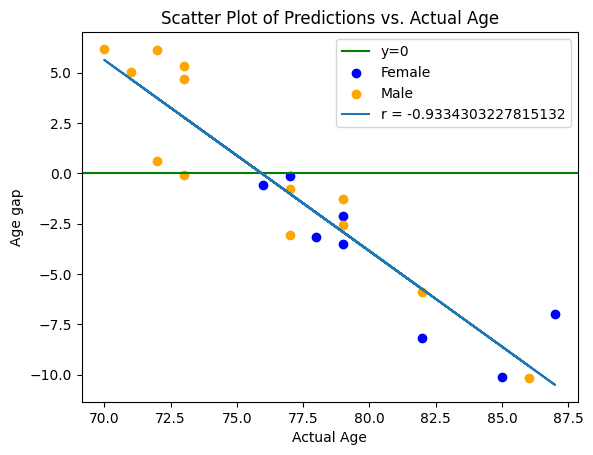

In [120]:
color = {1:'orange',-1:'blue'}
label = {1:'Male',-1:'Female'}
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.axhline(y= 0, c='green', label='y=0')

for g in [-1,1]:
    i = np.where(bae_3d_sexes_test == g)
    plt.scatter(bae_3d_ages_test[i], age_gap[i], c=color[g], label = label[g])

#find line of best fit
a, b = np.polyfit(bae_3d_ages_test, age_gap, 1)
#add line of best fit to plot
r, _ = pearsonr(bae_3d_ages_test, age_gap)


plt.plot(bae_3d_ages_test, (a*bae_3d_ages_test)+b, label = f'r = {r}')

# Add labels and title
plt.xlabel('Actual Age')
plt.ylabel('Age gap')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

In [129]:
adjusted_age_gaps = np.array([(y-b)/(a-x) for x,y in zip(bae_3d_ages_test, predictions)])

In [130]:
adjusted_age_gaps

array([-0.29488771, -0.2620005 , -0.22836224, -0.22808127, -0.27979715,
       -0.2293848 , -0.25320797, -0.28598358, -0.21506497, -0.26876825,
       -0.23904309, -0.27393931, -0.22014602, -0.2725917 , -0.24443959,
       -0.24327871, -0.2604667 , -0.3036257 , -0.25624633, -0.23063593,
       -0.30512832])

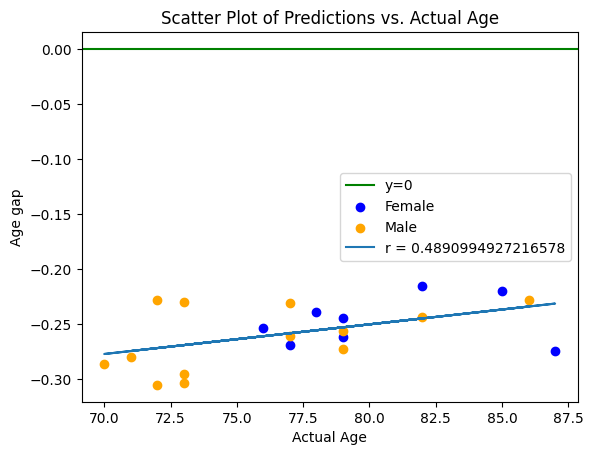

In [133]:
color = {1:'orange',-1:'blue'}
label = {1:'Male',-1:'Female'}
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.axhline(y= 0, c='green', label='y=0')

for g in [-1,1]:
    i = np.where(bae_3d_sexes_test == g)
    plt.scatter(bae_3d_ages_test[i], adjusted_age_gaps[i], c=color[g], label = label[g])

#find line of best fit
a, b = np.polyfit(bae_3d_ages_test, adjusted_age_gaps, 1)
#add line of best fit to plot
r, _ = pearsonr(bae_3d_ages_test, adjusted_age_gaps)


plt.plot(bae_3d_ages_test, (a*bae_3d_ages_test)+b, label = f'r = {r}')

# Add labels and title
plt.xlabel('Actual Age')
plt.ylabel('Age gap')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

In [121]:
from sklearn.linear_model import LinearRegression
import numpy as np

# Sample data
x = bae_3d_ages_test,
y = age_gap

# Reshape the data
x_reshaped = np.array(x).reshape(-1, 1)
y_reshaped = np.array(y)

# Fit the linear regression model
lr_model = LinearRegression().fit(x_reshaped, y_reshaped)

# Get the coefficients
a = lr_model.coef_[0]
b = lr_model.intercept_

print(f"a (slope) = {a}")
print(f"b (intercept) = {b}")

a (slope) = -0.9499301947378846
b (intercept) = 72.13078545655057


In [124]:
lr_model.predict([[87]])

array([-10.51314149])

In [97]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from scipy.stats import pearsonr

def evaluate_predictions(predictions, true_values):
    # Calculate R^2
    r2 = r2_score(true_values, predictions)

    # Calculate MSE
    mse = mean_squared_error(true_values, predictions)

    # Calculate RMSE
    rmse = np.sqrt(mse)

    # Calculate MAE
    mae = mean_absolute_error(true_values, predictions)

    # Calculate Pearson's correlation coefficient
    r, _ = pearsonr(true_values, predictions)



    return r2, rmse, mse, mae, r

# Sample data
# (You'll need to define 'predictions' and 'bae_3d_ages_test' before calling the function)

r2, rmse, mse, mae, pearson_r = evaluate_predictions([float(i) for i in predictions], bae_3d_ages_test)
print(f"R^2: {r2}")
print(f"RMSE: {rmse}")
print(f"MSE: {mse}")
print(f"MAE: {mae}")
print(f"Pearson's r: {pearson_r}")



R^2: -0.12756367227576138
RMSE: 5.135785888896779
MSE: 26.37629669659128
MAE: 4.126837594168527
Pearson's r: 0.13586812902051332


### Version 5 BO

In [ ]:
from classification_models_3D.tfkeras import Classifiers

vgg19, preprocess_input = Classifiers.get('vgg19')
pretrained_model = vgg19(input_shape=(79, 95, 68, 3), weights='imagenet')

240321880/240321880 [==============================] - 5s 0us/step


In [ ]:
import keras.backend as K
from tensorflow.keras.initializers import GlorotUniform
from keras.optimizers import Adam

def create_model(num_ft_layers, neurons1, neurons2):

  # Define the input layer for the 3D Convolutional network
  model = Sequential()

  for layer in pretrained_model.layers:
      model.add(layer)

  # Freeze the weights of the pre-trained layers so they are not updated during training
  for layer in model.layers:
      layer.trainable = False


  # Flatten the output of the pre-trained model
  x = Flatten()(model.output)

  # Add Dense layers after concatenation
  x = Dense(neurons1, activation='relu')(x)

  x = Dense(neurons2, activation='relu')(x)

  additional_input = Input(shape=(1,))
  concatenated = concatenate([x, additional_input])
  # Concatenate the flattened output with the new input

  output = Dense(1, activation='linear')(concatenated)  # Use 'linear' activation for regression tasks

  # Create the final model
  model = Model(inputs=[pretrained_model.input, additional_input], outputs=output)

  for layer in model.layers[22 - num_ft_layers:]:
            layer.trainable = True

  session = K.get_session()
  for layer in model.layers[22 - num_ft_layers:22]:
      if layer.get_weights():
        weights_shape = layer.get_weights()[0].shape
        bias_shape = layer.get_weights()[1].shape

        # Re-initialize weights and biases
        new_weights = GlorotUniform()(weights_shape).numpy()
        new_biases = GlorotUniform()(bias_shape).numpy()

        layer.set_weights([new_weights, new_biases])

  METRICS = [keras.metrics.MeanAbsoluteError(name='mae')]


  # Compile the model
  model.compile(loss='mean_squared_error', optimizer='adam', metrics=METRICS)

  return(model)

In [ ]:
dup_bae_3d_im_train = np.repeat(bae_3d_im_train, 3, axis=-1)
dup_bae_3d_im_test = np.repeat(bae_3d_im_test, 3, axis=-1)

In [ ]:
from keras.backend import dropout
import time
import optuna
from optuna.samplers import TPESampler
from sklearn.model_selection import cross_val_score
from keras.optimizers import Adam
import traceback

def objective(trial, X = dup_bae_3d_im_train, y = bae_3d_ages_train, z = bae_3d_sexes_train,K = 3):
    global the_best_score
    """return the mse"""
    num_ft_layers = trial.suggest_int('num_layers', low = 0, high = 12, step = 2)
    neurons1 = trial.suggest_int('neurons1', low = 2, high = 256, step = 16)
    neurons2 = trial.suggest_int('neurons2', low = 2, high = 256, step = 16)
    batch_size = trial.suggest_int('batch_size', low = 8, high = 16, step = 1)


    callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, start_from_epoch=10, baseline = 50)
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, verbose=1)

    # random forest classifier object
    scores = []
    best_scores = []
    for train, test in StratifiedKFold(n_splits=K, shuffle=True).split(X,z):
        model = create_model(num_ft_layers = num_ft_layers, neurons1 = neurons1, neurons2 = neurons2)
        try:
          history = model.fit([X[train], z[train]], y[train],
                                    validation_data = ([X[test], z[test]],y[test]), epochs=100, batch_size=batch_size, callbacks= [callback, reduce_lr]).history
          scores.append(model.evaluate([X[test], z[test]], y[test], verbose = 0))# evaluate the test dataset
          best_scores.append(min(history['val_loss']))
        except:
          traceback.print_exc()
          return(2000)
    the_best_score.append(np.mean(best_scores))
    return(np.mean(best_scores))


the_best_score = []
# create a study (aim to maximize score)
study = optuna.create_study(sampler=TPESampler(), direction='minimize')

# perform hyperparamter tuning (while timing the process)
time_start = time.time()
study.optimize(objective, n_trials=3, gc_after_trial=True)
time_bayesian = time.time() - time_start

columns = ['Number of iterations', 'Iteration Number of Optimal Hyperparamters', 'Score', 'Time Elapsed (s)']

# store result in a data frame
values_bayesian = [100, study.best_trial.number, study.best_trial.value, time_bayesian]
results_bayesian = pd.DataFrame([values_bayesian], columns = columns)


[I 2023-08-28 13:27:28,393] A new study created in memory with name: no-name-65fe62bc-58c3-473c-b58a-2229119054d4


Epoch 1/100
6/6 [==============================] - 35s 2s/step - loss: 77562298368.0000 - mae: 113757.5938 - val_loss: 3218.1606 - val_mae: 56.4884 - lr: 0.0010
Epoch 2/100
6/6 [==============================] - 11s 2s/step - loss: 15563.9121 - mae: 100.6370 - val_loss: 5919.9351 - val_mae: 76.7563 - lr: 0.0010
Epoch 3/100
6/6 [==============================] - 12s 2s/step - loss: 5715.3159 - mae: 75.4723 - val_loss: 5881.2847 - val_mae: 76.5042 - lr: 0.0010
Epoch 4/100
6/6 [==============================] - 12s 2s/step - loss: 5680.3335 - mae: 75.2410 - val_loss: 5745.7788 - val_mae: 75.6138 - lr: 0.0010
Epoch 5/100
6/6 [==============================] - 11s 2s/step - loss: 6328.4131 - mae: 69.2432 - val_loss: 5168.9883 - val_mae: 71.7005 - lr: 0.0010
Epoch 6/100
6/6 [==============================] - 11s 2s/step - loss: 4182.8555 - mae: 62.4025 - val_loss: 2024.8357 - val_mae: 44.7018 - lr: 0.0010
Epoch 7/100
6/6 [==============================] - 11s 2s/step - loss: 2623.0339 - mae:

[I 2023-08-28 13:57:38,208] Trial 0 finished with value: 21.182727813720703 and parameters: {'num_layers': 12, 'neurons1': 82, 'neurons2': 226, 'batch_size': 9}. Best is trial 0 with value: 21.182727813720703.
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 256] and step=16, but the range is not divisible by `step`. It will be replaced by [2, 242].
  warnings.warn(


Epoch 1/100
7/7 [==============================] - 33s 3s/step - loss: 28276965376.0000 - mae: 64990.6406 - val_loss: 372.4016 - val_mae: 18.6817 - lr: 0.0010
Epoch 2/100
7/7 [==============================] - 11s 2s/step - loss: 1731.1549 - mae: 36.5871 - val_loss: 22.7348 - val_mae: 3.6686 - lr: 0.0010
Epoch 3/100
7/7 [==============================] - 11s 2s/step - loss: 85.8989 - mae: 8.0860 - val_loss: 34.2767 - val_mae: 4.9045 - lr: 0.0010
Epoch 4/100
7/7 [==============================] - 11s 2s/step - loss: 498.2188 - mae: 19.1818 - val_loss: 230.2794 - val_mae: 14.4184 - lr: 0.0010
Epoch 5/100
7/7 [==============================] - 11s 2s/step - loss: 237.2867 - mae: 13.6303 - val_loss: 258.5427 - val_mae: 15.4325 - lr: 0.0010
Epoch 6/100
7/7 [==============================] - 11s 2s/step - loss: 105.7182 - mae: 9.0802 - val_loss: 27.4803 - val_mae: 4.0438 - lr: 0.0010
Epoch 7/100
7/7 [==============================] - 11s 2s/step - loss: 73.7751 - mae: 7.2657 - val_loss: 138.

[I 2023-08-28 14:26:46,659] Trial 1 finished with value: 21.424903869628906 and parameters: {'num_layers': 10, 'neurons1': 114, 'neurons2': 178, 'batch_size': 8}. Best is trial 0 with value: 21.182727813720703.
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 256] and step=16, but the range is not divisible by `step`. It will be replaced by [2, 242].
  warnings.warn(


Epoch 1/100
5/5 [==============================] - 23s 2s/step - loss: 678080512.0000 - mae: 12349.5430 - val_loss: 128.5692 - val_mae: 10.6504 - lr: 0.0010
Epoch 2/100
5/5 [==============================] - 9s 2s/step - loss: 7602.9150 - mae: 66.3870 - val_loss: 7556.9712 - val_mae: 86.7686 - lr: 0.0010
Epoch 3/100
5/5 [==============================] - 9s 2s/step - loss: 3620.0156 - mae: 52.5380 - val_loss: 34.1116 - val_mae: 4.4563 - lr: 0.0010
Epoch 4/100
5/5 [==============================] - 9s 2s/step - loss: 846.1890 - mae: 24.5676 - val_loss: 73.2792 - val_mae: 7.7497 - lr: 0.0010
Epoch 5/100
5/5 [==============================] - 9s 2s/step - loss: 291.1375 - mae: 15.2828 - val_loss: 52.0384 - val_mae: 6.2456 - lr: 0.0010
Epoch 6/100
5/5 [==============================] - 9s 2s/step - loss: 142.1765 - mae: 9.8495 - val_loss: 123.6504 - val_mae: 10.4411 - lr: 0.0010
Epoch 7/100
5/5 [==============================] - 9s 2s/step - loss: 94.5987 - mae: 8.0669 - val_loss: 22.2550 

[I 2023-08-28 15:05:48,171] Trial 2 finished with value: 22.30445607503255 and parameters: {'num_layers': 6, 'neurons1': 114, 'neurons2': 66, 'batch_size': 12}. Best is trial 0 with value: 21.182727813720703.


In [ ]:
values = [study.trials[i].values[0] for i in range(len(study.trials))]
params = [study.trials[i].params for i in range(len(study.trials))]
columns = list(params[0].keys()) + ['val']
bayesian_results = pd.DataFrame(columns = columns)
bayesian_results['val'] = values
for param in list(params[0].keys()):
  param_list = [study[param] for study in params]
  bayesian_results[param] = param_list

In [ ]:
bayesian_results.sort_values(by=['val'])

,num_layers,neurons1,neurons2,batch_size,val
0,12,82,226,9,21.182728
1,10,114,178,8,21.424904
2,6,114,66,12,22.304456


In [ ]:
optuna.visualization.plot_param_importances(study)

In [ ]:
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, start_from_epoch=10, baseline = 50)
from keras.callbacks import ReduceLROnPlateau
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, verbose=1)
model = create_model(12, 82, 226)
history = model.fit([dup_bae_3d_im_train, bae_3d_sexes_train], bae_3d_ages_train, validation_data= ([dup_bae_3d_im_test, bae_3d_sexes_test], bae_3d_ages_test), epochs = 100, batch_size = 9, callbacks = [callback, reduce_lr]).history

Epoch 1/100
9/9 [==============================] - 18s 2s/step - loss: 1086371328.0000 - mae: 11056.4971 - val_loss: 4087.9050 - val_mae: 63.7555 - lr: 0.0010
Epoch 2/100
9/9 [==============================] - 14s 2s/step - loss: 1301.6505 - mae: 32.0909 - val_loss: 504.4330 - val_mae: 21.9538 - lr: 0.0010
Epoch 3/100
9/9 [==============================] - 14s 2s/step - loss: 164.3921 - mae: 10.7226 - val_loss: 84.6383 - val_mae: 8.0451 - lr: 0.0010
Epoch 4/100
9/9 [==============================] - 15s 2s/step - loss: 47.2561 - mae: 5.5530 - val_loss: 78.9046 - val_mae: 7.5035 - lr: 0.0010
Epoch 5/100
9/9 [==============================] - 15s 2s/step - loss: 44.5072 - mae: 5.7215 - val_loss: 22.8007 - val_mae: 3.7963 - lr: 0.0010
Epoch 6/100
9/9 [==============================] - 15s 2s/step - loss: 58.6125 - mae: 6.5292 - val_loss: 84.4198 - val_mae: 8.0330 - lr: 0.0010
Epoch 7/100
9/9 [==============================] - 15s 2s/step - loss: 44.4174 - mae: 5.4808 - val_loss: 66.9103 -

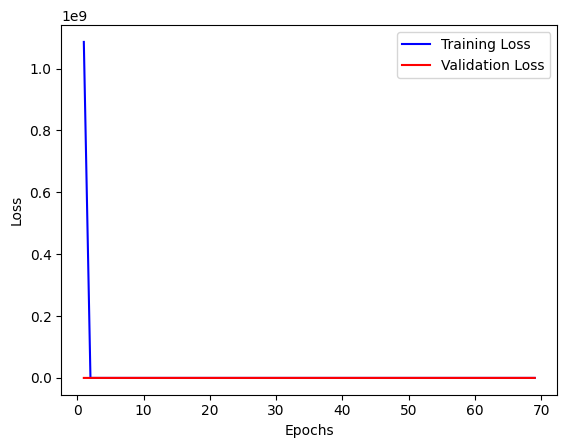

In [ ]:
# Access the loss values from the training history
train_loss = history['loss']
val_loss = history['val_loss']

# Access the number of epochs
epochs = range(1, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

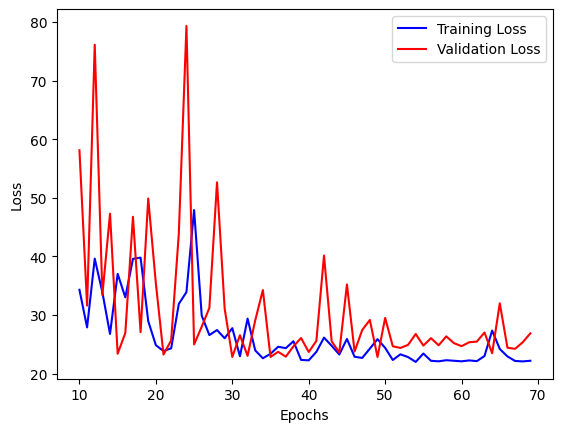

In [ ]:
epochs = range(10, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss[9:], 'b', label='Training Loss')
plt.plot(epochs, val_loss[9:], 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
predictions = model.predict([dup_bae_3d_im_test, bae_3d_sexes_test])

1/1 [==============================] - 20s 20s/step


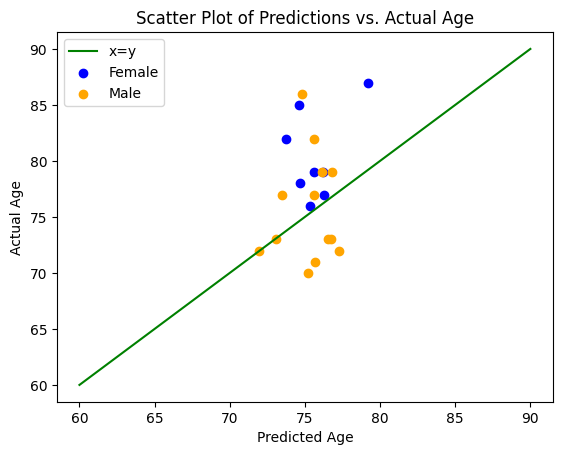

In [ ]:
color = {1:'orange',-1:'blue'}
label = {1:'Male',-1:'Female'}
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.plot([60,90], [60,90], c='green', label='x=y')

for g in [-1,1]:
    i = np.where(bae_3d_sexes_test == g)
    plt.scatter(predictions[i], bae_3d_ages_test[i], c=color[g], label = label[g])

# Add labels and title
plt.xlabel('Predicted Age')
plt.ylabel('Actual Age')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

In [ ]:
import numpy as np
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, confusion_matrix
from scipy.stats import pearsonr

def evaluate_predictions(predictions, true_values):
    # Calculate R^2
    r2 = r2_score(true_values, predictions)

    # Calculate MSE
    mse = mean_squared_error(true_values, predictions)

    # Calculate RMSE
    rmse = np.sqrt(mse)

    # Calculate MAE
    mae = mean_absolute_error(true_values, predictions)

    # Calculate Pearson's correlation coefficient
    r, _ = pearsonr(true_values, predictions)



    return r2, rmse, mse, mae, r

# Sample data
# (You'll need to define 'predictions' and 'bae_3d_ages_test' before calling the function)

r2, rmse, mse, mae, pearson_r = evaluate_predictions([float(i) for i in predictions], bae_3d_ages_test)
print(f"R^2: {r2}")
print(f"RMSE: {rmse}")
print(f"MSE: {mse}")
print(f"MAE: {mae}")
print(f"Pearson's r: {pearson_r}")


R^2: -0.148869634966176
RMSE: 5.184080628220307
MSE: 26.874691959889052
MAE: 4.167414710635231
Pearson's r: 0.19981059684333607


### V6

In [ ]:
from classification_models_3D.tfkeras import Classifiers

vgg19, preprocess_input = Classifiers.get('vgg19')
pretrained_model = vgg19(input_shape=(79, 95, 68, 3), weights='imagenet')

In [ ]:
duplicated_data = np.repeat(image_data, 3, axis=-1)
print(duplicated_data.shape)

NameError: ignored

In [ ]:
from keras.backend import dropout
import time
import optuna
from optuna.samplers import TPESampler
from sklearn.model_selection import cross_val_score
from keras.optimizers import Adam
import traceback
import gc

def create_model(learning_rate, neurons1, neurons2):

  # Define the input layer for the 3D Convolutional network
  model = Sequential()

  for layer in pretrained_model.layers:
      model.add(layer)

  # Freeze the weights of the pre-trained layers so they are not updated during training
  for layer in model.layers:
      layer.trainable = False


  # Flatten the output of the pre-trained model
  x = Flatten()(model.output)

  # Add Dense layers after concatenation
  x = Dense(neurons1, activation='relu')(x)
  x = Dense(neurons2, activation='relu')(x)

  additional_input = Input(shape=(1,))
  # Concatenate the flattened output with the new input
  concatenated = concatenate([x, additional_input])
  output = Dense(1, activation='linear')(concatenated)  # Use 'linear' activation for regression tasks

  # Create the final model
  model = Model(inputs=[pretrained_model.input, additional_input], outputs=output)

  for layer in model.layers[19:]:
            layer.trainable = True


  METRICS = [keras.metrics.MeanSquaredError(name='mse'),
               keras.metrics.MeanAbsoluteError(name='mae')]
  optimizer = Adam(learning_rate=learning_rate)
  # Compile the model
  model.compile(loss='mean_squared_error', optimizer=optimizer, metrics=METRICS)

  return(model)




def objective(trial, X = duplicated_data,y=ages,z=sexes,K = 5):
    global the_best_score
    """return the mse"""
    neurons1 = trial.suggest_int('neurons1', low = 2, high = 256, step = 16)
    neurons2 = trial.suggest_int('neurons2', low = 2, high = 256, step = 16)
    batch_size = trial.suggest_int('batch_size', low = 16, high = 64, step = 8)
    learning_rate = trial.suggest_float('learning_rate', low = 0.00001, high = 0.01, step = 0.0005)

    callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=25, start_from_epoch=50, baseline = 100)
    # random forest classifier object
    scores = []
    best_scores = []
    for train, test in StratifiedKFold(n_splits=K, shuffle=True).split(X,z):
        model = create_model(neurons1 = neurons1, neurons2 = neurons2, learning_rate = learning_rate)
        try:
          history = model.fit([X[train], z[train]], y[train],
                                    validation_data = ([X[test], z[test]],y[test]), epochs=125, batch_size=batch_size, callbacks= [callback]).history
          scores.append(model.evaluate([X[test], z[test]], y[test], verbose = 0))# evaluate the test dataset
          best_scores.append(min(history['val_loss']))
        except:
          traceback.print_exc()
          return(2000)
    the_best_score.append(np.mean(best_scores))
    return(np.mean(scores))


the_best_score = []
# create a study (aim to maximize score)
study = optuna.create_study(sampler=TPESampler(), direction='minimize')

# perform hyperparamter tuning (while timing the process)
time_start = time.time()
study.optimize(objective, n_trials=20, gc_after_trial=True)
time_bayesian = time.time() - time_start

columns = ['Number of iterations', 'Iteration Number of Optimal Hyperparamters', 'Score', 'Time Elapsed (s)']

# store result in a data frame
values_bayesian = [100, study.best_trial.number, study.best_trial.value, time_bayesian]
results_bayesian = pd.DataFrame([values_bayesian], columns = columns)

[I 2023-08-25 21:44:26,465] A new study created in memory with name: no-name-fe109a48-7487-44b1-80ab-b5c5a81d7ddb
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 256] and step=16, but the range is not divisible by `step`. It will be replaced by [2, 242].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:685: UserWarning: The distribution is specified by [1e-05, 0.01] and step=0.0005, but the range is not divisible by `step`. It will be replaced by [1e-05, 0.00951].
  warnings.warn(


Epoch 1/125
3/3 [==============================] - 77s 20s/step - loss: 146997.3594 - mse: 146997.3594 - mae: 323.7651 - val_loss: 842.7560 - val_mse: 842.7560 - val_mae: 28.7473
Epoch 2/125
3/3 [==============================] - 9s 3s/step - loss: 692.4028 - mse: 692.4028 - mae: 24.1966 - val_loss: 857.1779 - val_mse: 857.1779 - val_mae: 28.8787
Epoch 3/125
3/3 [==============================] - 9s 3s/step - loss: 963.5236 - mse: 963.5236 - mae: 27.6239 - val_loss: 1090.2405 - val_mse: 1090.2405 - val_mae: 32.6443
Epoch 4/125
3/3 [==============================] - 9s 3s/step - loss: 515.1633 - mse: 515.1633 - mae: 19.2332 - val_loss: 441.3922 - val_mse: 441.3922 - val_mae: 20.5995
Epoch 5/125
3/3 [==============================] - 9s 3s/step - loss: 285.6599 - mse: 285.6599 - mae: 14.9951 - val_loss: 244.6807 - val_mse: 244.6807 - val_mae: 14.8487
Epoch 6/125
3/3 [==============================] - 9s 3s/step - loss: 128.9642 - mse: 128.9642 - mae: 9.3298 - val_loss: 170.3097 - val_mse

Traceback (most recent call last):
  File "<ipython-input-55-300bc1734d52>", line 68, in objective
    history = model.fit([X[train], z[train]], y[train],
  File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 70, in error_handler
    raise e.with_traceback(filtered_tb) from None
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/execute.py", line 52, in quick_execute
    tensors = pywrap_tfe.TFE_Py_Execute(ctx._handle, device_name, op_name,
tensorflow.python.framework.errors_impl.ResourceExhaustedError: Graph execution error:

Detected at node 'model_5/block1_conv2/Conv3D' defined at (most recent call last):
    File "/usr/lib/python3.10/runpy.py", line 196, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "/usr/lib/python3.10/runpy.py", line 86, in _run_code
      exec(code, run_globals)
    File "/usr/local/lib/python3.10/dist-packages/ipykernel_launcher.py", line 16, in <module>
      app.launch_new

Epoch 1/125
4/4 [==============================] - 40s 6s/step - loss: 8018.0649 - mse: 8018.0640 - mae: 72.6672 - val_loss: 1623.1744 - val_mse: 1623.1744 - val_mae: 40.1226
Epoch 2/125
4/4 [==============================] - 10s 3s/step - loss: 2382.5037 - mse: 2382.5037 - mae: 48.2625 - val_loss: 812.8715 - val_mse: 812.8715 - val_mae: 28.1313
Epoch 3/125
4/4 [==============================] - 10s 2s/step - loss: 536.5755 - mse: 536.5755 - mae: 20.3759 - val_loss: 583.1462 - val_mse: 583.1462 - val_mae: 23.4685
Epoch 4/125
4/4 [==============================] - 9s 2s/step - loss: 259.7328 - mse: 259.7329 - mae: 13.2118 - val_loss: 366.6834 - val_mse: 366.6834 - val_mae: 18.2444
Epoch 5/125
4/4 [==============================] - 9s 2s/step - loss: 315.0962 - mse: 315.0962 - mae: 17.1881 - val_loss: 99.3549 - val_mse: 99.3549 - val_mae: 8.6701
Epoch 6/125
4/4 [==============================] - 10s 2s/step - loss: 61.6436 - mse: 61.6436 - mae: 6.5242 - val_loss: 186.5989 - val_mse: 186.

[I 2023-08-26 00:13:36,420] Trial 1 finished with value: 20.422413237889607 and parameters: {'neurons1': 178, 'neurons2': 114, 'batch_size': 24, 'learning_rate': 0.00701}. Best is trial 1 with value: 20.422413237889607.
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 256] and step=16, but the range is not divisible by `step`. It will be replaced by [2, 242].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:685: UserWarning: The distribution is specified by [1e-05, 0.01] and step=0.0005, but the range is not divisible by `step`. It will be replaced by [1e-05, 0.00951].
  warnings.warn(


Epoch 1/125


Traceback (most recent call last):
  File "<ipython-input-55-300bc1734d52>", line 68, in objective
    history = model.fit([X[train], z[train]], y[train],
  File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 70, in error_handler
    raise e.with_traceback(filtered_tb) from None
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/execute.py", line 52, in quick_execute
    tensors = pywrap_tfe.TFE_Py_Execute(ctx._handle, device_name, op_name,
tensorflow.python.framework.errors_impl.ResourceExhaustedError: Graph execution error:

Detected at node 'model_11/block1_conv2/Conv3D' defined at (most recent call last):
    File "/usr/lib/python3.10/runpy.py", line 196, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "/usr/lib/python3.10/runpy.py", line 86, in _run_code
      exec(code, run_globals)
    File "/usr/local/lib/python3.10/dist-packages/ipykernel_launcher.py", line 16, in <module>
      app.launch_ne

Epoch 1/125


Traceback (most recent call last):
  File "<ipython-input-55-300bc1734d52>", line 68, in objective
    history = model.fit([X[train], z[train]], y[train],
  File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 70, in error_handler
    raise e.with_traceback(filtered_tb) from None
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/execute.py", line 52, in quick_execute
    tensors = pywrap_tfe.TFE_Py_Execute(ctx._handle, device_name, op_name,
tensorflow.python.framework.errors_impl.ResourceExhaustedError: Graph execution error:

Detected at node 'model_12/block1_conv2/Conv3D' defined at (most recent call last):
    File "/usr/lib/python3.10/runpy.py", line 196, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "/usr/lib/python3.10/runpy.py", line 86, in _run_code
      exec(code, run_globals)
    File "/usr/local/lib/python3.10/dist-packages/ipykernel_launcher.py", line 16, in <module>
      app.launch_ne

Epoch 1/125


Traceback (most recent call last):
  File "<ipython-input-55-300bc1734d52>", line 68, in objective
    history = model.fit([X[train], z[train]], y[train],
  File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 70, in error_handler
    raise e.with_traceback(filtered_tb) from None
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/execute.py", line 52, in quick_execute
    tensors = pywrap_tfe.TFE_Py_Execute(ctx._handle, device_name, op_name,
tensorflow.python.framework.errors_impl.ResourceExhaustedError: Graph execution error:

Detected at node 'model_13/block1_conv2/Conv3D' defined at (most recent call last):
    File "/usr/lib/python3.10/runpy.py", line 196, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "/usr/lib/python3.10/runpy.py", line 86, in _run_code
      exec(code, run_globals)
    File "/usr/local/lib/python3.10/dist-packages/ipykernel_launcher.py", line 16, in <module>
      app.launch_ne

Epoch 1/125
4/4 [==============================] - 11s 3s/step - loss: 4974.5542 - mse: 4974.5537 - mae: 70.0223 - val_loss: 1733.2891 - val_mse: 1733.2891 - val_mae: 41.3524
Epoch 2/125
4/4 [==============================] - 10s 3s/step - loss: 804.9641 - mse: 804.9641 - mae: 24.1532 - val_loss: 1234.2675 - val_mse: 1234.2675 - val_mae: 34.7991
Epoch 3/125
4/4 [==============================] - 10s 3s/step - loss: 970.8572 - mse: 970.8572 - mae: 30.4200 - val_loss: 78.3020 - val_mse: 78.3020 - val_mae: 7.5574
Epoch 4/125
4/4 [==============================] - 10s 3s/step - loss: 106.3131 - mse: 106.3131 - mae: 8.7447 - val_loss: 361.9982 - val_mse: 361.9982 - val_mae: 18.4038
Epoch 5/125
4/4 [==============================] - 10s 2s/step - loss: 412.7760 - mse: 412.7760 - mae: 19.6950 - val_loss: 178.3458 - val_mse: 178.3458 - val_mae: 12.4515
Epoch 6/125
4/4 [==============================] - 9s 2s/step - loss: 110.7704 - mse: 110.7704 - mae: 8.6005 - val_loss: 88.2898 - val_mse: 88.

Traceback (most recent call last):
  File "<ipython-input-55-300bc1734d52>", line 68, in objective
    history = model.fit([X[train], z[train]], y[train],
  File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 65, in error_handler
    return fn(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/keras/engine/training.py", line 1685, in fit
    tmp_logs = self.train_function(iterator)
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/util/traceback_utils.py", line 150, in error_handler
    return fn(*args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/polymorphic_function/polymorphic_function.py", line 894, in __call__
    result = self._call(*args, **kwds)
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/polymorphic_function/polymorphic_function.py", line 926, in _call
    return self._no_variable_creation_fn(*args, **kwds)  # pylint: disable=not-callable
  File "/usr/

Epoch 1/125


Traceback (most recent call last):
  File "<ipython-input-55-300bc1734d52>", line 68, in objective
    history = model.fit([X[train], z[train]], y[train],
  File "/usr/local/lib/python3.10/dist-packages/keras/utils/traceback_utils.py", line 70, in error_handler
    raise e.with_traceback(filtered_tb) from None
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/execute.py", line 52, in quick_execute
    tensors = pywrap_tfe.TFE_Py_Execute(ctx._handle, device_name, op_name,
tensorflow.python.framework.errors_impl.ResourceExhaustedError: Graph execution error:

Detected at node 'model_17/block1_conv2/Conv3D' defined at (most recent call last):
    File "/usr/lib/python3.10/runpy.py", line 196, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "/usr/lib/python3.10/runpy.py", line 86, in _run_code
      exec(code, run_globals)
    File "/usr/local/lib/python3.10/dist-packages/ipykernel_launcher.py", line 16, in <module>
      app.launch_ne

Epoch 1/125


### Version 7 from paper

In [31]:
import numpy as np
from keras.models import Sequential
from keras.layers import Conv3D, MaxPooling3D, BatchNormalization, Dense, Flatten, Activation
from keras.optimizers import SGD

def create_model():
    model = Sequential()

    # Number of feature channels
    num_channels = 8

    # Repeated 5 blocks
    for _ in range(4):
        # (3x3x3) Convolutional layer with stride of 1
        model.add(Conv3D(filters=num_channels, kernel_size=(3, 3, 3), strides=(1, 1, 1), padding='same', input_shape=(79, 95, 68, 1)))
        model.add(Activation('relu'))

        # Another (3x3x3) Convolutional layer with stride of 1
        model.add(Conv3D(filters=num_channels, kernel_size=(3, 3, 3), strides=(1, 1, 1), padding='same'))

        # 3D Batch-normalization layer
        model.add(BatchNormalization())

        # ReLU
        model.add(Activation('relu'))

        # (2x2x2) Max-pooling layer with stride of 2
        model.add(MaxPooling3D(pool_size=(2, 2, 2), strides=(2, 2, 2)))

        # Double the number of feature channels for the next block
        num_channels *= 2

    # Flatten the output
    model.add(Flatten())

    # Fully connected layer for age prediction
    model.add(Dense(1))
    sgd = SGD(learning_rate=0.01, momentum=0.9)

    model.compile(optimizer=sgd, loss='mean_absolute_error')
    return model


In [81]:
# Assuming you have your data for predictions, test_labels, and sex_train
# Create a scatter plot
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, start_from_epoch=100, baseline = 50)
from keras.callbacks import ReduceLROnPlateau
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, verbose=1)

model = create_model()
history = model.fit(bae_3d_im_train, bae_3d_ages_train, validation_data = (bae_3d_im_test, bae_3d_ages_test), epochs = 200, batch_size = 28, callbacks = [callback, reduce_lr]).history
predictions = model.predict(bae_3d_im_test)

Epoch 1/200
3/3 [==============================] - 3s 726ms/step - loss: 63.1213 - val_loss: 143878.2188 - lr: 0.0100
Epoch 2/200
3/3 [==============================] - 2s 589ms/step - loss: 27.9943 - val_loss: 5284320.5000 - lr: 0.0100
Epoch 3/200
3/3 [==============================] - 2s 587ms/step - loss: 20.9263 - val_loss: 1792765.3750 - lr: 0.0100
Epoch 4/200
3/3 [==============================] - 2s 580ms/step - loss: 17.7048 - val_loss: 899228.5625 - lr: 0.0100
Epoch 5/200
3/3 [==============================] - 2s 588ms/step - loss: 18.9727 - val_loss: 344685.4062 - lr: 0.0100
Epoch 6/200
3/3 [==============================] - 2s 589ms/step - loss: 15.8446 - val_loss: 197968.8281 - lr: 0.0100
Epoch 7/200
3/3 [==============================] - 2s 589ms/step - loss: 9.2331 - val_loss: 115423.0938 - lr: 0.0100
Epoch 8/200
3/3 [==============================] - 2s 588ms/step - loss: 9.8479 - val_loss: 61582.3203 - lr: 0.0100
Epoch 9/200
3/3 [==============================] - 2s 589

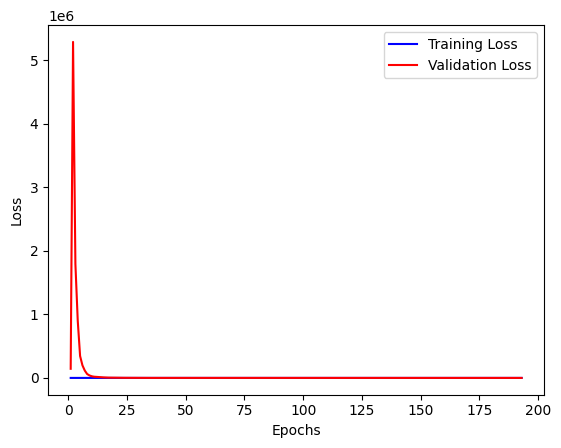

In [82]:
# Access the loss values from the training history
train_loss = history['loss']
val_loss = history['val_loss']

# Access the number of epochs
epochs = range(1, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

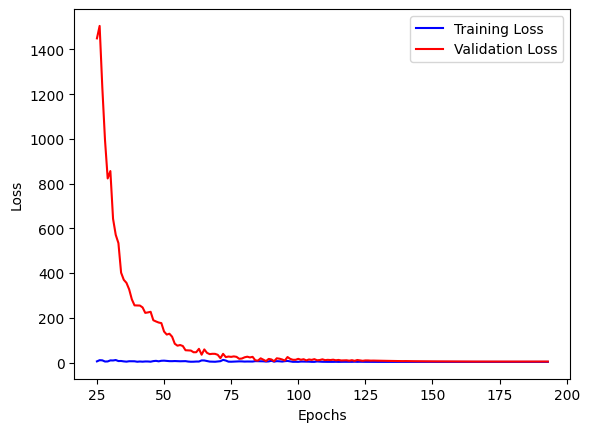

In [84]:
epochs = range(25, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss[24:], 'b', label='Training Loss')
plt.plot(epochs, val_loss[24:], 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

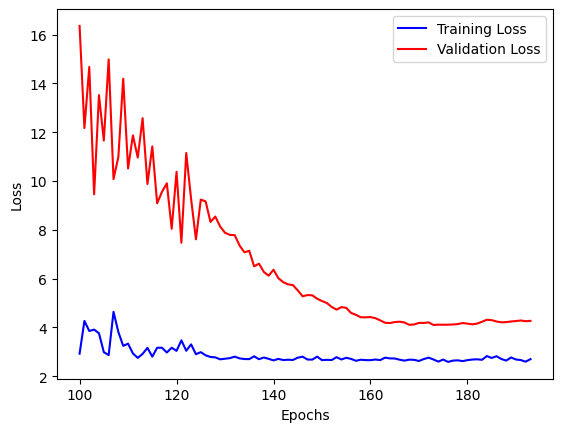

In [85]:
epochs = range(100, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss[99:], 'b', label='Training Loss')
plt.plot(epochs, val_loss[99:], 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [86]:
predictions = model.predict(bae_3d_im_test)

1/1 [==============================] - 0s 72ms/step


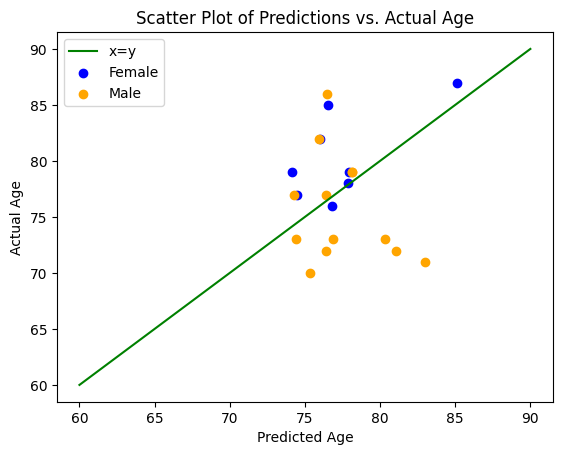

In [87]:
color = {1:'orange',-1:'blue'}
label = {1:'Male',-1:'Female'}
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.plot([60,90], [60,90], c='green', label='x=y')

for g in [-1,1]:
    i = np.where(bae_3d_sexes_test == g)
    plt.scatter(predictions[i], bae_3d_ages_test[i], c=color[g], label = label[g])

# Add labels and title
plt.xlabel('Predicted Age')
plt.ylabel('Actual Age')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

In [88]:
import numpy as np
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, confusion_matrix
from scipy.stats import pearsonr

def evaluate_predictions(predictions, true_values):
    # Calculate R^2
    r2 = r2_score(true_values, predictions)

    # Calculate MSE
    mse = mean_squared_error(true_values, predictions)

    # Calculate RMSE
    rmse = np.sqrt(mse)

    # Calculate MAE
    mae = mean_absolute_error(true_values, predictions)

    # Calculate Pearson's correlation coefficient
    r, _ = pearsonr(true_values, predictions)



    return r2, rmse, mse, mae, r

# Sample data
# (You'll need to define 'predictions' and 'bae_3d_ages_test' before calling the function)

r2, rmse, mse, mae, pearson_r = evaluate_predictions([float(i) for i in predictions], bae_3d_ages_test)
print(f"R^2: {r2}")
print(f"RMSE: {rmse}")
print(f"MSE: {mse}")
print(f"MAE: {mae}")
print(f"Pearson's r: {pearson_r}")


R^2: -0.26844926042756345
RMSE: 5.447194990690193
MSE: 29.671933266600327
MAE: 4.271571568080357
Pearson's r: 0.05750768760117074


### Extended data model

In [467]:
import gc
gc.collect()

11451

In [463]:
dup_full_3d_im_train = np.repeat(full_3d_im_train, 3, axis=-1)
dup_full_3d_im_test = np.repeat(full_3d_im_test, 3, axis=-1)

In [465]:
len(full_3d_sexes_train)

374

In [468]:
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, start_from_epoch=10, baseline = 50)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, verbose=1)
model = create_model(10, 18, 18)
history = model.fit([dup_full_3d_im_train, full_3d_sexes_train], full_3d_ages_train,
                    validation_data= ([dup_full_3d_im_test, full_3d_sexes_test], full_3d_ages_test), epochs = 100,
                    batch_size = 16, callbacks = [callback, reduce_lr]).history

Epoch 1/100
24/24 [==============================] - 58s 2s/step - loss: 239664160.0000 - mae: 3233.5178 - val_loss: 111.3423 - val_mae: 8.9646 - lr: 0.0010
Epoch 2/100
24/24 [==============================] - 44s 2s/step - loss: 53.6265 - mae: 5.8174 - val_loss: 31.9261 - val_mae: 4.4820 - lr: 0.0010
Epoch 3/100
24/24 [==============================] - 45s 2s/step - loss: 35.3774 - mae: 4.8694 - val_loss: 30.4238 - val_mae: 4.4216 - lr: 0.0010
Epoch 4/100
24/24 [==============================] - 44s 2s/step - loss: 40.0343 - mae: 4.9296 - val_loss: 40.2896 - val_mae: 5.2276 - lr: 0.0010
Epoch 5/100
24/24 [==============================] - 44s 2s/step - loss: 36.1238 - mae: 4.8112 - val_loss: 55.6728 - val_mae: 6.3367 - lr: 0.0010
Epoch 6/100
24/24 [==============================] - 44s 2s/step - loss: 71.7019 - mae: 7.0161 - val_loss: 124.4331 - val_mae: 10.0432 - lr: 0.0010
Epoch 7/100
24/24 [==============================] - 44s 2s/step - loss: 40.5479 - mae: 4.8712 - val_loss: 30.7

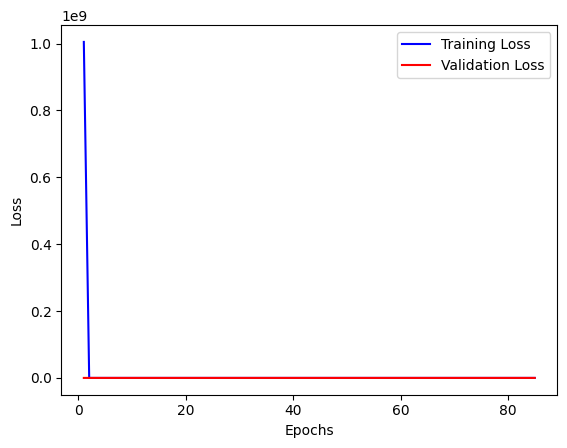

In [237]:
# Access the loss values from the training history
train_loss = history['loss']
val_loss = history['val_loss']

# Access the number of epochs
epochs = range(1, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

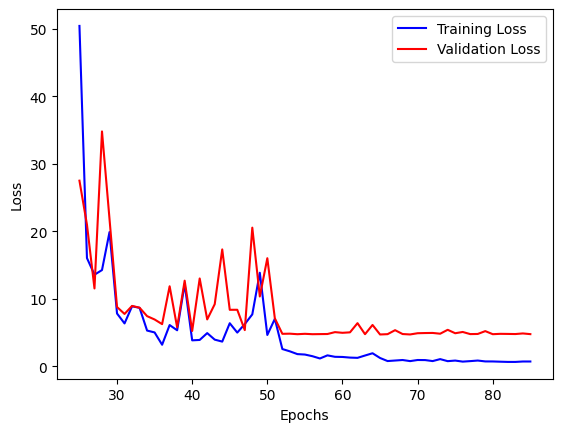

In [238]:
epochs = range(25, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss[24:], 'b', label='Training Loss')
plt.plot(epochs, val_loss[24:], 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [260]:
len(predictions)

84

In [ ]:
predictions = []
for i in range(84):
  prediction =  model.predict([dup_full_3d_im_test[i:i+1], full_3d_sexes_test[i:i+1]])
  predictions.append(prediction)

In [259]:
predictions = [i[0][0] for i in predictions]

In [265]:
full_3d_sexes_test

array([-1,  1,  1,  1,  1,  1,  1,  1, -1,  1,  1,  1, -1, -1,  1,  1, -1,
       -1, -1,  1, -1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
       -1,  1,  1,  1,  1, -1,  1, -1, -1, -1,  1, -1, -1,  1, -1,  1, -1,
       -1,  1,  1, -1, -1, -1, -1,  1, -1,  1,  1, -1,  1,  1,  1,  1,  1,
        1,  1,  1,  1, -1, -1, -1, -1,  1,  1,  1,  1,  1, -1, -1,  1])

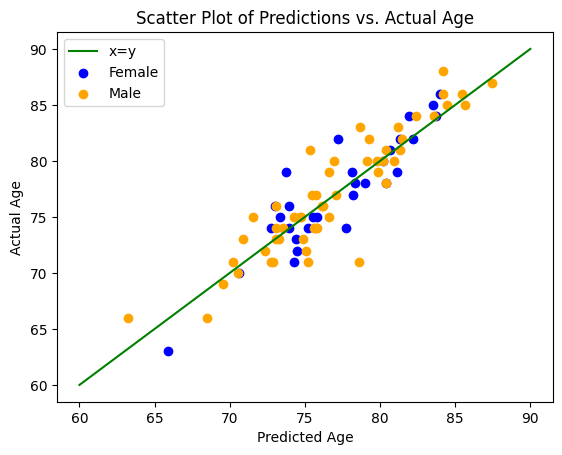

In [268]:
color = {1:'orange',-1:'blue'}
label = {1:'Male',-1:'Female'}
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.plot([60,90], [60,90], c='green', label='x=y')

for g in [-1,1]:
    i = np.where(full_3d_sexes_test == g)
    plt.scatter(np.array(predictions)[i], full_3d_ages_test[i], c=color[g], label = label[g])

# Add labels and title
plt.xlabel('Predicted Age')
plt.ylabel('Actual Age')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

In [269]:
import numpy as np
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, confusion_matrix
from scipy.stats import pearsonr

def evaluate_predictions(predictions, true_values):
    # Calculate R^2
    r2 = r2_score(true_values, predictions)

    # Calculate MSE
    mse = mean_squared_error(true_values, predictions)

    # Calculate RMSE
    rmse = np.sqrt(mse)

    # Calculate MAE
    mae = mean_absolute_error(true_values, predictions)

    # Calculate Pearson's correlation coefficient
    r, _ = pearsonr(true_values, predictions)



    return r2, rmse, mse, mae, r

# Sample data
# (You'll need to define 'predictions' and 'bae_3d_ages_test' before calling the function)

r2, rmse, mse, mae, pearson_r = evaluate_predictions(predictions, full_3d_ages_test)
print(f"R^2: {r2}")
print(f"RMSE: {rmse}")
print(f"MSE: {mse}")
print(f"MAE: {mae}")
print(f"Pearson's r: {pearson_r}")


R^2: 0.8250734802420392
RMSE: 2.1786277564530527
MSE: 4.746418901187662
MAE: 1.626901081630162
Pearson's r: 0.9089586459679259


### 3D saliency map

In [568]:
import tensorflow as tf

def compute_saliency_3d(model, image_input, extra_input):
    # Create a TensorFlow Variable from the image input
    image_input_tensor = tf.Variable(image_input, dtype=tf.float32)

    # Compute the gradient
    with tf.GradientTape() as tape:
        tape.watch(image_input_tensor)
        predictions = model([image_input_tensor, extra_input])
        loss = tf.reduce_sum(predictions)  # Summing all predictions to get a scalar value

    gradients = tape.gradient(loss, image_input_tensor)
    gradients = tf.reduce_max(gradients, axis=-1)
    gradients = gradients.numpy()

    min_val, max_val = np.min(gradients), np.max(gradients)
    saliency_map = (gradients - min_val) / (max_val - min_val + keras.backend.epsilon())


    # Compute the saliency map
    #saliency_map = tf.math.abs(gradients).numpy()

    return saliency_map



saliency = compute_saliency_3d(model, dup_full_3d_im_test[:10], full_3d_sexes_test[:10])


In [569]:
saliency.shape

(10, 79, 95, 68)

In [570]:
import matplotlib.pyplot as plt

def plot_saliency_3d_slices(data, slice_index, vmin, vmax):
    slice_dim = 'sagittal'
    slice_data = np.rot90(data[:, :, slice_index])
    plt.imshow(slice_data, cmap="viridis", vmin=vmin, vmax=vmax)
    plt.colorbar()
    plt.title(f'{slice_dim.capitalize()} Saliency Slice at Index {slice_index}')
    plt.show()

def plot_3d_slices(data, slice_index):
    slice_dim = 'sagittal'
    slice_data = np.rot90(data[:, :, slice_index])
    plt.imshow(slice_data, cmap="bone")
    plt.title(f'{slice_dim.capitalize()} Slice at Index {slice_index}')
    plt.show()


In [ ]:
vmin = np.min([im for i,im in enumerate(saliency[i]) if i in [5,15,25,35,45,55,65]])
vmax = np.max([im for i,im in enumerate(saliency[i]) if i in [5,15,25,35,45,55,65]])
i = 5
for idx in [5,15,25,35,45,55,65]:
  # Visualize a sagittal slice
  plot_saliency_3d_slices(saliency[i], idx, vmin = vmin, vmax=vmax)
  plot_3d_slices(dup_bae_3d_im_test[i], idx)






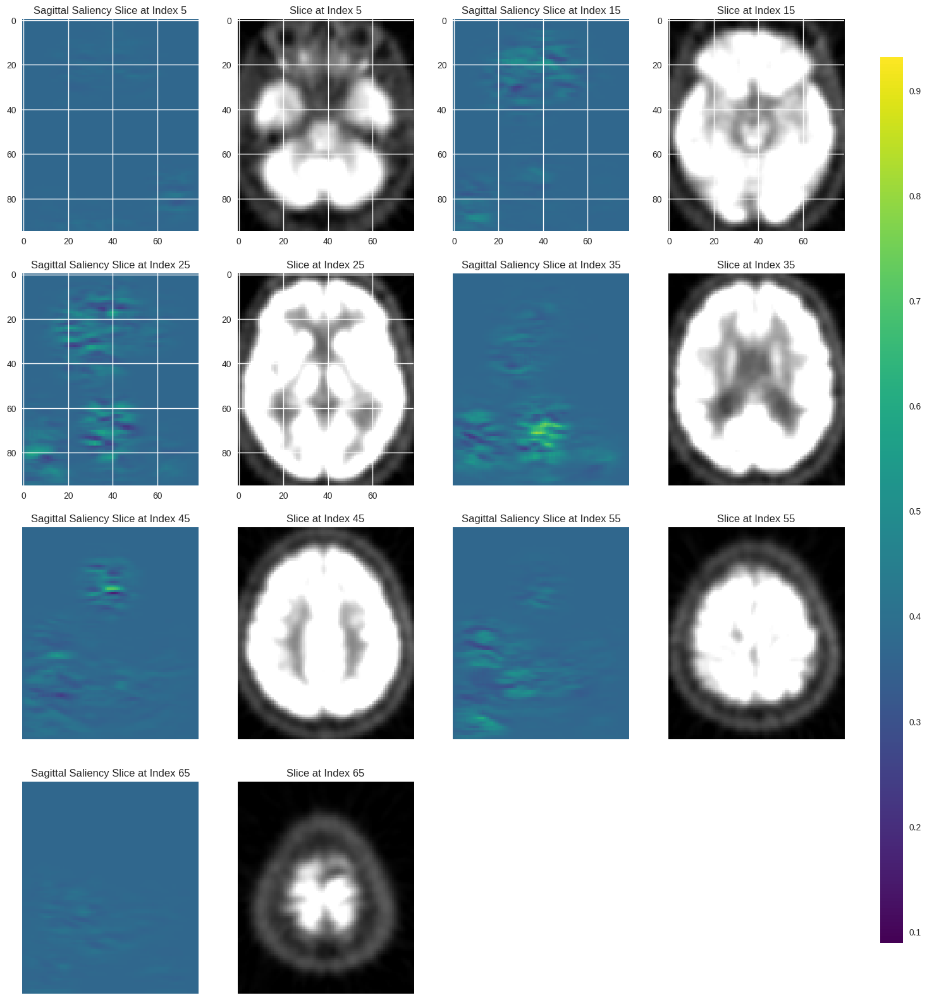

In [582]:
import numpy as np
import matplotlib.pyplot as plt
i = 5

def plot_saliency_3d_slices(ax, data, slice_index, vmin, vmax):
    slice_dim = 'sagittal'
    slice_data = np.rot90(data[:, :, slice_index])
    im = ax.imshow(slice_data, cmap="viridis", vmin=vmin, vmax=vmax)
    ax.set_title(f'{slice_dim.capitalize()} Saliency Slice at Index {slice_index}')
    return im

def plot_3d_slices(ax, data, slice_index):
    slice_dim = 'sagittal'
    slice_data = np.rot90(data[:, :, slice_index])
    ax.imshow(slice_data, cmap="bone")
    ax.set_title(f'Slice at Index {slice_index}')

# Determine global min and max values for the color scale
vmin = np.min(saliency[i])
vmax = np.max(saliency[i])

# Create a 4x4 grid of subplots
fig, axes = plt.subplots(4, 4, figsize=(18, 20))

indices = [5, 15, 25, 35, 45, 55, 65]
for j, idx in enumerate(indices):
    ax1 = axes[j // 2, j % 2 * 2]  # Determine the row and column in the grid for saliency
    ax2 = axes[j // 2, j % 2 * 2 + 1]  # Determine the row and column in the grid for original image

    im = plot_saliency_3d_slices(ax1, saliency[i], idx, vmin, vmax)
    plot_3d_slices(ax2, dup_bae_3d_im_test[i], idx)

# Hide the axes for the unused subplots
for k in range(6, 16):
    axes[k // 4, k % 4].axis('off')

# Adjust the layout to make space for the colorbar
fig.subplots_adjust(right=0.85)

# Add a single colorbar for the entire figure
cbar_ax = fig.add_axes([0.88, 0.15, 0.02, 0.7])
fig.colorbar(im, cax=cbar_ax)

plt.show()


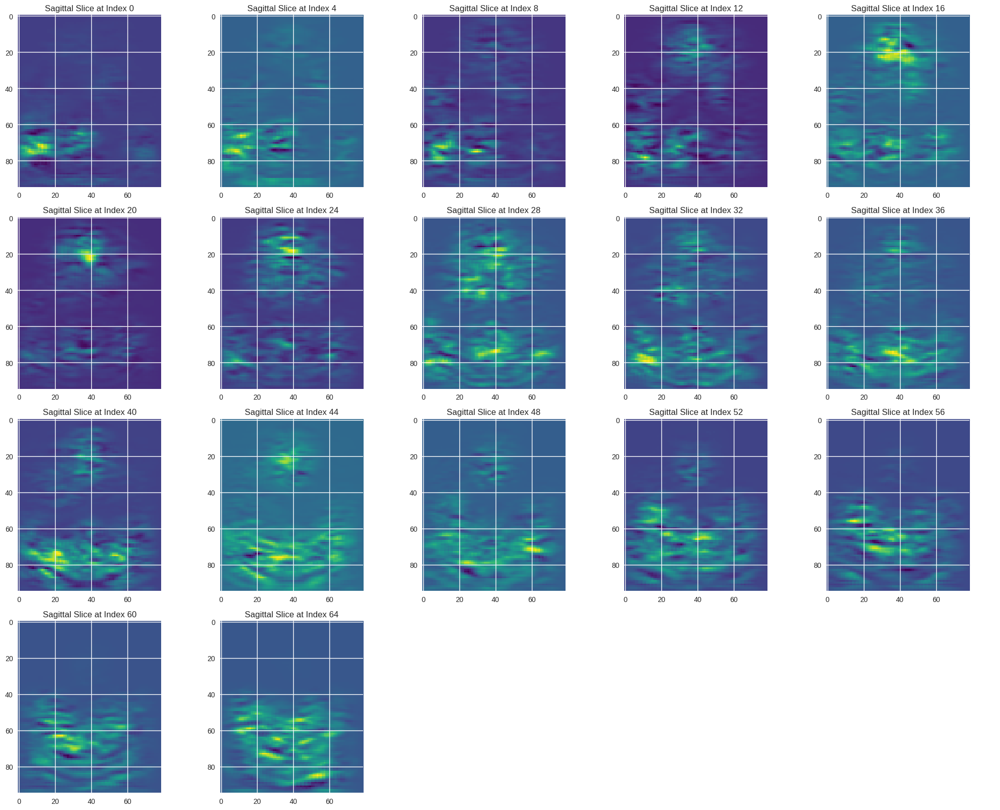

In [575]:
def plot_grid_saliency_3d_slices(ax, data, slice_index):
    slice_dim = 'sagittal'
    slice_data = np.rot90(data[:, :, slice_index])
    ax.imshow(slice_data, cmap="viridis")
    ax.set_title(f'{slice_dim.capitalize()} Slice at Index {slice_index}')

# Create a 4x5 grid of subplots
fig, axes = plt.subplots(4, 5, figsize=(20, 16))

for j in range(17):
    idx = j * 4
    ax = axes[j // 5, j % 5]  # Determine the row and column in the grid
    plot_grid_saliency_3d_slices(ax, averaged_map[0], idx)

# Hide the axes for the last 3 subplots
for i in range(3):
    axes[3, 4-i].axis('off')

plt.tight_layout()
plt.show()


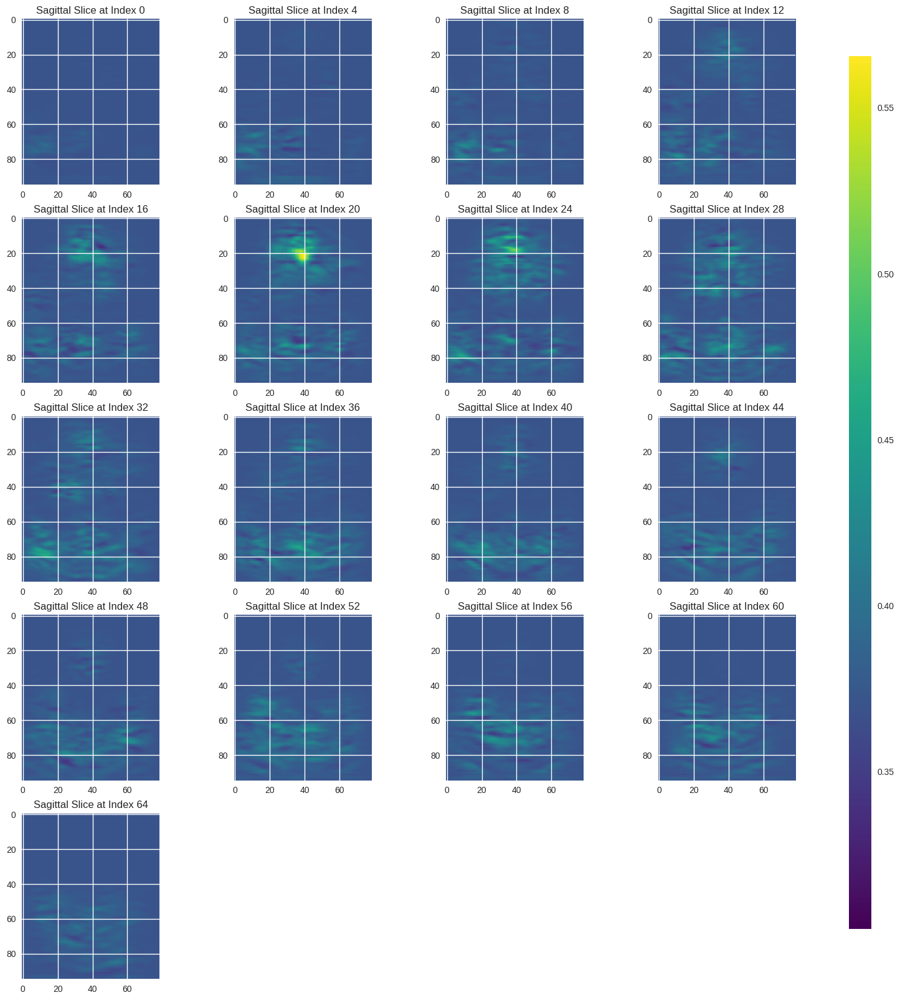

In [577]:
def plot_grid_saliency_3d_slices(ax, data, slice_index, vmin, vmax):
    slice_dim = 'sagittal'
    slice_data = np.rot90(data[:, :, slice_index])
    im = ax.imshow(slice_data, cmap="viridis", vmin=vmin, vmax=vmax)
    ax.set_title(f'{slice_dim.capitalize()} Slice at Index {slice_index}')
    return im

# Determine global min and max values for the color scale
vmin = np.min(averaged_map[0])
vmax = np.max(averaged_map[0])

# Create a 5x4 grid of subplots
fig, axes = plt.subplots(5, 4, figsize=(18, 20))

for j in range(17):
    idx = j * 4
    ax = axes[j // 4, j % 4]  # Determine the row and column in the grid
    im = plot_grid_saliency_3d_slices(ax, averaged_map[0], idx, vmin, vmax)

# Hide the axes for the last 3 subplots
for i in range(3):
    axes[4, 3-i].axis('off')

# Adjust the layout to make space for the colorbar
fig.subplots_adjust(right=0.85)

# Add a single colorbar for the entire figure
cbar_ax = fig.add_axes([0.88, 0.15, 0.02, 0.7])
fig.colorbar(im, cax=cbar_ax)

plt.show()


In [574]:
import numpy as np

# Assuming saliency_maps is your array of shape (10, 79, 95, 68, 3)

# Average across the 10 images
averaged_map = np.mean(saliency, axis=0)

# To make it of shape (1, 79, 95, 68, 3)
averaged_map = averaged_map[np.newaxis, ...]


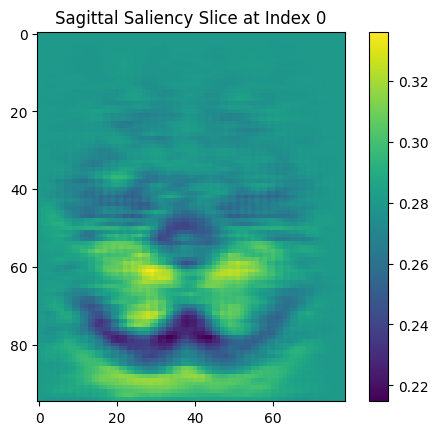

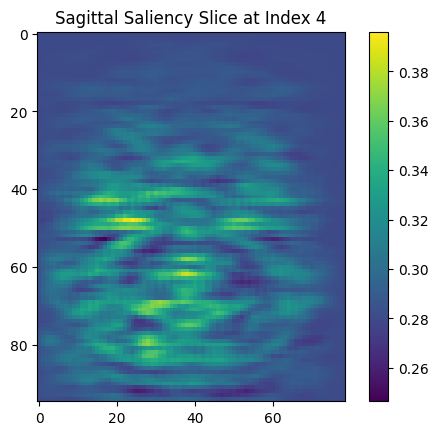

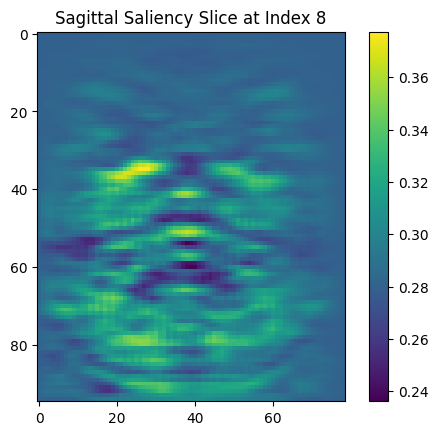

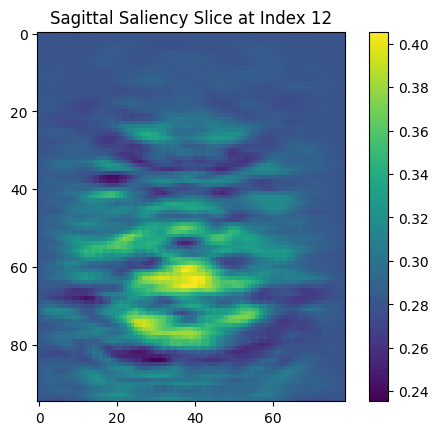

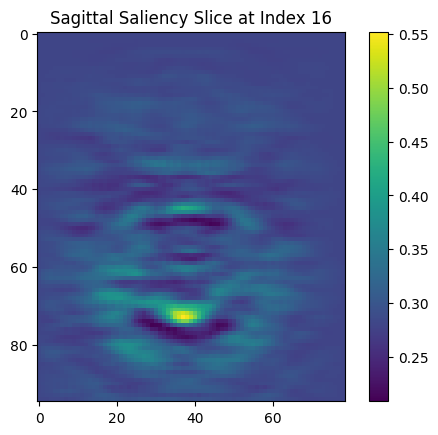

...

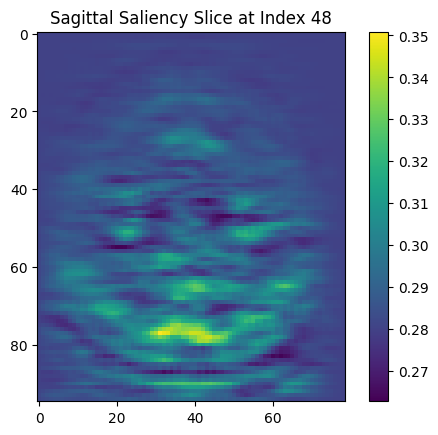

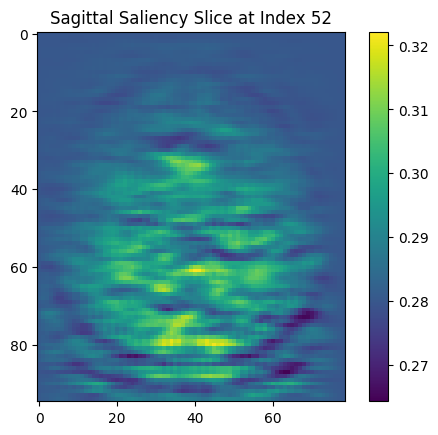

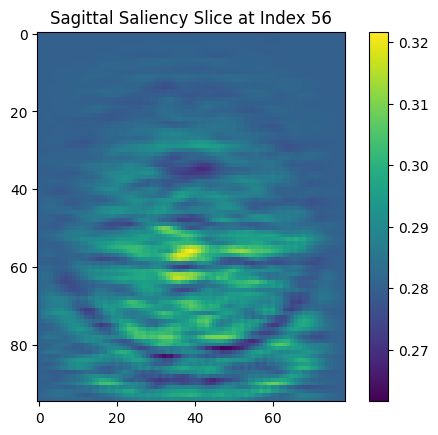

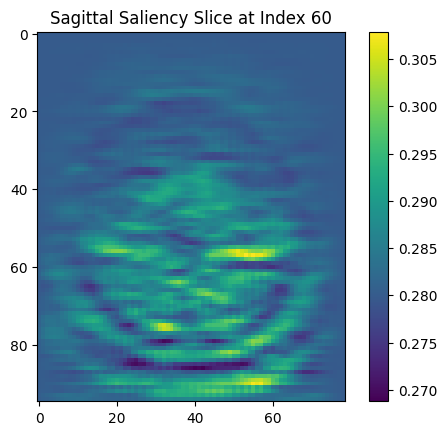

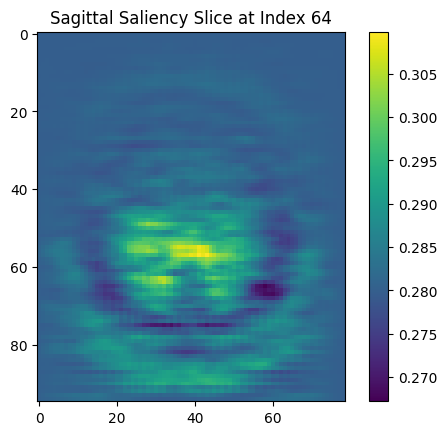

In [116]:
for j in range(17):
  idx = j * 4
  # Visualize a sagittal slice
  plot_saliency_3d_slices(averaged_map[0], idx)


## 2D

### Creating the 2D data

In [31]:
from skimage.feature import greycomatrix
from skimage import img_as_ubyte
twod_df = pd.DataFrame(columns = ['id','age','sex','entropy','data', 'split'])
slice_counter = 0
rotation_angle = 90
counter = 0
for image_array, age, sex in zip(image_data, ages, sexes):
  counter += 1
  nx, ny, nz, nw = image_array.shape
  total_volumes = image_array.shape[3]
  total_slices = image_array.shape[2]
  if counter -1 in train_idx:
    split = 'train'
  else:
    split = 'test'
  for current_volume in range(0, total_volumes):
      # iterate through slices
      for current_slice in range(0, total_slices):
          if (slice_counter % 1) == 0:
              if rotation_angle == 90:
                  data = np.rot90(image_array[:, :, current_slice, current_volume])
              elif rotation_angle == 180:
                  data = np.rot90(np.rot90(image_array[:, :, current_slice, current_volume]))
              elif rotation_angle == 270:
                  data = np.rot90(np.rot90(np.rot90(image_array[:, :, current_slice, current_volume])))
              #alternate slices and save as png
              if (slice_counter % 1) == 0:
                  print('Adding image...')
                  min_val = np.min(data)
                  max_val = np.max(data)
                  im = 2 * (data - min_val) / (max_val - min_val) - 1
                  im = img_as_ubyte(im)
                  glcm = np.squeeze(greycomatrix(im, distances=[1], angles=[0], symmetric=True, normed=True))
                  entropy = -np.sum(glcm*np.log2(glcm + (glcm==0)))

                  new_row = {'id':counter, 'age':age, 'sex':sex, 'entropy':entropy, 'data':data, 'split':split}
                  twod_df = twod_df.append(new_row, ignore_index=True)
                  #imsave(imge_folder +str(counter)+'_'+x_label2+'.jpg', data,format='jpg')
                  print('Saved.')



Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding imag

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 


Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding ima

<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding imag

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding imag

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding imag

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding imag

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding imag

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding imag

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.

<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append meth


Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding ima

<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append meth

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-31-47c7d8d58b9e>:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  twod_df = twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: 

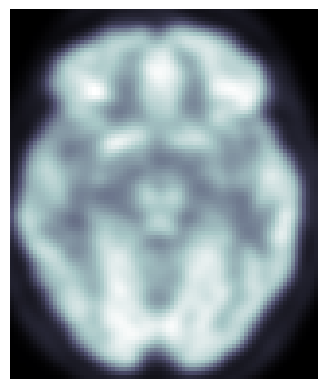

In [32]:
plt.imshow(twod_df['data'][twod_df['entropy'].idxmax()], cmap='bone')
plt.axis('off')
plt.show()
# Syntax

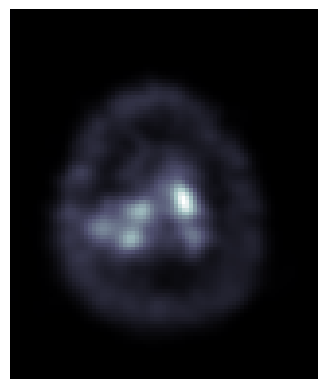

In [33]:
plt.imshow(twod_df['data'][twod_df['entropy'].idxmin()], cmap='bone')
plt.axis('off')
plt.show()
# Syntax

In [34]:
high_entropy_df = pd.DataFrame(columns = ['id','age','sex','entropy','data', 'split'])
for id in twod_df.id.unique():
  filtered_df = twod_df[twod_df.id == id].sort_values(by=['entropy'], ascending=False).head(50)
  high_entropy_df = high_entropy_df.append(filtered_df)



<ipython-input-34-c4dbd69f977b>:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  high_entropy_df = high_entropy_df.append(filtered_df)
<ipython-input-34-c4dbd69f977b>:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  high_entropy_df = high_entropy_df.append(filtered_df)
<ipython-input-34-c4dbd69f977b>:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  high_entropy_df = high_entropy_df.append(filtered_df)
<ipython-input-34-c4dbd69f977b>:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  high_entropy_df = high_entropy_df.append(filtered_df)
<ipython-input-34-c4dbd69f977b>:4: FutureWarning: The frame.append method is deprecated and will be remo

In [35]:
high_entropy_df

,id,age,sex,entropy,data,split
17,1,72,1,8.277041,"[[0.0, 5.446882482829096e-07, 3.61596175935119...",train
18,1,72,1,8.126583,"[[4.070339855388738e-06, 2.0476438749028603e-0...",train
20,1,72,1,8.058210,"[[1.7031876268447377e-05, 0.0, 9.1300666099414...",train
19,1,72,1,7.996672,"[[1.5409554180223495e-05, 9.637770972403814e-0...",train
21,1,72,1,7.990576,"[[1.791168142517563e-05, 0.0, 6.01622014073655...",train
...,...,...,...,...,...,...
6876,102,81,-1,5.191991,"[[0.001679067499935627, 0.0029688584618270397,...",train
6922,102,81,-1,5.130491,"[[0.00018155016005039215, 0.000132429748191498...",train
6923,102,81,-1,4.813114,"[[0.00047863251529634, 0.00038588137249462306,...",train
6875,102,81,-1,4.755886,"[[0.002294617472216487, 0.003809461835771799, ...",train


In [36]:
group_id = np.array(high_entropy_df[high_entropy_df.split == 'train']['id'])

In [37]:
bae_2d_X_train = np.array(high_entropy_df[high_entropy_df.split == 'train']['data'])
bae_2d_y_train = np.array(high_entropy_df[high_entropy_df.split == 'train']['age'])
bae_2d_X_test = np.array(high_entropy_df[high_entropy_df.split == 'test']['data'])
bae_2d_y_test = np.array(high_entropy_df[high_entropy_df.split == 'test']['age'])

In [38]:
bae_2d_X_train = np.array([bae_2d_X_train[i] for i in range(len(bae_2d_X_train))])
bae_2d_y_train = np.array([bae_2d_y_train[i] for i in range(len(bae_2d_y_train))])
bae_2d_X_test = np.array([bae_2d_X_test[i] for i in range(len(bae_2d_X_test))])
bae_2d_y_test = np.array([bae_2d_y_test[i] for i in range(len(bae_2d_y_test))])

In [39]:
bae_2d_z_train =  np.array(high_entropy_df[high_entropy_df.split == 'train']['sex'])
bae_2d_z_test =  np.array(high_entropy_df[high_entropy_df.split == 'test']['sex'])
bae_2d_z_train = np.array([bae_2d_z_train[i] for i in range(len(bae_2d_z_train))])
bae_2d_z_test = np.array([bae_2d_z_test[i] for i in range(len(bae_2d_z_test))])

### V1

In [ ]:
def compile_model():
  model = Sequential() # using sequential

  # Add 3D Convolutional layers with MaxPooling
  model.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(95, 79, 1)))
  model.add(MaxPooling2D(pool_size=(2, 2)))
  model.add(Conv2D(64, kernel_size=(3, 3), activation='relu', input_shape=(95, 79, 1)))
  model.add(MaxPooling2D(pool_size=(2, 2)))


  # Flatten the output and add Dense layers for age prediction
  model.add(Flatten())
  model.add(Dense(128, activation='relu'))
  model.add(Dense(1, activation='linear'))  # Use 'linear' activation for regression tasks

  # Compile the model
  model.compile(loss='mean_squared_error', optimizer='adam', metrics=[metrics.mean_absolute_error])

  return(model)

In [ ]:
def cross_validate(X, y, K = 5):
    scores = []
    histories = []
    r2 = []
    for train, test in KFold(n_splits=K, shuffle=True).split(range(102)):
        model = compile_model() # compile model
        train = [i for i,a in enumerate(group_id) if a in train+1]
        test = [i for i,a in enumerate(group_id) if a in test+1]
        histories.append(model.fit(X[train], y[train],
                                   validation_data = (X[test],y[test]), epochs=200, batch_size=16 # feed in the test data for plotting
                                   ).history)
        scores.append(model.evaluate(X[test], y[test], verbose = 0)) # evaluate the test dataset
        r2.append(r2_score(model.predict(X[test]), y[test]))
    print("average test MSE: ", np.asarray(scores)[:,0].mean())
    print("average test MAE: ", np.asarray(scores)[:,1].mean())
    print("average test r2: ", np.mean(r2))
    print(model.summary())
    return scores, histories, r2


In [ ]:
scores, histories, r2 = cross_validate(X, y, K = 5)

Epoch 1/200
102/102 [==============================] - 2s 9ms/step - loss: 219.4288 - mean_absolute_error: 9.1442 - val_loss: 32.4966 - val_mean_absolute_error: 4.2024
Epoch 2/200
102/102 [==============================] - 1s 6ms/step - loss: 29.9962 - mean_absolute_error: 4.3973 - val_loss: 35.6735 - val_mean_absolute_error: 4.3931
Epoch 3/200
102/102 [==============================] - 1s 6ms/step - loss: 25.9643 - mean_absolute_error: 4.0967 - val_loss: 28.8267 - val_mean_absolute_error: 3.9126
Epoch 4/200
102/102 [==============================] - 1s 6ms/step - loss: 24.2915 - mean_absolute_error: 3.9597 - val_loss: 30.1132 - val_mean_absolute_error: 3.9207
Epoch 5/200
102/102 [==============================] - 1s 6ms/step - loss: 22.1496 - mean_absolute_error: 3.7921 - val_loss: 32.1957 - val_mean_absolute_error: 4.0642
Epoch 6/200
102/102 [==============================] - 1s 6ms/step - loss: 29.4622 - mean_absolute_error: 4.4411 - val_loss: 38.7725 - val_mean_absolute_error: 5.20

In [ ]:
model = compile_model()

# Assuming you have your data for predictions, test_labels, and sex_train
# Create a scatter plot
model = compile_model()
for train, test in KFold(n_splits=5, shuffle=True).split(range(102)):
    train = [i for i,a in enumerate(group_id) if a in train+1]
    test = [i for i,a in enumerate(group_id) if a in test+1]
    break
history = model.fit(X[train], y[train], validation_data = (X[test],y[test]), epochs=200, batch_size=16).history
predictions = model.predict(X[test])

Epoch 1/200
102/102 [==============================] - 2s 8ms/step - loss: 320.1429 - mean_absolute_error: 10.4812 - val_loss: 48.2010 - val_mean_absolute_error: 5.5568
Epoch 2/200
102/102 [==============================] - 1s 6ms/step - loss: 28.9686 - mean_absolute_error: 4.2058 - val_loss: 45.0629 - val_mean_absolute_error: 5.3092
Epoch 3/200
102/102 [==============================] - 1s 6ms/step - loss: 24.5492 - mean_absolute_error: 3.8917 - val_loss: 35.6170 - val_mean_absolute_error: 4.7396
Epoch 4/200
102/102 [==============================] - 1s 6ms/step - loss: 20.7110 - mean_absolute_error: 3.6067 - val_loss: 41.8773 - val_mean_absolute_error: 5.1059
Epoch 5/200
102/102 [==============================] - 1s 6ms/step - loss: 18.9488 - mean_absolute_error: 3.4142 - val_loss: 37.4084 - val_mean_absolute_error: 4.8609
Epoch 6/200
102/102 [==============================] - 1s 6ms/step - loss: 15.3226 - mean_absolute_error: 3.0889 - val_loss: 35.3739 - val_mean_absolute_error: 4.5

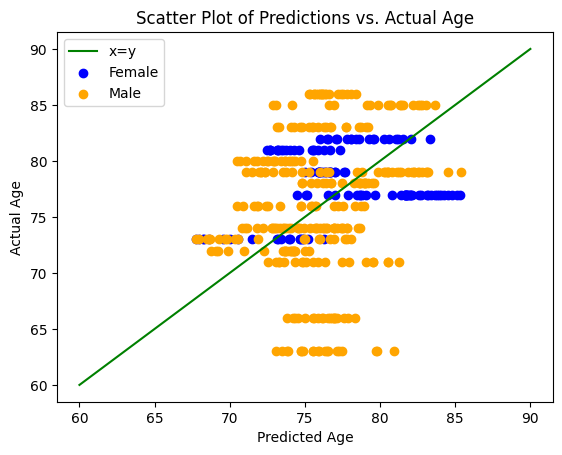

In [ ]:
color = {1:'orange',-1:'blue'}
label = {1:'Male',-1:'Female'}
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.plot([60,90], [60,90], c='green', label='x=y')

for g in [-1,1]:
    i = np.where(z[test] == g)
    print()
    plt.scatter(predictions[i], y[test][i], c=color[g], label = label[g])

# Add labels and title
plt.xlabel('Predicted Age')
plt.ylabel('Actual Age')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

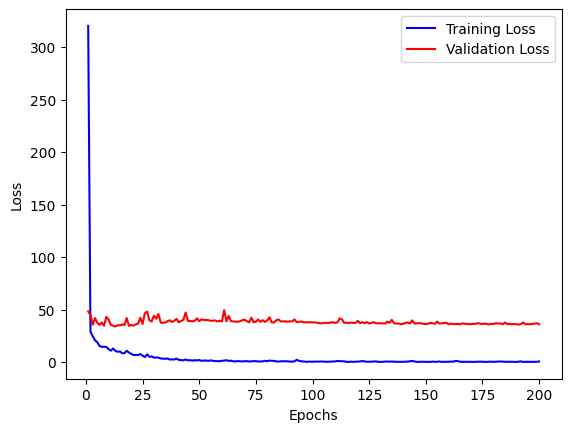

In [ ]:
# Access the loss values from the training history
train_loss = history['loss']
val_loss = history['val_loss']

# Access the number of epochs
epochs = range(1, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

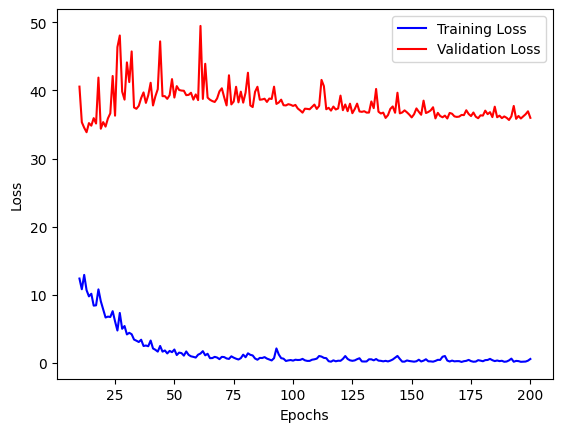

In [ ]:
epochs = range(10, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss[9:], 'b', label='Training Loss')
plt.plot(epochs, val_loss[9:], 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

### V2

In [ ]:
from sklearn import metrics
from sklearn.metrics import r2_score
from keras import metrics

def compile_model():

  # Define the input layer for the 3D Convolutional network
  input_img = Input(shape=(95, 79, 1))

  # Apply 3D Convolutional layers with MaxPooling using the Functional API
  x = Conv2D(32, kernel_size=(3, 3), activation='relu')(input_img)
  x = MaxPooling2D(pool_size=(2, 2))(x)
  x = Conv2D(64, kernel_size=(3, 3), activation='relu')(x)
  x = MaxPooling2D(pool_size=(2, 2))(x)


  # Flatten the output and add Dense layers for age prediction
  x = Flatten()(x)
  x = Dense(128, activation='relu')(x)
  output_img = Dense(32, activation='linear')(x)

  # Define the input layer for the extra feature
  input_extra = Input(shape=(1,))

  # Concatenate the output of the Convolutional network with the extra feature
  merged = concatenate([output_img, input_extra])

  # Add Dense layers for further prediction
  merged = Dense(32, activation='relu')(merged)
  merged = Dense(4, activation='relu')(merged)
  output = Dense(1, activation='linear')(merged)  # Use 'linear' activation for regression tasks

  # Define the model with both inputs and the final output
  model = Model(inputs=[input_img, input_extra], outputs=output)

  # Compile the model
  model.compile(loss='mean_squared_error', optimizer='adam', metrics=[metrics.mean_absolute_error])

  return(model)

In [ ]:
def cross_validate(X, y, z, K = 5):

    scores = []
    histories = []
    r2 = []
    for train, test in KFold(n_splits=K, shuffle=True).split(range(102)):
        model = compile_model() # compile model
        train = [i for i,a in enumerate(group_id) if a in train+1]
        test = [i for i,a in enumerate(group_id) if a in test+1]
        histories.append(model.fit([X[train], z[train]], y[train],
                                   validation_data = ([X[test], z[test]],y[test]), epochs=200, batch_size=16 # feed in the test data for plotting
                                   ).history)
        scores.append(model.evaluate([X[test], z[test]], y[test], verbose = 0)) # evaluate the test dataset
        r2.append(r2_score(model.predict([X[test], z[test]]), y[test]))
    print("average test MSE: ", np.asarray(scores)[:,0].mean())
    print("average test MAE: ", np.asarray(scores)[:,1].mean())
    print("average test r2: ", np.mean(r2))
    print(model.summary())
    return scores, histories, r2




In [ ]:
scores_v2, histories_v2, r2_v2 = cross_validate(X, y, z, K = 5)

Epoch 1/200
102/102 [==============================] - 3s 9ms/step - loss: 543.5230 - mean_absolute_error: 14.2078 - val_loss: 42.6500 - val_mean_absolute_error: 4.9227
Epoch 2/200
102/102 [==============================] - 1s 7ms/step - loss: 37.4340 - mean_absolute_error: 4.7879 - val_loss: 18.8358 - val_mean_absolute_error: 3.5484
Epoch 3/200
102/102 [==============================] - 1s 7ms/step - loss: 31.5973 - mean_absolute_error: 4.4626 - val_loss: 17.4392 - val_mean_absolute_error: 3.2654
Epoch 4/200
102/102 [==============================] - 1s 6ms/step - loss: 29.6207 - mean_absolute_error: 4.3119 - val_loss: 17.0636 - val_mean_absolute_error: 3.4784
Epoch 5/200
102/102 [==============================] - 1s 6ms/step - loss: 28.3204 - mean_absolute_error: 4.2335 - val_loss: 20.1508 - val_mean_absolute_error: 3.3040
Epoch 6/200
102/102 [==============================] - 1s 6ms/step - loss: 28.4121 - mean_absolute_error: 4.2397 - val_loss: 24.9296 - val_mean_absolute_error: 3.7

In [ ]:
scores_v2

[[28.079561233520508, 4.432161808013916],
 [33.709259033203125, 4.530690670013428],
 [30.072385787963867, 4.64683198928833],
 [31.423490524291992, 4.610693454742432],
 [3079.831298828125, 55.23661804199219]]

In [ ]:
np.mean([4.432161808013916,
4.530690670013428,
4.64683198928833,
4.610693454742432])

4.555094480514526

In [ ]:
np.mean([28.079561233520508,
33.709259033203125,
30.072385787963867,
31.423490524291992])

30.821174144744873

In [ ]:
np.mean([-0.9116567749839588,
 -2.4629745336738234,
 -0.4520105970184283,
 -1.8885788782523218])

-1.4288051959821328

In [ ]:
model = compile_model()

# Assuming you have your data for predictions, test_labels, and sex_train
# Create a scatter plot
model = compile_model()
for train, test in KFold(n_splits=6, shuffle=True).split(range(102)):
    train = [i for i,a in enumerate(group_id) if a in train+1]
    test = [i for i,a in enumerate(group_id) if a in test+1]
    break
history = model.fit([X[train],z[train]], y[train], validation_data = ([X[test], z[test]],y[test]), epochs=200, batch_size=16).history
predictions = model.predict([X[test], z[test]])

Epoch 1/200
107/107 [==============================] - 3s 8ms/step - loss: 321.2924 - mean_absolute_error: 10.7249 - val_loss: 35.9917 - val_mean_absolute_error: 5.1461
Epoch 2/200
107/107 [==============================] - 1s 6ms/step - loss: 30.8050 - mean_absolute_error: 4.3570 - val_loss: 41.9153 - val_mean_absolute_error: 5.7694
Epoch 3/200
107/107 [==============================] - 1s 6ms/step - loss: 26.2580 - mean_absolute_error: 4.0160 - val_loss: 52.8268 - val_mean_absolute_error: 6.3889
Epoch 4/200
107/107 [==============================] - 1s 6ms/step - loss: 27.6207 - mean_absolute_error: 4.1467 - val_loss: 29.0737 - val_mean_absolute_error: 4.4230
Epoch 5/200
107/107 [==============================] - 1s 6ms/step - loss: 25.5574 - mean_absolute_error: 3.9187 - val_loss: 31.1551 - val_mean_absolute_error: 4.7068
Epoch 6/200
107/107 [==============================] - 1s 6ms/step - loss: 23.6197 - mean_absolute_error: 3.8164 - val_loss: 33.8167 - val_mean_absolute_error: 4.9

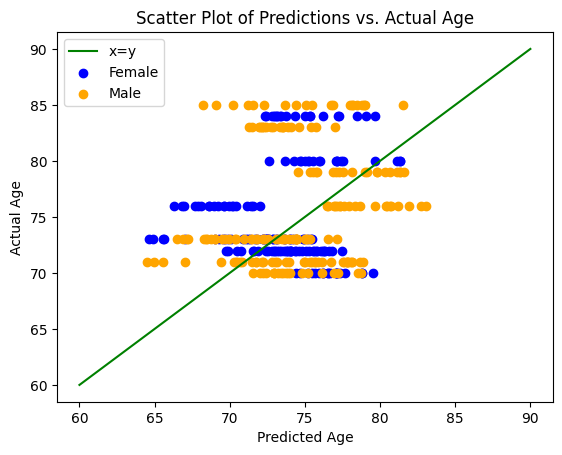

In [ ]:
color = {1:'orange',-1:'blue'}
label = {1:'Male',-1:'Female'}
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.plot([60,90], [60,90], c='green', label='x=y')

for g in [-1,1]:
    i = np.where(z[test] == g)
    print()
    plt.scatter(predictions[i], y[test][i], c=color[g], label = label[g])

# Add labels and title
plt.xlabel('Predicted Age')
plt.ylabel('Actual Age')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

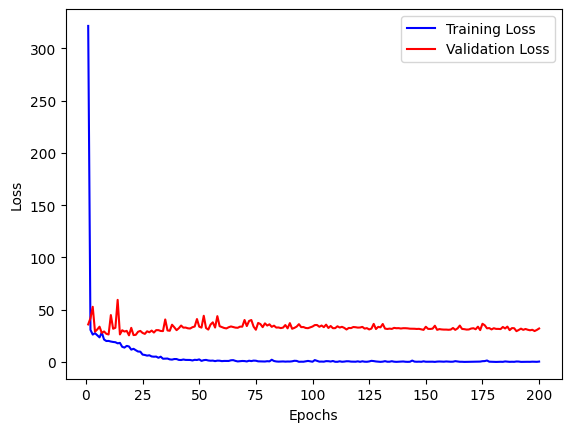

In [ ]:
# Access the loss values from the training history
train_loss = history['loss']
val_loss = history['val_loss']

# Access the number of epochs
epochs = range(1, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

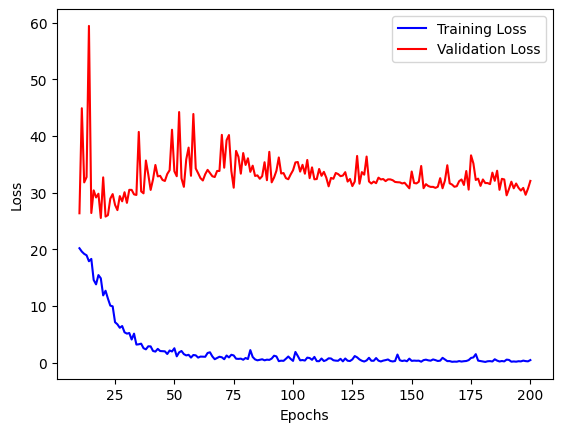

In [ ]:
epochs = range(10, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss[9:], 'b', label='Training Loss')
plt.plot(epochs, val_loss[9:], 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

### Version 1

In [ ]:
from keras.applications.vgg19 import VGG19
pretrained_model = VGG19(input_shape=(95, 79, 3), include_top=False)

In [ ]:
bae_2d_X_train_vgg = np.repeat(bae_2d_X_train[:, :, :, np.newaxis], 3, axis=3)
bae_2d_X_test_vgg = np.repeat(bae_2d_X_test[:, :, :, np.newaxis], 3, axis=3)

In [ ]:
def create_model(num_ft_layers,neurons1, neurons2):

  # Define the input layer for the 3D Convolutional network
  model = Sequential()

  for layer in pretrained_model.layers[:14]:
      model.add(layer)

  # Freeze the weights of the pre-trained layers so they are not updated during training
  for layer in model.layers:
      layer.trainable = False


  # Flatten the output of the pre-trained model
  x = Flatten()(model.output)

  additional_input = Input(shape=(1,))


  # Add Dense layers after concatenation
  x = Dense(neurons1, activation='relu')(x)
  x = Dense(neurons2, activation='relu')(x)
  x = concatenate([x, additional_input])
  # Concatenate the flattened output with the new input
  output = Dense(1, activation='linear')(x)  # Use 'linear' activation for regression tasks

  # Create the final model
  model = Model(inputs=[pretrained_model.input, additional_input], outputs=output)

  for layer in model.layers[14 - num_ft_layers:]:
            layer.trainable = True

  session = K.get_session()
  for layer in model.layers[14 - num_ft_layers:14]:
      if layer.get_weights():
        weights_shape = layer.get_weights()[0].shape
        bias_shape = layer.get_weights()[1].shape

        # Re-initialize weights and biases
        new_weights = GlorotUniform()(weights_shape).numpy()
        new_biases = GlorotUniform()(bias_shape).numpy()

        layer.set_weights([new_weights, new_biases])
  METRICS = [keras.metrics.MeanAbsoluteError(name='mae')]



  # Compile the model
  model.compile(loss='mean_squared_error', optimizer='adam', metrics=METRICS)

  return(model)


In [ ]:
import random

def objective(trial, X = bae_2d_X_train_vgg,y = bae_2d_y_train,z=bae_2d_z_train ,K = 3):
    global the_best_score
    """return the mse"""
    num_ft_layers = trial.suggest_int('num_layers', low = 0, high = 12, step = 2)
    neurons1 = trial.suggest_int('neurons1', low = 2, high = 256, step = 16)
    neurons2 = trial.suggest_int('neurons2', low = 2, high = 256, step = 16)
    batch_size = trial.suggest_int('batch_size', low = 8, high = 128, step = 16)

    callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=25, start_from_epoch=50, baseline = 100)
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, verbose=1)
    # random forest classifier object
    scores = []
    best_scores = []
    for _ in range(2):
        vals = list(set(group_id))
        random.shuffle(vals)

        # Calculate the index to split
        split_idx = int(0.8 * len(vals))

        # Split the list into 80% and 20%
        train = vals[:split_idx]
        test = vals[split_idx:]

        model = create_model(num_ft_layers = num_ft_layers,neurons1 = neurons1, neurons2 = neurons2) # compile model
        train = [i for i,a in enumerate(group_id) if a in train]
        test = [i for i,a in enumerate(group_id) if a in test]

        model = create_model(num_ft_layers = num_ft_layers, neurons1 = neurons1, neurons2 = neurons2)
        try:
          history = model.fit([X[train], z[train]], y[train],
                                    validation_data = ([X[test], z[test]],y[test]), epochs=100, batch_size=batch_size, callbacks= [callback, reduce_lr]).history
          best_scores.append(min(history['val_loss']))
        except:
          traceback.print_exc()
          return(2000)
    the_best_score.append(np.mean(best_scores))
    return(np.mean(best_scores))


the_best_score = []
# create a study (aim to maximize score)
study = optuna.create_study(sampler=TPESampler(), direction='minimize')

# perform hyperparamter tuning (while timing the process)
time_start = time.time()
study.optimize(objective, n_trials=3, gc_after_trial=True)
time_bayesian = time.time() - time_start


[I 2023-08-29 00:08:07,055] A new study created in memory with name: no-name-e4cdd700-f4d6-4aaa-b457-20bd807058c6


Epoch 1/100
58/58 [==============================] - 9s 69ms/step - loss: 679.2753 - mae: 15.0907 - val_loss: 24.6428 - val_mae: 4.2740 - lr: 0.0010
Epoch 2/100
58/58 [==============================] - 3s 50ms/step - loss: 19.3309 - mae: 3.3700 - val_loss: 100.1941 - val_mae: 8.8711 - lr: 0.0010
Epoch 3/100
58/58 [==============================] - 3s 51ms/step - loss: 15.9404 - mae: 3.0901 - val_loss: 22.3097 - val_mae: 4.0926 - lr: 0.0010
Epoch 4/100
58/58 [==============================] - 3s 51ms/step - loss: 11.2112 - mae: 2.6249 - val_loss: 43.8792 - val_mae: 5.4117 - lr: 0.0010
Epoch 5/100
58/58 [==============================] - 3s 51ms/step - loss: 10.4432 - mae: 2.5173 - val_loss: 21.7072 - val_mae: 4.0438 - lr: 0.0010
Epoch 6/100
58/58 [==============================] - 3s 51ms/step - loss: 7.6371 - mae: 2.1706 - val_loss: 21.7524 - val_mae: 3.9904 - lr: 0.0010
Epoch 7/100
58/58 [==============================] - 3s 51ms/step - loss: 7.5750 - mae: 2.1959 - val_loss: 26.4754 -

[I 2023-08-29 00:15:56,249] Trial 0 finished with value: 17.570483207702637 and parameters: {'num_layers': 0, 'neurons1': 82, 'neurons2': 82, 'batch_size': 56}. Best is trial 0 with value: 17.570483207702637.


Epoch 1/100
37/37 [==============================] - 9s 141ms/step - loss: 623.1962 - mae: 17.0576 - val_loss: 86.5147 - val_mae: 8.0886 - lr: 0.0010
Epoch 2/100
37/37 [==============================] - 3s 70ms/step - loss: 27.0194 - mae: 4.0556 - val_loss: 26.9131 - val_mae: 4.4059 - lr: 0.0010
Epoch 3/100
37/37 [==============================] - 3s 71ms/step - loss: 16.7564 - mae: 3.1697 - val_loss: 21.0461 - val_mae: 3.8644 - lr: 0.0010
Epoch 4/100
37/37 [==============================] - 3s 70ms/step - loss: 13.5855 - mae: 2.8562 - val_loss: 27.8278 - val_mae: 4.3739 - lr: 0.0010
Epoch 5/100
37/37 [==============================] - 3s 70ms/step - loss: 14.7066 - mae: 3.0187 - val_loss: 26.9595 - val_mae: 4.2727 - lr: 0.0010
Epoch 6/100
37/37 [==============================] - 3s 70ms/step - loss: 10.6788 - mae: 2.5678 - val_loss: 35.9587 - val_mae: 4.9333 - lr: 0.0010
Epoch 7/100
37/37 [==============================] - 3s 71ms/step - loss: 11.1989 - mae: 2.6782 - val_loss: 21.0809

[I 2023-08-29 00:22:56,955] Trial 1 finished with value: 16.606005668640137 and parameters: {'num_layers': 0, 'neurons1': 162, 'neurons2': 34, 'batch_size': 88}. Best is trial 1 with value: 16.606005668640137.


Epoch 1/100
45/45 [==============================] - 10s 95ms/step - loss: 13440.0225 - mae: 35.9145 - val_loss: 41.8748 - val_mae: 5.0211 - lr: 0.0010
Epoch 2/100
45/45 [==============================] - 4s 79ms/step - loss: 43.2509 - mae: 5.3264 - val_loss: 33.2120 - val_mae: 4.2955 - lr: 0.0010
Epoch 3/100
45/45 [==============================] - 4s 79ms/step - loss: 32.0634 - mae: 4.5427 - val_loss: 29.4482 - val_mae: 4.2911 - lr: 0.0010
Epoch 4/100
45/45 [==============================] - 4s 79ms/step - loss: 26.8704 - mae: 4.1518 - val_loss: 28.2807 - val_mae: 4.1966 - lr: 0.0010
Epoch 5/100
45/45 [==============================] - 4s 79ms/step - loss: 25.5173 - mae: 4.0221 - val_loss: 25.4677 - val_mae: 3.8322 - lr: 0.0010
Epoch 6/100
45/45 [==============================] - 4s 79ms/step - loss: 25.1023 - mae: 4.0216 - val_loss: 25.1339 - val_mae: 3.7223 - lr: 0.0010
Epoch 7/100
45/45 [==============================] - 4s 79ms/step - loss: 24.0102 - mae: 3.9547 - val_loss: 28.42

[I 2023-08-29 00:32:25,877] Trial 2 finished with value: 24.866841316223145 and parameters: {'num_layers': 4, 'neurons1': 146, 'neurons2': 98, 'batch_size': 72}. Best is trial 1 with value: 16.606005668640137.


In [ ]:
values = [study.trials[i].values[0] for i in range(len(study.trials))]
params = [study.trials[i].params for i in range(len(study.trials))]
columns = list(params[0].keys()) + ['val']
bayesian_results = pd.DataFrame(columns = columns)
bayesian_results['val'] = values
for param in list(params[0].keys()):
  param_list = [study[param] for study in params]
  bayesian_results[param] = param_list

In [ ]:
bayesian_results.sort_values(by=['val'])

,num_layers,neurons1,neurons2,batch_size,val
1,0,162,34,88,16.606006
0,0,82,82,56,17.570483
2,4,146,98,72,24.866841


In [ ]:
optuna.visualization.plot_param_importances(study)

In [ ]:
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, start_from_epoch=10, baseline = 50)
from keras.callbacks import ReduceLROnPlateau
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, verbose=1)
model = create_model(0,162,34)
history = model.fit([bae_2d_X_train_vgg, bae_2d_z_train], bae_2d_y_train, validation_data= ([bae_2d_X_test_vgg, bae_2d_z_test], bae_2d_y_test), epochs = 100, batch_size = 88, callbacks = [callback, reduce_lr]).history

Epoch 1/100
47/47 [==============================] - 7s 129ms/step - loss: 271.6669 - mae: 10.0603 - val_loss: 23.9190 - val_mae: 4.0147 - lr: 0.0010
Epoch 2/100
47/47 [==============================] - 3s 71ms/step - loss: 17.1330 - mae: 3.2559 - val_loss: 27.6586 - val_mae: 4.3053 - lr: 0.0010
Epoch 3/100
47/47 [==============================] - 3s 71ms/step - loss: 14.5209 - mae: 2.9713 - val_loss: 29.8749 - val_mae: 4.5100 - lr: 0.0010
Epoch 4/100
47/47 [==============================] - 3s 71ms/step - loss: 14.4703 - mae: 2.9607 - val_loss: 34.8037 - val_mae: 4.8785 - lr: 0.0010
Epoch 5/100
47/47 [==============================] - 3s 72ms/step - loss: 13.0568 - mae: 2.7837 - val_loss: 33.0084 - val_mae: 4.7711 - lr: 0.0010
Epoch 6/100
47/47 [==============================] - 3s 72ms/step - loss: 11.7547 - mae: 2.6202 - val_loss: 30.4852 - val_mae: 4.5393 - lr: 0.0010
Epoch 7/100
47/47 [==============================] - 3s 72ms/step - loss: 11.0490 - mae: 2.5222 - val_loss: 34.4254

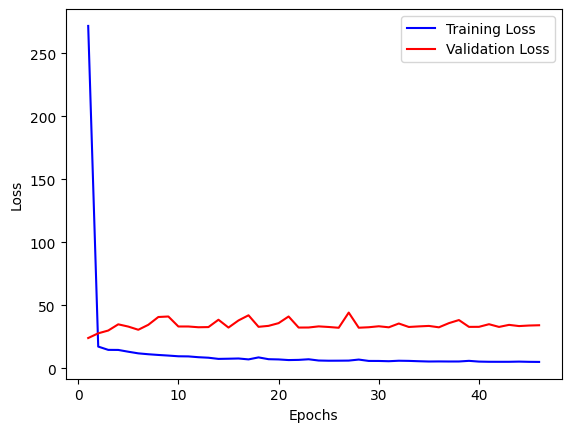

In [ ]:
# Access the loss values from the training history
train_loss = history['loss']
val_loss = history['val_loss']

# Access the number of epochs
epochs = range(1, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

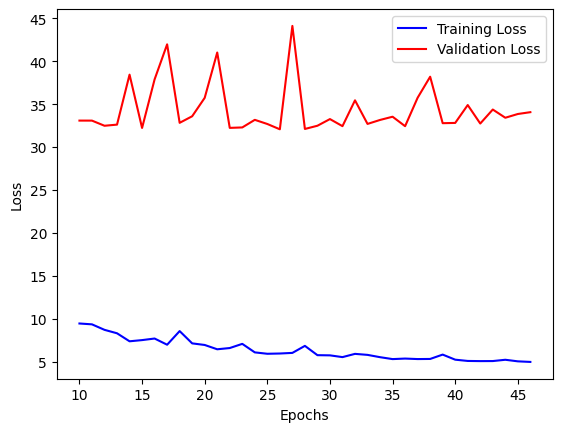

In [ ]:
epochs = range(10, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss[9:], 'b', label='Training Loss')
plt.plot(epochs, val_loss[9:], 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
predictions = model.predict([bae_2d_X_test_vgg, bae_2d_z_test])

33/33 [==============================] - 2s 44ms/step


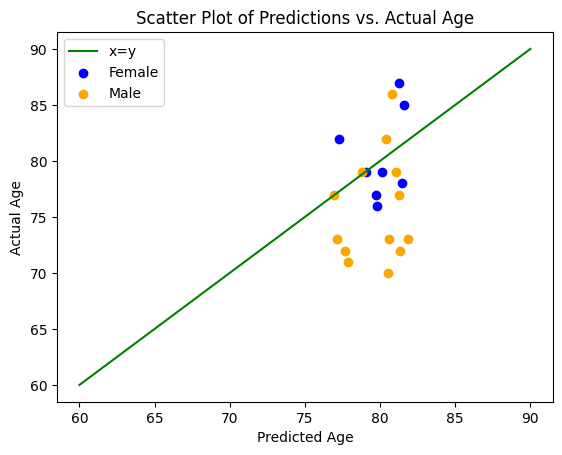

In [ ]:
color = {1:'orange',-1:'blue'}
label = {1:'Male',-1:'Female'}
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.plot([60,90], [60,90], c='green', label='x=y')

for g in [-1,1]:
    i = np.where(bae_3d_sexes_test == g)
    plt.scatter(predictions[i], bae_3d_ages_test[i], c=color[g], label = label[g])

# Add labels and title
plt.xlabel('Predicted Age')
plt.ylabel('Actual Age')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

In [ ]:
import numpy as np
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, confusion_matrix
from scipy.stats import pearsonr

def evaluate_predictions(predictions, true_values):
    # Calculate R^2
    r2 = r2_score(true_values, predictions)

    # Calculate MSE
    mse = mean_squared_error(true_values, predictions)

    # Calculate RMSE
    rmse = np.sqrt(mse)

    # Calculate MAE
    mae = mean_absolute_error(true_values, predictions)

    # Calculate Pearson's correlation coefficient
    r, _ = pearsonr(true_values, predictions)



    return r2, rmse, mse, mae, r

# Sample data
# (You'll need to define 'predictions' and 'bae_3d_ages_test' before calling the function)

r2, rmse, mse, mae, pearson_r = evaluate_predictions([float(i) for i in predictions], bae_2d_y_test)
print(f"R^2: {r2}")
print(f"RMSE: {rmse}")
print(f"MSE: {mse}")
print(f"MAE: {mae}")
print(f"Pearson's r: {pearson_r}")


R^2: -0.4561333099198914
RMSE: 5.836291033482979
MSE: 34.062293027513824
MAE: 4.842763359433128
Pearson's r: 0.06266979637223338


### Version 2

In [ ]:
from keras.applications.vgg16 import VGG16
pretrained_model = VGG16(input_shape=(95, 79, 3), include_top=False)

58889256/58889256 [==============================] - 3s 0us/step


In [ ]:
bae_2d_X_train_vgg = np.repeat(bae_2d_X_train[:, :, :, np.newaxis], 3, axis=3)
bae_2d_X_test_vgg = np.repeat(bae_2d_X_test[:, :, :, np.newaxis], 3, axis=3)

In [ ]:
from keras.layers import Dropout, BatchNormalization

def create_model(num_ft_layers,neurons1, neurons2):

  # Define the input layer for the 3D Convolutional network
  model = Sequential()

  for layer in pretrained_model.layers[:11]:
      model.add(layer)

  # Freeze the weights of the pre-trained layers so they are not updated during training
  for layer in model.layers:
      layer.trainable = False


  # Flatten the output of the pre-trained model
  x = Flatten()(model.output)

  additional_input = Input(shape=(1,))


  # Add Dense layers after concatenation
  x = Dense(neurons1, activation='relu')(x)

  x = Dense(neurons2, activation='relu')(x)

  x = concatenate([x, additional_input])
  # Concatenate the flattened output with the new input
  output = Dense(1, activation='linear')(x)  # Use 'linear' activation for regression tasks

  # Create the final model
  model = Model(inputs=[pretrained_model.input, additional_input], outputs=output)

  for layer in model.layers[11 - num_ft_layers:]:
            layer.trainable = True

  session = K.get_session()
  for layer in model.layers[11 - num_ft_layers:11]:
      if layer.get_weights():
        weights_shape = layer.get_weights()[0].shape
        bias_shape = layer.get_weights()[1].shape

        # Re-initialize weights and biases
        new_weights = GlorotUniform()(weights_shape).numpy()
        new_biases = GlorotUniform()(bias_shape).numpy()

        layer.set_weights([new_weights, new_biases])
  METRICS = [keras.metrics.MeanAbsoluteError(name='mae')]



  # Compile the model
  model.compile(loss='mean_squared_error', optimizer='adam', metrics=METRICS)

  return(model)


In [ ]:
def objective(trial, X = bae_2d_X_train_vgg,y = bae_2d_y_train,z=bae_2d_z_train ,K = 3):
    global the_best_score
    """return the mse"""
    num_ft_layers = trial.suggest_int('num_layers', low = 0, high = 12, step = 2)
    neurons1 = trial.suggest_int('neurons1', low = 2, high = 256, step = 16)
    neurons2 = trial.suggest_int('neurons2', low = 2, high = 256, step = 16)
    batch_size = trial.suggest_int('batch_size', low = 8, high = 128, step = 16)

    callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=25, start_from_epoch=50, baseline = 100)
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, verbose=1)
    # random forest classifier object
    scores = []
    best_scores = []
    for train, test in KFold(n_splits=K, shuffle=True).split(range(81)):
        model = create_model(num_ft_layers = num_ft_layers,neurons1 = neurons1, neurons2 = neurons2) # compile model
        train = [i for i,a in enumerate(group_id) if a in train+1]
        test = [i for i,a in enumerate(group_id) if a in test+1]

        model = compile_model(num_ft_layers = num_ft_layers, neurons1 = neurons1, neurons2 = neurons2)
        try:
          history = model.fit([X[train], z[train]], y[train],
                                    validation_data = ([X[test], z[test]],y[test]), epochs=100, batch_size=batch_size, callbacks= [callback, reduce_lr]).history
          best_scores.append(min(history['val_loss']))
        except:
          traceback.print_exc()
          return(2000)
    the_best_score.append(np.mean(best_scores))
    return(np.mean(best_scores))


the_best_score = []
# create a study (aim to maximize score)
study = optuna.create_study(sampler=TPESampler(), direction='minimize')

# perform hyperparamter tuning (while timing the process)
time_start = time.time()
study.optimize(objective, n_trials=3, gc_after_trial=True)
time_bayesian = time.time() - time_start


[I 2023-08-28 19:38:05,485] A new study created in memory with name: no-name-f165b52e-f128-41a1-b832-ab2d52701ce1
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [2, 256] and step=16, but the range is not divisible by `step`. It will be replaced by [2, 242].

/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning:

The distribution is specified by [8, 128] and step=16, but the range is not divisible by `step`. It will be replaced by [8, 120].



Epoch 1/100
113/113 [==============================] - 6s 40ms/step - loss: 590.8915 - mae: 14.4944 - val_loss: 48.8477 - val_mae: 5.7207 - lr: 0.0010
Epoch 2/100
113/113 [==============================] - 4s 35ms/step - loss: 32.4456 - mae: 4.5598 - val_loss: 39.9918 - val_mae: 5.2149 - lr: 0.0010
Epoch 3/100
113/113 [==============================] - 4s 35ms/step - loss: 25.1114 - mae: 3.9939 - val_loss: 32.8901 - val_mae: 4.6863 - lr: 0.0010
Epoch 4/100
113/113 [==============================] - 4s 35ms/step - loss: 20.7365 - mae: 3.6076 - val_loss: 31.0252 - val_mae: 4.5908 - lr: 0.0010
Epoch 5/100
113/113 [==============================] - 4s 35ms/step - loss: 17.7348 - mae: 3.3406 - val_loss: 27.7886 - val_mae: 4.2711 - lr: 0.0010
Epoch 6/100
113/113 [==============================] - 4s 35ms/step - loss: 15.8530 - mae: 3.1555 - val_loss: 27.2764 - val_mae: 4.1442 - lr: 0.0010
Epoch 7/100
113/113 [==============================] - 4s 36ms/step - loss: 14.5913 - mae: 3.0164 - val_

[I 2023-08-28 19:54:06,940] Trial 0 finished with value: 23.81220277150472 and parameters: {'num_layers': 0, 'neurons1': 178, 'neurons2': 98, 'batch_size': 24}. Best is trial 0 with value: 23.81220277150472.


Epoch 1/100
23/23 [==============================] - 9s 216ms/step - loss: 4782.7588 - mae: 68.8326 - val_loss: 3318.4070 - val_mae: 57.4394 - lr: 0.0010
Epoch 2/100
23/23 [==============================] - 3s 126ms/step - loss: 2453.5847 - mae: 48.5679 - val_loss: 1011.7357 - val_mae: 31.0400 - lr: 0.0010
Epoch 3/100
23/23 [==============================] - 3s 126ms/step - loss: 527.1057 - mae: 19.9690 - val_loss: 110.8657 - val_mae: 8.6008 - lr: 0.0010
Epoch 4/100
23/23 [==============================] - 3s 126ms/step - loss: 124.1289 - mae: 9.1246 - val_loss: 140.2859 - val_mae: 10.0071 - lr: 0.0010
Epoch 5/100
23/23 [==============================] - 3s 126ms/step - loss: 114.1220 - mae: 8.7032 - val_loss: 106.9273 - val_mae: 8.5856 - lr: 0.0010
Epoch 6/100
23/23 [==============================] - 3s 127ms/step - loss: 107.9249 - mae: 8.3389 - val_loss: 104.5505 - val_mae: 8.5047 - lr: 0.0010
Epoch 7/100
23/23 [==============================] - 3s 127ms/step - loss: 103.2279 - mae:

[I 2023-08-28 20:08:35,840] Trial 1 finished with value: 112.31176948547363 and parameters: {'num_layers': 4, 'neurons1': 2, 'neurons2': 18, 'batch_size': 120}. Best is trial 0 with value: 23.81220277150472.


Epoch 1/100
23/23 [==============================] - 6s 162ms/step - loss: 665.1454 - mae: 18.3905 - val_loss: 31.7051 - val_mae: 4.5655 - lr: 0.0010
Epoch 2/100
23/23 [==============================] - 3s 133ms/step - loss: 44.5579 - mae: 5.2793 - val_loss: 27.4563 - val_mae: 4.3917 - lr: 0.0010
Epoch 3/100
23/23 [==============================] - 3s 133ms/step - loss: 31.7607 - mae: 4.4635 - val_loss: 17.7655 - val_mae: 3.3715 - lr: 0.0010
Epoch 4/100
23/23 [==============================] - 3s 134ms/step - loss: 30.1750 - mae: 4.3397 - val_loss: 16.5039 - val_mae: 3.2654 - lr: 0.0010
Epoch 5/100
23/23 [==============================] - 3s 134ms/step - loss: 27.9228 - mae: 4.1645 - val_loss: 17.6607 - val_mae: 3.4548 - lr: 0.0010
Epoch 6/100
23/23 [==============================] - 3s 134ms/step - loss: 27.4245 - mae: 4.1351 - val_loss: 22.3186 - val_mae: 3.7248 - lr: 0.0010
Epoch 7/100
23/23 [==============================] - 3s 135ms/step - loss: 24.9509 - mae: 3.9204 - val_loss: 2

[I 2023-08-28 20:20:50,066] Trial 2 finished with value: 23.546820322672527 and parameters: {'num_layers': 6, 'neurons1': 162, 'neurons2': 82, 'batch_size': 120}. Best is trial 2 with value: 23.546820322672527.


In [ ]:
values = [study.trials[i].values[0] for i in range(len(study.trials))]
params = [study.trials[i].params for i in range(len(study.trials))]
columns = list(params[0].keys()) + ['val']
bayesian_results = pd.DataFrame(columns = columns)
bayesian_results['val'] = values
for param in list(params[0].keys()):
  param_list = [study[param] for study in params]
  bayesian_results[param] = param_list

In [ ]:
bayesian_results.sort_values(by=['val'])

,num_layers,neurons1,neurons2,batch_size,val
2,6,162,82,120,23.546820
0,0,178,98,24,23.812203
1,4,2,18,120,112.311769


In [ ]:
optuna.visualization.plot_param_importances(study)

In [ ]:
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, start_from_epoch=10, baseline = 50)
from keras.callbacks import ReduceLROnPlateau
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, verbose=1)
model = create_model(8,162,82)
history = model.fit([bae_2d_X_train_vgg, bae_2d_z_train], bae_2d_y_train, validation_data= ([bae_2d_X_test_vgg, bae_2d_z_test], bae_2d_y_test), epochs = 100, batch_size = 40, callbacks = [callback, reduce_lr]).history

Epoch 1/100
102/102 [==============================] - 8s 53ms/step - loss: 1159.5509 - mae: 19.2852 - val_loss: 36.1700 - val_mae: 5.0066 - lr: 0.0010
Epoch 2/100
102/102 [==============================] - 5s 49ms/step - loss: 29.0800 - mae: 4.3233 - val_loss: 52.4370 - val_mae: 5.7724 - lr: 0.0010
Epoch 3/100
102/102 [==============================] - 5s 49ms/step - loss: 27.7376 - mae: 4.1913 - val_loss: 27.8791 - val_mae: 4.3514 - lr: 0.0010
Epoch 4/100
102/102 [==============================] - 5s 49ms/step - loss: 32.2689 - mae: 4.5231 - val_loss: 42.9126 - val_mae: 5.3293 - lr: 0.0010
Epoch 5/100
102/102 [==============================] - 5s 50ms/step - loss: 27.3323 - mae: 4.1916 - val_loss: 49.4704 - val_mae: 5.5714 - lr: 0.0010
Epoch 6/100
102/102 [==============================] - 5s 50ms/step - loss: 27.5609 - mae: 4.1792 - val_loss: 39.6349 - val_mae: 5.1369 - lr: 0.0010
Epoch 7/100
102/102 [==============================] - 5s 50ms/step - loss: 24.5380 - mae: 3.9525 - val

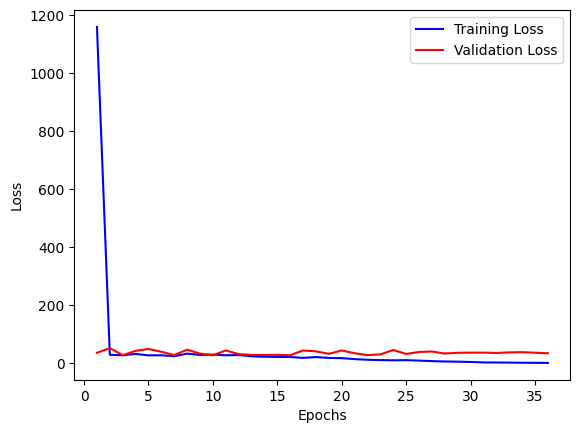

In [ ]:
# Access the loss values from the training history
train_loss = history['loss']
val_loss = history['val_loss']

# Access the number of epochs
epochs = range(1, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

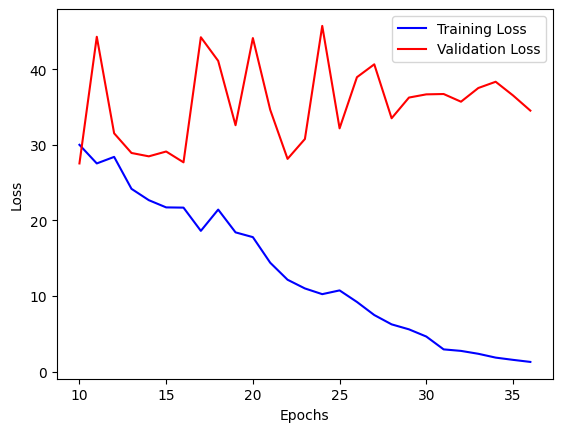

In [ ]:
epochs = range(10, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss[9:], 'b', label='Training Loss')
plt.plot(epochs, val_loss[9:], 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
predictions = model.predict([bae_2d_X_test_vgg, bae_2d_z_test])

33/33 [==============================] - 1s 24ms/step


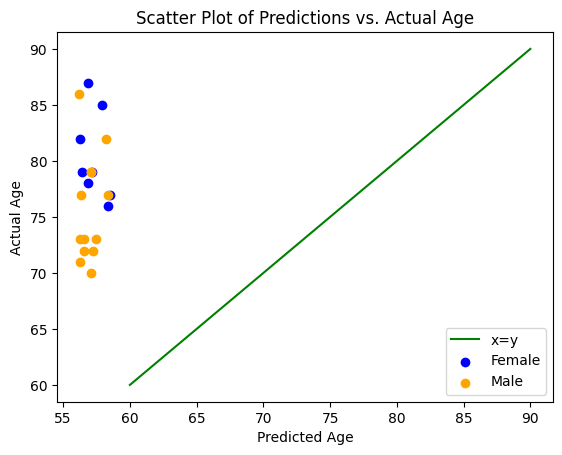

In [ ]:
color = {1:'orange',-1:'blue'}
label = {1:'Male',-1:'Female'}
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.plot([60,90], [60,90], c='green', label='x=y')

for g in [-1,1]:
    i = np.where(bae_3d_sexes_test == g)
    plt.scatter(predictions[i], bae_3d_ages_test[i], c=color[g], label = label[g])

# Add labels and title
plt.xlabel('Predicted Age')
plt.ylabel('Actual Age')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

In [ ]:
import numpy as np
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, confusion_matrix
from scipy.stats import pearsonr

def evaluate_predictions(predictions, true_values):
    # Calculate R^2
    r2 = r2_score(true_values, predictions)

    # Calculate MSE
    mse = mean_squared_error(true_values, predictions)

    # Calculate RMSE
    rmse = np.sqrt(mse)

    # Calculate MAE
    mae = mean_absolute_error(true_values, predictions)

    # Calculate Pearson's correlation coefficient
    r, _ = pearsonr(true_values, predictions)



    return r2, rmse, mse, mae, r

# Sample data
# (You'll need to define 'predictions' and 'bae_3d_ages_test' before calling the function)

r2, rmse, mse, mae, pearson_r = evaluate_predictions([float(i) for i in predictions], bae_2d_y_test)
print(f"R^2: {r2}")
print(f"RMSE: {rmse}")
print(f"MSE: {mse}")
print(f"MAE: {mae}")
print(f"Pearson's r: {pearson_r}")


R^2: -0.2890243804567083
RMSE: 5.491195903101528
MSE: 30.15323244623901
MAE: 4.658810112362816
Pearson's r: -0.07355484664467223


### Version 2?

In [ ]:
from keras.applications.vgg16 import VGG16
pretrained_model = VGG16(input_shape=(95, 79, 3), include_top=False)

In [ ]:
bae_2d_X_train_vgg = np.repeat(bae_2d_X_train[:, :, :, np.newaxis], 3, axis=3)
bae_2d_X_test_vgg = np.repeat(bae_2d_X_test[:, :, :, np.newaxis], 3, axis=3)

In [ ]:
def compile_model():

  # Define the input layer for the 3D Convolutional network
  model = Sequential()

  for layer in pretrained_model.layers:
      model.add(layer)

  # Freeze the weights of the pre-trained layers so they are not updated during training
  for layer in model.layers:
      layer.trainable = False


  # Flatten the output of the pre-trained model
  x = Flatten()(model.output)

  additional_input = Input(shape=(1,))


  # Add Dense layers after concatenation
  x = Dense(256, activation='relu')(x)

  x = concatenate([x, additional_input])

  x = Dense(64, activation='relu')(x)

  # Concatenate the flattened output with the new input
  output = Dense(1, activation='linear')(x)  # Use 'linear' activation for regression tasks

  # Create the final model
  model = Model(inputs=[pretrained_model.input, additional_input], outputs=output)

  for layer in model.layers[16:]:
            layer.trainable = True

  METRICS = [keras.metrics.MeanAbsoluteError(name='mae')]

  # Compile the model
  model.compile(loss='mean_squared_error', optimizer='adam', metrics=METRICS)

  return(model)

In [ ]:
model = compile_model()
history = model.fit([bae_2d_X_train_vgg, bae_2d_z_train], bae_2d_y_train, validation_data= ([bae_2d_X_test_vgg, bae_2d_z_test], bae_2d_y_test), epochs = 100, batch_size = 16).history

Epoch 1/100
254/254 [==============================] - 8s 25ms/step - loss: 135.9900 - mae: 6.5451 - val_loss: 34.4217 - val_mae: 4.7392
Epoch 2/100
254/254 [==============================] - 6s 24ms/step - loss: 22.3318 - mae: 3.7618 - val_loss: 31.3110 - val_mae: 4.5890
Epoch 3/100
254/254 [==============================] - 6s 24ms/step - loss: 19.5357 - mae: 3.5196 - val_loss: 29.0529 - val_mae: 4.5122
Epoch 4/100
254/254 [==============================] - 6s 24ms/step - loss: 18.2146 - mae: 3.3944 - val_loss: 26.5953 - val_mae: 4.3555
Epoch 5/100
254/254 [==============================] - 6s 24ms/step - loss: 15.5860 - mae: 3.1205 - val_loss: 30.9609 - val_mae: 4.5133
Epoch 6/100
254/254 [==============================] - 6s 24ms/step - loss: 15.2326 - mae: 3.1149 - val_loss: 36.7314 - val_mae: 5.0056
Epoch 7/100
254/254 [==============================] - 6s 24ms/step - loss: 11.4823 - mae: 2.7142 - val_loss: 42.4985 - val_mae: 5.1826
Epoch 8/100
254/254 [==========================

In [ ]:
predictions = model.predict([bae_2d_X_test_vgg, bae_2d_z_test])

33/33 [==============================] - 1s 24ms/step


In [ ]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

def evaluate_predictions(predictions, true_values):
    # Calculate R^2
    r2 = r2_score(true_values, predictions)

    # Calculate MSE
    mse = mean_squared_error(true_values, predictions)

    # Calculate RMSE
    rmse = np.sqrt(mse)

    # Calculate MAE
    mae = mean_absolute_error(true_values, predictions)

    return r2, rmse, mse, mae

# Sample data


r2, rmse, mse, mae = evaluate_predictions(predictions, bae_2d_y_test)
print(f"R^2: {r2}")
print(f"RMSE: {rmse}")
print(f"MSE: {mse}")
print(f"MAE: {mae}")

R^2: -0.27493310312543384
RMSE: 5.461099266349274
MSE: 29.823605196920578
MAE: 4.683057643345424


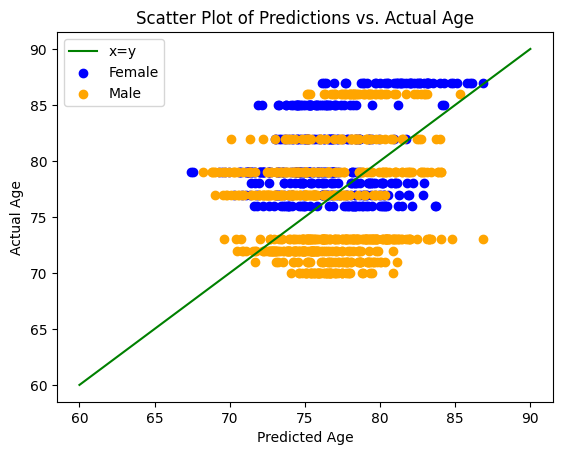

In [ ]:
color = {1:'orange',-1:'blue'}
label = {1:'Male',-1:'Female'}
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.plot([60,90], [60,90], c='green', label='x=y')

for g in [-1,1]:
    i = np.where(bae_2d_z_test == g)
    plt.scatter(predictions[i], bae_2d_y_test[i], c=color[g], label = label[g])

# Add labels and title
plt.xlabel('Predicted Age')
plt.ylabel('Actual Age')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

### Version 5

In [ ]:
from keras.applications.vgg19 import VGG19
pretrained_model = VGG19(input_shape=(95, 79, 3), include_top=False)

bae_2d_X_train_vgg = np.repeat(bae_2d_X_train[:, :, :, np.newaxis], 3, axis=3)
bae_2d_X_test_vgg = np.repeat(bae_2d_X_test[:, :, :, np.newaxis], 3, axis=3)

def compile_model():

  # Define the input layer for the 3D Convolutional network
  model = Sequential()

  for layer in pretrained_model.layers:
      model.add(layer)

  # Freeze the weights of the pre-trained layers so they are not updated during training
  for layer in model.layers:
      layer.trainable = False


  # Flatten the output of the pre-trained model
  x = Flatten()(model.output)

  additional_input = Input(shape=(1,))


  # Add Dense layers after concatenation
  x = Dense(256, activation='relu')(x)

  x = concatenate([x, additional_input])

  x = Dense(64, activation='relu')(x)

  # Concatenate the flattened output with the new input
  output = Dense(1, activation='linear')(x)  # Use 'linear' activation for regression tasks

  # Create the final model
  model = Model(inputs=[pretrained_model.input, additional_input], outputs=output)

  for layer in model.layers[22:]:
            layer.trainable = True

  METRICS = [keras.metrics.MeanAbsoluteError(name='mae')]

  # Compile the model
  model.compile(loss='mean_squared_error', optimizer='adam', metrics=METRICS)

  return(model)

model = compile_model()
history = model.fit([bae_2d_X_train_vgg, bae_2d_z_train], bae_2d_y_train, validation_data= ([bae_2d_X_test_vgg, bae_2d_z_test], bae_2d_y_test), epochs = 200, batch_size = 16).history
print(model.evaluate([bae_2d_X_test_vgg, bae_2d_z_test], bae_2d_y_test))

Epoch 1/200
102/102 [==============================] - 4s 28ms/step - loss: 566.7046 - mae: 14.5024 - val_loss: 45.0534 - val_mae: 5.2563
Epoch 2/200
102/102 [==============================] - 2s 24ms/step - loss: 31.7853 - mae: 4.6137 - val_loss: 33.9440 - val_mae: 4.6389
Epoch 3/200
102/102 [==============================] - 2s 24ms/step - loss: 25.8300 - mae: 4.0724 - val_loss: 33.5161 - val_mae: 4.7029
Epoch 4/200
102/102 [==============================] - 2s 24ms/step - loss: 20.9307 - mae: 3.6466 - val_loss: 33.2399 - val_mae: 4.7518
Epoch 5/200
102/102 [==============================] - 2s 24ms/step - loss: 18.7993 - mae: 3.4314 - val_loss: 31.1054 - val_mae: 4.6765
Epoch 6/200
102/102 [==============================] - 2s 24ms/step - loss: 18.1776 - mae: 3.3539 - val_loss: 29.1949 - val_mae: 4.5146
Epoch 7/200
102/102 [==============================] - 2s 24ms/step - loss: 16.5291 - mae: 3.1994 - val_loss: 29.6894 - val_mae: 4.5922
Epoch 8/200
102/102 [=========================

### Version 3

In [ ]:
from keras.applications.vgg19 import VGG19
pretrained_model = VGG19(input_shape=(95, 79, 3), include_top=False)

In [ ]:
bae_2d_X_train_ = np.array(twod_df[twod_df.split == 'train']['data'])
bae_2d_y_train_ = np.array(twod_df[twod_df.split == 'train']['age'])
bae_2d_X_test_ = np.array(twod_df[twod_df.split == 'test']['data'])
bae_2d_y_test_ = np.array(twod_df[twod_df.split == 'test']['age'])

In [ ]:
bae_2d_X_train_ = np.array([bae_2d_X_train_[i] for i in range(len(bae_2d_X_train_))])
bae_2d_y_train_ = np.array([bae_2d_y_train_[i] for i in range(len(bae_2d_y_train_))])
bae_2d_X_test_ = np.array([bae_2d_X_test_[i] for i in range(len(bae_2d_X_test_))])
bae_2d_y_test_ = np.array([bae_2d_y_test_[i] for i in range(len(bae_2d_y_test_))])

In [ ]:
bae_2d_z_train_ =  np.array(twod_df[twod_df.split == 'train']['sex'])
bae_2d_z_test_ =  np.array(twod_df[twod_df.split == 'test']['sex'])
bae_2d_z_train_ = np.array([bae_2d_z_train_[i] for i in range(len(bae_2d_z_train_))])
bae_2d_z_test_ = np.array([bae_2d_z_test_[i] for i in range(len(bae_2d_z_test_))])

In [65]:
from keras.applications.vgg19 import VGG19
pretrained_model = VGG19(input_shape=(95, 79, 3), include_top=False)

80134624/80134624 [==============================] - 0s 0us/step


In [ ]:
bae_2d_X_train_vgg_ = np.repeat(bae_2d_X_train_[:, :, :, np.newaxis], 3, axis=3)
bae_2d_X_test_vgg_ = np.repeat(bae_2d_X_test_[:, :, :, np.newaxis], 3, axis=3)

In [ ]:
group_id_ = np.array(twod_df[twod_df.split == 'train']['id'])

In [66]:
def create_model(num_ft_layers,neurons1, neurons2):

  # Define the input layer for the 3D Convolutional network
  model = Sequential()

  for layer in pretrained_model.layers[:14]:
      model.add(layer)

  # Freeze the weights of the pre-trained layers so they are not updated during training
  for layer in model.layers:
      layer.trainable = False


  # Flatten the output of the pre-trained model
  x = Flatten()(model.output)

  additional_input = Input(shape=(1,))


  # Add Dense layers after concatenation
  x = Dense(neurons1, activation='relu')(x)
  x = Dense(neurons2, activation='relu')(x)
  x = concatenate([x, additional_input])
  # Concatenate the flattened output with the new input
  output = Dense(1, activation='linear')(x)  # Use 'linear' activation for regression tasks

  # Create the final model
  model = Model(inputs=[pretrained_model.input, additional_input], outputs=output)

  for layer in model.layers[14 - num_ft_layers:]:
            layer.trainable = True

  session = K.get_session()
  for layer in model.layers[14 - num_ft_layers:14]:
      if layer.get_weights():
        weights_shape = layer.get_weights()[0].shape
        bias_shape = layer.get_weights()[1].shape

        # Re-initialize weights and biases
        new_weights = GlorotUniform()(weights_shape).numpy()
        new_biases = GlorotUniform()(bias_shape).numpy()

        layer.set_weights([new_weights, new_biases])
  METRICS = [keras.metrics.MeanAbsoluteError(name='mae')]



  # Compile the model
  model.compile(loss='mean_squared_error', optimizer='adam', metrics=METRICS)

  return(model)


In [ ]:
def objective(trial, X = bae_2d_X_train_vgg_,y = bae_2d_y_train_,z=bae_2d_z_train_ ,K = 3):
    global the_best_score
    """return the mse"""
    num_ft_layers = trial.suggest_int('num_layers', low = 0, high = 12, step = 2)
    neurons1 = trial.suggest_int('neurons1', low = 2, high = 256, step = 16)
    neurons2 = trial.suggest_int('neurons2', low = 2, high = 256, step = 16)
    batch_size = trial.suggest_int('batch_size', low = 8, high = 128, step = 16)

    callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=25, start_from_epoch=50, baseline = 100)
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, verbose=1)
    # random forest classifier object
    scores = []
    best_scores = []
    for _ in range(2):
        vals = list(set(group_id_))
        random.shuffle(vals)

        # Calculate the index to split
        split_idx = int(0.8 * len(vals))

        # Split the list into 80% and 20%
        train = vals[:split_idx]
        test = vals[split_idx:]

        model = create_model(num_ft_layers = num_ft_layers,neurons1 = neurons1, neurons2 = neurons2) # compile model
        train = [i for i,a in enumerate(group_id) if a in train]
        test = [i for i,a in enumerate(group_id) if a in test]


        model = create_model(num_ft_layers = num_ft_layers, neurons1 = neurons1, neurons2 = neurons2)
        try:
          history = model.fit([X[train], z[train]], y[train],
                                    validation_data = ([X[test], z[test]],y[test]), epochs=100, batch_size=batch_size, callbacks= [callback, reduce_lr]).history
          best_scores.append(min(history['val_loss']))
        except:
          traceback.print_exc()
          return(2000)
    the_best_score.append(np.mean(best_scores))
    return(np.mean(best_scores))


the_best_score = []
# create a study (aim to maximize score)
study = optuna.create_study(sampler=TPESampler(), direction='minimize')

# perform hyperparamter tuning (while timing the process)
time_start = time.time()
study.optimize(objective, n_trials=3, gc_after_trial=True)
time_bayesian = time.time() - time_start


[I 2023-08-29 00:50:06,660] A new study created in memory with name: no-name-1cd2b062-8208-470f-a0af-dcd97301cb84


Epoch 1/100
31/31 [==============================] - 14s 254ms/step - loss: 62518.9805 - mae: 68.6698 - val_loss: 200.9536 - val_mae: 11.7279 - lr: 0.0010
Epoch 2/100
31/31 [==============================] - 4s 135ms/step - loss: 79.7401 - mae: 7.1462 - val_loss: 30.3036 - val_mae: 4.4329 - lr: 0.0010
Epoch 3/100
31/31 [==============================] - 4s 136ms/step - loss: 33.3759 - mae: 4.6024 - val_loss: 45.5266 - val_mae: 5.2760 - lr: 0.0010
Epoch 4/100
31/31 [==============================] - 4s 137ms/step - loss: 30.6031 - mae: 4.4006 - val_loss: 30.8973 - val_mae: 4.3488 - lr: 0.0010
Epoch 5/100
31/31 [==============================] - 4s 137ms/step - loss: 28.5976 - mae: 4.2643 - val_loss: 28.1958 - val_mae: 4.1654 - lr: 0.0010
Epoch 6/100
31/31 [==============================] - 4s 137ms/step - loss: 27.0038 - mae: 4.1448 - val_loss: 36.4122 - val_mae: 4.6946 - lr: 0.0010
Epoch 7/100
31/31 [==============================] - 4s 139ms/step - loss: 27.1351 - mae: 4.1306 - val_lo

[I 2023-08-29 01:01:55,880] Trial 0 finished with value: 21.333364486694336 and parameters: {'num_layers': 6, 'neurons1': 194, 'neurons2': 98, 'batch_size': 104}. Best is trial 0 with value: 21.333364486694336.


Epoch 1/100
80/80 [==============================] - 12s 79ms/step - loss: 3333.7832 - mae: 31.4065 - val_loss: 19.7584 - val_mae: 3.5786 - lr: 0.0010
Epoch 2/100
80/80 [==============================] - 6s 75ms/step - loss: 30.6856 - mae: 4.3637 - val_loss: 16.4915 - val_mae: 2.7299 - lr: 0.0010
Epoch 3/100
80/80 [==============================] - 6s 75ms/step - loss: 28.6775 - mae: 4.2451 - val_loss: 13.5585 - val_mae: 2.9738 - lr: 0.0010
Epoch 4/100
80/80 [==============================] - 6s 75ms/step - loss: 30.5666 - mae: 4.3673 - val_loss: 17.4846 - val_mae: 3.6822 - lr: 0.0010
Epoch 5/100
80/80 [==============================] - 6s 76ms/step - loss: 28.2815 - mae: 4.2236 - val_loss: 28.1915 - val_mae: 4.8604 - lr: 0.0010
Epoch 6/100
80/80 [==============================] - 6s 76ms/step - loss: 30.4585 - mae: 4.3508 - val_loss: 16.1130 - val_mae: 3.4669 - lr: 0.0010
Epoch 7/100
80/80 [==============================] - 6s 75ms/step - loss: 28.5672 - mae: 4.2365 - val_loss: 20.045

[I 2023-08-29 01:19:42,241] Trial 1 finished with value: 22.60694980621338 and parameters: {'num_layers': 10, 'neurons1': 194, 'neurons2': 226, 'batch_size': 40}. Best is trial 0 with value: 21.333364486694336.


Epoch 1/100
31/31 [==============================] - 9s 158ms/step - loss: 22617.5566 - mae: 65.2306 - val_loss: 27.4967 - val_mae: 4.3352 - lr: 0.0010
Epoch 2/100
31/31 [==============================] - 4s 142ms/step - loss: 51.6603 - mae: 5.6826 - val_loss: 25.1007 - val_mae: 4.2120 - lr: 0.0010
Epoch 3/100
31/31 [==============================] - 4s 142ms/step - loss: 24.1522 - mae: 3.8279 - val_loss: 25.4001 - val_mae: 4.1561 - lr: 0.0010
Epoch 4/100
31/31 [==============================] - 4s 143ms/step - loss: 23.1917 - mae: 3.7765 - val_loss: 25.0287 - val_mae: 4.1149 - lr: 0.0010
Epoch 5/100
31/31 [==============================] - 4s 144ms/step - loss: 22.6539 - mae: 3.7277 - val_loss: 25.5964 - val_mae: 4.0932 - lr: 0.0010
Epoch 6/100
31/31 [==============================] - 4s 144ms/step - loss: 21.6842 - mae: 3.6372 - val_loss: 26.5588 - val_mae: 4.0744 - lr: 0.0010
Epoch 7/100
31/31 [==============================] - 4s 144ms/step - loss: 20.8590 - mae: 3.5666 - val_loss:

[I 2023-08-29 01:31:21,729] Trial 2 finished with value: 24.411200523376465 and parameters: {'num_layers': 8, 'neurons1': 66, 'neurons2': 114, 'batch_size': 104}. Best is trial 0 with value: 21.333364486694336.


In [ ]:
values = [study.trials[i].values[0] for i in range(len(study.trials))]
params = [study.trials[i].params for i in range(len(study.trials))]
columns = list(params[0].keys()) + ['val']
bayesian_results = pd.DataFrame(columns = columns)
bayesian_results['val'] = values
for param in list(params[0].keys()):
  param_list = [study[param] for study in params]
  bayesian_results[param] = param_list

In [ ]:
bayesian_results.sort_values(by=['val'])

,num_layers,neurons1,neurons2,batch_size,val
0,6,194,98,104,21.333364
1,10,194,226,40,22.606950
2,8,66,114,104,24.411201


In [ ]:
optuna.visualization.plot_param_importances(study)

In [67]:
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, start_from_epoch=10, baseline = 50)
from keras.callbacks import ReduceLROnPlateau
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, verbose=1)
model = create_model(6,194,98)
history = model.fit([bae_2d_X_train_vgg_, bae_2d_z_train_], bae_2d_y_train_, validation_data= ([bae_2d_X_test_vgg_, bae_2d_z_test_], bae_2d_y_test_), epochs = 100, batch_size = 104, callbacks = [callback, reduce_lr]).history

Epoch 1/100
53/53 [==============================] - 11s 142ms/step - loss: 18998.3770 - mae: 40.0834 - val_loss: 68.2182 - val_mae: 6.6474 - lr: 0.0010
Epoch 2/100
53/53 [==============================] - 7s 136ms/step - loss: 46.2856 - mae: 5.3705 - val_loss: 32.8413 - val_mae: 4.4938 - lr: 0.0010
Epoch 3/100
53/53 [==============================] - 7s 138ms/step - loss: 30.8069 - mae: 4.3917 - val_loss: 25.1394 - val_mae: 3.9865 - lr: 0.0010
Epoch 4/100
53/53 [==============================] - 7s 140ms/step - loss: 28.7145 - mae: 4.2580 - val_loss: 49.7243 - val_mae: 5.6611 - lr: 0.0010
Epoch 5/100
53/53 [==============================] - 7s 137ms/step - loss: 28.9557 - mae: 4.2920 - val_loss: 24.2757 - val_mae: 4.0495 - lr: 0.0010
Epoch 6/100
53/53 [==============================] - 7s 134ms/step - loss: 28.3284 - mae: 4.2460 - val_loss: 26.6241 - val_mae: 4.1550 - lr: 0.0010
Epoch 7/100
53/53 [==============================] - 7s 132ms/step - loss: 25.3601 - mae: 4.0283 - val_loss

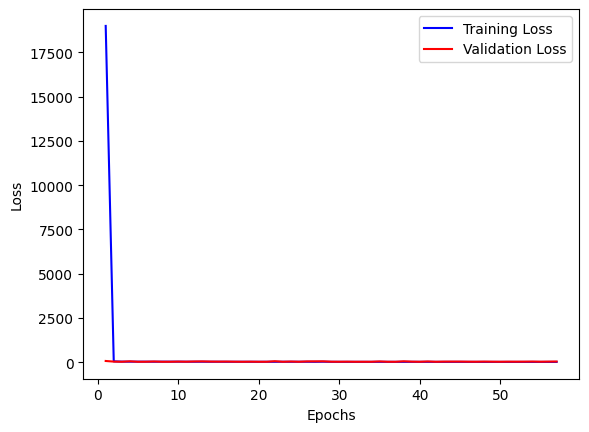

In [68]:
# Access the loss values from the training history
train_loss = history['loss']
val_loss = history['val_loss']

# Access the number of epochs
epochs = range(1, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

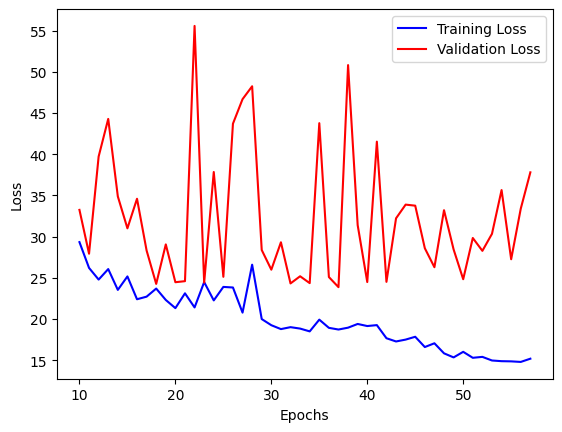

In [69]:
epochs = range(10, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss[9:], 'b', label='Training Loss')
plt.plot(epochs, val_loss[9:], 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [70]:
predictions = model.predict([bae_2d_X_test_vgg_, bae_2d_z_test_])

45/45 [==============================] - 1s 21ms/step


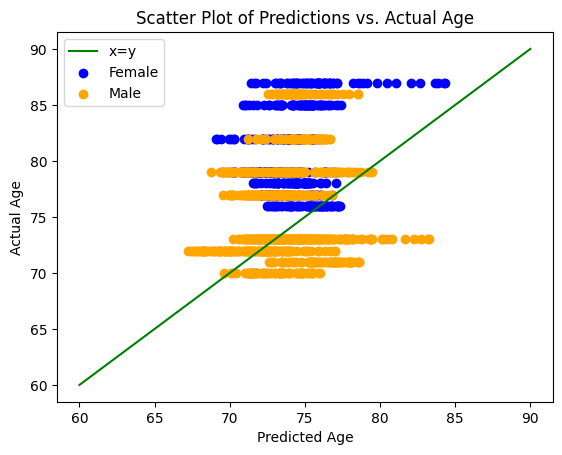

In [71]:
color = {1:'orange',-1:'blue'}
label = {1:'Male',-1:'Female'}
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.plot([60,90], [60,90], c='green', label='x=y')

for g in [-1,1]:
    i = np.where(bae_2d_z_test_ == g)
    plt.scatter(predictions[i], bae_2d_y_test_[i], c=color[g], label = label[g])

# Add labels and title
plt.xlabel('Predicted Age')
plt.ylabel('Actual Age')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

In [73]:
import numpy as np
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, confusion_matrix
from scipy.stats import pearsonr

def evaluate_predictions(predictions, true_values):
    # Calculate R^2
    r2 = r2_score(true_values, predictions)

    # Calculate MSE
    mse = mean_squared_error(true_values, predictions)

    # Calculate RMSE
    rmse = np.sqrt(mse)

    # Calculate MAE
    mae = mean_absolute_error(true_values, predictions)

    # Calculate Pearson's correlation coefficient
    r, _ = pearsonr(true_values, predictions)



    return r2, rmse, mse, mae, r

# Sample data
# (You'll need to define 'predictions' and 'bae_3d_ages_test' before calling the function)

r2, rmse, mse, mae, pearson_r = evaluate_predictions([float(i) for i in predictions], bae_2d_y_test_)
print(f"R^2: {r2}")
print(f"RMSE: {rmse}")
print(f"MSE: {mse}")
print(f"MAE: {mae}")
print(f"Pearson's r: {pearson_r}")


R^2: -0.6161685909070682
RMSE: 6.148649019948647
MSE: 37.805884770515455
MAE: 5.074832040054791
Pearson's r: 0.1654457732907752


### Version 4

In [40]:
from keras.applications.vgg16 import VGG16
pretrained_model = VGG16(input_shape=(95, 79, 3), include_top=False)

58889256/58889256 [==============================] - 0s 0us/step


In [41]:
bae_2d_X_train_ = np.array(twod_df[twod_df.split == 'train']['data'])
bae_2d_y_train_ = np.array(twod_df[twod_df.split == 'train']['age'])
bae_2d_X_test_ = np.array(twod_df[twod_df.split == 'test']['data'])
bae_2d_y_test_ = np.array(twod_df[twod_df.split == 'test']['age'])

In [42]:
bae_2d_X_train_ = np.array([bae_2d_X_train_[i] for i in range(len(bae_2d_X_train_))])
bae_2d_y_train_ = np.array([bae_2d_y_train_[i] for i in range(len(bae_2d_y_train_))])
bae_2d_X_test_ = np.array([bae_2d_X_test_[i] for i in range(len(bae_2d_X_test_))])
bae_2d_y_test_ = np.array([bae_2d_y_test_[i] for i in range(len(bae_2d_y_test_))])

In [43]:
bae_2d_z_train_ =  np.array(twod_df[twod_df.split == 'train']['sex'])
bae_2d_z_test_ =  np.array(twod_df[twod_df.split == 'test']['sex'])
bae_2d_z_train_ = np.array([bae_2d_z_train_[i] for i in range(len(bae_2d_z_train_))])
bae_2d_z_test_ = np.array([bae_2d_z_test_[i] for i in range(len(bae_2d_z_test_))])

In [44]:
bae_2d_X_train_vgg_ = np.repeat(bae_2d_X_train_[:, :, :, np.newaxis], 3, axis=3)
bae_2d_X_test_vgg_ = np.repeat(bae_2d_X_test_[:, :, :, np.newaxis], 3, axis=3)

In [45]:
group_id_ = np.array(twod_df[twod_df.split == 'train']['id'])

In [46]:
def create_model(num_ft_layers,neurons1, neurons2):

  # Define the input layer for the 3D Convolutional network
  model = Sequential()

  for layer in pretrained_model.layers[:14]:
      model.add(layer)

  # Freeze the weights of the pre-trained layers so they are not updated during training
  for layer in model.layers:
      layer.trainable = False


  # Flatten the output of the pre-trained model
  x = Flatten()(model.output)

  additional_input = Input(shape=(1,))


  # Add Dense layers after concatenation
  x = Dense(neurons1, activation='relu')(x)
  x = Dense(neurons2, activation='relu')(x)
  x = concatenate([x, additional_input])
  # Concatenate the flattened output with the new input
  output = Dense(1, activation='linear')(x)  # Use 'linear' activation for regression tasks

  # Create the final model
  model = Model(inputs=[pretrained_model.input, additional_input], outputs=output)

  for layer in model.layers[14 - num_ft_layers:]:
            layer.trainable = True

  session = K.get_session()
  for layer in model.layers[14 - num_ft_layers:14]:
      if layer.get_weights():
        weights_shape = layer.get_weights()[0].shape
        bias_shape = layer.get_weights()[1].shape

        # Re-initialize weights and biases
        new_weights = GlorotUniform()(weights_shape).numpy()
        new_biases = GlorotUniform()(bias_shape).numpy()

        layer.set_weights([new_weights, new_biases])
  METRICS = [keras.metrics.MeanAbsoluteError(name='mae')]



  # Compile the model
  model.compile(loss='mean_squared_error', optimizer='adam', metrics=METRICS)

  return(model)


In [47]:
group_id_

array([1, 1, 1, ..., 102, 102, 102], dtype=object)

In [48]:
import random
def objective(trial, X = bae_2d_X_train_vgg_,y = bae_2d_y_train_,z=bae_2d_z_train_ ,K = 3):
    global the_best_score
    """return the mse"""
    num_ft_layers = trial.suggest_int('num_layers', low = 0, high = 12, step = 2)
    neurons1 = trial.suggest_int('neurons1', low = 2, high = 256, step = 16)
    neurons2 = trial.suggest_int('neurons2', low = 2, high = 256, step = 16)
    batch_size = trial.suggest_int('batch_size', low = 8, high = 128, step = 16)

    callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=25, start_from_epoch=50, baseline = 100)
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, verbose=1)
    # random forest classifier object
    scores = []
    best_scores = []
    for _ in range(2):
        vals = list(set(group_id_))
        random.shuffle(vals)

        # Calculate the index to split
        split_idx = int(0.8 * len(vals))

        # Split the list into 80% and 20%
        train = vals[:split_idx]
        test = vals[split_idx:]

        model = create_model(num_ft_layers = num_ft_layers,neurons1 = neurons1, neurons2 = neurons2) # compile model
        train = [i for i,a in enumerate(group_id) if a in train]
        test = [i for i,a in enumerate(group_id) if a in test]


        model = create_model(num_ft_layers = num_ft_layers, neurons1 = neurons1, neurons2 = neurons2)
        try:
          history = model.fit([X[train], z[train]], y[train],
                                    validation_data = ([X[test], z[test]],y[test]), epochs=100, batch_size=batch_size, callbacks= [callback, reduce_lr]).history
          best_scores.append(min(history['val_loss']))
        except:
          traceback.print_exc()
          return(2000)
    the_best_score.append(np.mean(best_scores))
    return(np.mean(best_scores))


the_best_score = []
# create a study (aim to maximize score)
study = optuna.create_study(sampler=TPESampler(), direction='minimize')

# perform hyperparamter tuning (while timing the process)
time_start = time.time()
study.optimize(objective, n_trials=3, gc_after_trial=True)
time_bayesian = time.time() - time_start


[I 2023-08-29 09:43:07,649] A new study created in memory with name: no-name-b11923ae-d343-4e04-beb8-7c6c36126f97
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [2, 256] and step=16, but the range is not divisible by `step`. It will be replaced by [2, 242].
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/optuna/distributions.py:700: UserWarning: The distribution is specified by [8, 128] and step=16, but the range is not divisible by `step`. It will be replaced by [8, 120].
  warnings.warn(


Epoch 1/100
400/400 [==============================] - 21s 18ms/step - loss: 5588.4263 - mae: 74.5933 - val_loss: 5562.9683 - val_mae: 74.3618 - lr: 0.0010
Epoch 2/100
400/400 [==============================] - 7s 17ms/step - loss: 5402.6958 - mae: 73.3319 - val_loss: 5327.7275 - val_mae: 72.7567 - lr: 0.0010
Epoch 3/100
400/400 [==============================] - 7s 17ms/step - loss: 5113.1797 - mae: 71.3233 - val_loss: 5001.5640 - val_mae: 70.4727 - lr: 0.0010
Epoch 4/100
400/400 [==============================] - 7s 17ms/step - loss: 4746.9155 - mae: 68.6986 - val_loss: 4609.8828 - val_mae: 67.6287 - lr: 0.0010
Epoch 5/100
400/400 [==============================] - 7s 17ms/step - loss: 4327.2407 - mae: 65.5632 - val_loss: 4173.9604 - val_mae: 64.3166 - lr: 0.0010
Epoch 6/100
400/400 [==============================] - 7s 17ms/step - loss: 3874.3257 - mae: 62.0031 - val_loss: 3712.6350 - val_mae: 60.6148 - lr: 0.0010
Epoch 7/100
400/400 [==============================] - 7s 17ms/step -

[I 2023-08-29 10:04:45,385] Trial 0 finished with value: 535.2551565170288 and parameters: {'num_layers': 2, 'neurons1': 2, 'neurons2': 2, 'batch_size': 8}. Best is trial 0 with value: 535.2551565170288.


Epoch 1/100
27/27 [==============================] - 21s 406ms/step - loss: 61595.0547 - mae: 90.2753 - val_loss: 33.5665 - val_mae: 4.4427 - lr: 0.0010
Epoch 2/100
27/27 [==============================] - 6s 220ms/step - loss: 36.1805 - mae: 4.7996 - val_loss: 28.4066 - val_mae: 4.7920 - lr: 0.0010
Epoch 3/100
27/27 [==============================] - 6s 221ms/step - loss: 27.3104 - mae: 4.1303 - val_loss: 14.9425 - val_mae: 3.0880 - lr: 0.0010
Epoch 4/100
27/27 [==============================] - 6s 223ms/step - loss: 26.9005 - mae: 4.0973 - val_loss: 15.1667 - val_mae: 3.3644 - lr: 0.0010
Epoch 5/100
27/27 [==============================] - 6s 224ms/step - loss: 26.5354 - mae: 4.0876 - val_loss: 17.1297 - val_mae: 3.6533 - lr: 0.0010
Epoch 6/100
27/27 [==============================] - 6s 224ms/step - loss: 26.0226 - mae: 4.0462 - val_loss: 15.6797 - val_mae: 3.4669 - lr: 0.0010
Epoch 7/100
27/27 [==============================] - 6s 224ms/step - loss: 26.9503 - mae: 4.0838 - val_loss

[I 2023-08-29 10:20:50,805] Trial 1 finished with value: 17.94520854949951 and parameters: {'num_layers': 12, 'neurons1': 98, 'neurons2': 162, 'batch_size': 120}. Best is trial 1 with value: 17.94520854949951.


Epoch 1/100
400/400 [==============================] - 17s 30ms/step - loss: 911.4088 - mae: 10.7382 - val_loss: 10.9301 - val_mae: 2.7924 - lr: 0.0010
Epoch 2/100
400/400 [==============================] - 12s 29ms/step - loss: 41.9331 - mae: 5.1303 - val_loss: 30.9942 - val_mae: 4.6516 - lr: 0.0010
Epoch 3/100
400/400 [==============================] - 12s 29ms/step - loss: 41.6610 - mae: 5.1134 - val_loss: 35.7677 - val_mae: 5.2910 - lr: 0.0010
Epoch 4/100
400/400 [==============================] - 12s 29ms/step - loss: 38.5714 - mae: 4.9164 - val_loss: 11.8306 - val_mae: 2.8464 - lr: 0.0010
Epoch 5/100
400/400 [==============================] - 12s 29ms/step - loss: 42.3149 - mae: 5.1690 - val_loss: 11.9812 - val_mae: 2.7239 - lr: 0.0010
Epoch 6/100
400/400 [==============================] - 12s 29ms/step - loss: 34.7165 - mae: 4.6362 - val_loss: 28.6659 - val_mae: 4.4268 - lr: 0.0010
Epoch 7/100
400/400 [==============================] - 11s 29ms/step - loss: 35.7382 - mae: 4.6973

[I 2023-08-29 10:53:15,153] Trial 2 finished with value: 13.491441249847412 and parameters: {'num_layers': 12, 'neurons1': 18, 'neurons2': 178, 'batch_size': 8}. Best is trial 2 with value: 13.491441249847412.


In [49]:
values = [study.trials[i].values[0] for i in range(len(study.trials))]
params = [study.trials[i].params for i in range(len(study.trials))]
columns = list(params[0].keys()) + ['val']
bayesian_results = pd.DataFrame(columns = columns)
bayesian_results['val'] = values
for param in list(params[0].keys()):
  param_list = [study[param] for study in params]
  bayesian_results[param] = param_list

In [50]:
bayesian_results.sort_values(by=['val'])

,num_layers,neurons1,neurons2,batch_size,val
2,12,18,178,8,13.491441
1,12,98,162,120,17.945209
0,2,2,2,8,535.255157


In [51]:
optuna.visualization.plot_param_importances(study)

In [54]:
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, start_from_epoch=10, baseline = 50)
from keras.callbacks import ReduceLROnPlateau
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, verbose=1)
model = create_model(12,18,178)
history = model.fit([bae_2d_X_train_vgg_, bae_2d_z_train_], bae_2d_y_train_, validation_data= ([bae_2d_X_test_vgg_, bae_2d_z_test_], bae_2d_y_test_), epochs = 100, batch_size = 8, callbacks = [callback, reduce_lr]).history

Epoch 1/100
689/689 [==============================] - 27s 32ms/step - loss: 204.6626 - mae: 6.9547 - val_loss: 23.9624 - val_mae: 3.9667 - lr: 0.0010
Epoch 2/100
689/689 [==============================] - 21s 30ms/step - loss: 39.5439 - mae: 5.0023 - val_loss: 24.1174 - val_mae: 3.9791 - lr: 0.0010
Epoch 3/100
689/689 [==============================] - 20s 30ms/step - loss: 33.1371 - mae: 4.6027 - val_loss: 27.0921 - val_mae: 4.3271 - lr: 0.0010
Epoch 4/100
689/689 [==============================] - 20s 30ms/step - loss: 30.7200 - mae: 4.4078 - val_loss: 29.4945 - val_mae: 4.6201 - lr: 0.0010
Epoch 5/100
689/689 [==============================] - 20s 30ms/step - loss: 31.4436 - mae: 4.4364 - val_loss: 42.8835 - val_mae: 5.1398 - lr: 0.0010
Epoch 6/100
689/689 [==============================] - 20s 30ms/step - loss: 32.4553 - mae: 4.5261 - val_loss: 24.2773 - val_mae: 4.0061 - lr: 0.0010
Epoch 7/100
689/689 [==============================] - 20s 30ms/step - loss: 28.5485 - mae: 4.2485 

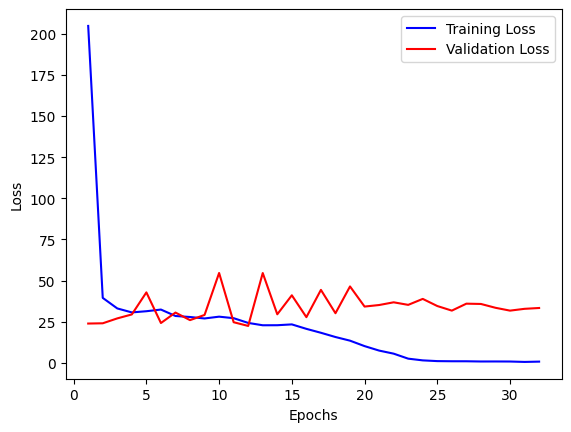

In [55]:
# Access the loss values from the training history
train_loss = history['loss']
val_loss = history['val_loss']

# Access the number of epochs
epochs = range(1, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

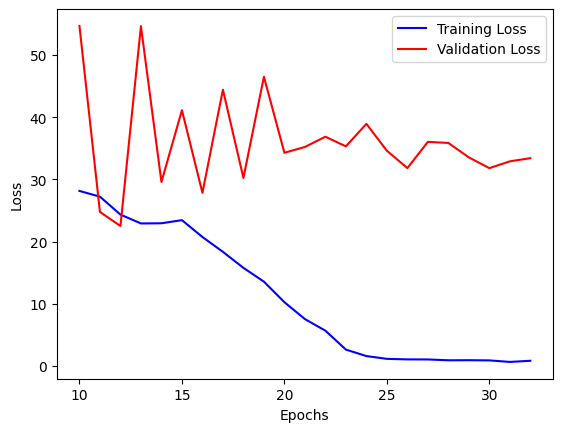

In [56]:
epochs = range(10, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss[9:], 'b', label='Training Loss')
plt.plot(epochs, val_loss[9:], 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [59]:
predictions = model.predict([bae_2d_X_test_vgg_, bae_2d_z_test_])

45/45 [==============================] - 3s 33ms/step


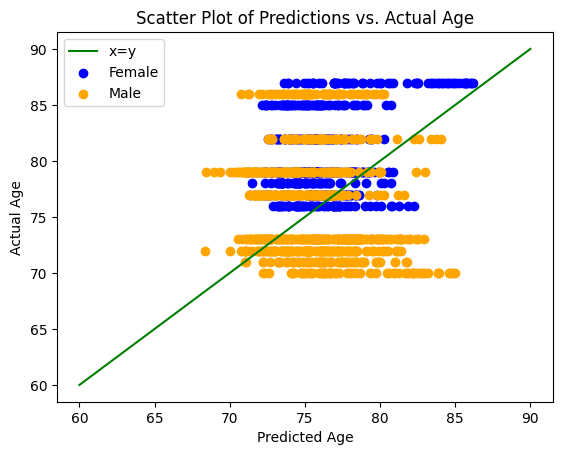

In [62]:
color = {1:'orange',-1:'blue'}
label = {1:'Male',-1:'Female'}
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.plot([60,90], [60,90], c='green', label='x=y')

for g in [-1,1]:
    i = np.where(bae_2d_z_test_ == g)
    plt.scatter(predictions[i], bae_2d_y_test_[i], c=color[g], label = label[g])

# Add labels and title
plt.xlabel('Predicted Age')
plt.ylabel('Actual Age')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

In [64]:
import numpy as np
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, confusion_matrix
from scipy.stats import pearsonr

def evaluate_predictions(predictions, true_values):
    # Calculate R^2
    r2 = r2_score(true_values, predictions)

    # Calculate MSE
    mse = mean_squared_error(true_values, predictions)

    # Calculate RMSE
    rmse = np.sqrt(mse)

    # Calculate MAE
    mae = mean_absolute_error(true_values, predictions)

    # Calculate Pearson's correlation coefficient
    r, _ = pearsonr(true_values, predictions)



    return r2, rmse, mse, mae, r

# Sample data
# (You'll need to define 'predictions' and 'bae_3d_ages_test' before calling the function)

r2, rmse, mse, mae, pearson_r = evaluate_predictions([float(i) for i in predictions], bae_2d_y_test_)
print(f"R^2: {r2}")
print(f"RMSE: {rmse}")
print(f"MSE: {mse}")
print(f"MAE: {mae}")
print(f"Pearson's r: {pearson_r}")


R^2: -0.4280906028571665
RMSE: 5.779819191334859
MSE: 33.40630988452274
MAE: 4.749778304113393
Pearson's r: 0.02485527367236192


## Getting the best model

In [ ]:
model = Sequential() # using sequential

# Add 3D Convolutional layers with MaxPooling
model.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(95, 79, 1)))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(64, kernel_size=(3, 3), activation='relu', input_shape=(95, 79, 1)))
model.add(MaxPooling2D(pool_size=(2, 2)))


# Flatten the output and add Dense layers for age prediction
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(1, activation='linear'))  # Use 'linear' activation for regression tasks

# Compile the model
model.compile(loss='mean_squared_error', optimizer='adam', metrics=[metrics.mean_absolute_error])


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test, z_train, z_test = train_test_split(X, y, z, test_size=0.2, random_state=42)
model.fit(X_train, y_train, epochs=400, batch_size=16, validation_data = (X_test, y_test))

Epoch 1/400
102/102 [==============================] - 13s 9ms/step - loss: 247.8621 - mean_absolute_error: 10.0326 - val_loss: 33.7370 - val_mean_absolute_error: 4.5954
Epoch 2/400
102/102 [==============================] - 1s 5ms/step - loss: 31.2726 - mean_absolute_error: 4.3872 - val_loss: 31.0015 - val_mean_absolute_error: 4.3434
Epoch 3/400
102/102 [==============================] - 1s 5ms/step - loss: 28.6745 - mean_absolute_error: 4.2530 - val_loss: 26.9340 - val_mean_absolute_error: 4.0794
Epoch 4/400
102/102 [==============================] - 1s 5ms/step - loss: 29.7851 - mean_absolute_error: 4.3504 - val_loss: 26.6544 - val_mean_absolute_error: 4.0875
Epoch 5/400
102/102 [==============================] - 1s 5ms/step - loss: 24.5405 - mean_absolute_error: 3.8903 - val_loss: 32.3695 - val_mean_absolute_error: 4.5452
Epoch 6/400
102/102 [==============================] - 1s 5ms/step - loss: 26.4569 - mean_absolute_error: 4.0463 - val_loss: 51.9999 - val_mean_absolute_error: 6.

13/13 [==============================] - 0s 7ms/step


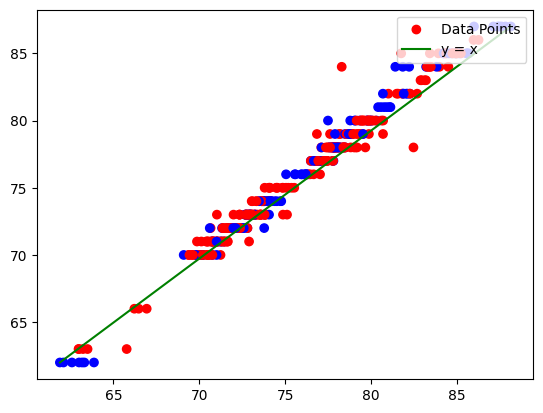

In [ ]:
predictions = model.predict(X_test)

import matplotlib.pyplot as plt

color = {1:'red',-1:'blue'}
# Plot scatter points with colors based on the third list
plt.scatter(predictions, y_test, c = [color[c] for c in z_test], label='Data Points')

# Draw the line x = y
plt.plot([min(predictions), max(predictions)], [min(y_test), max(y_test)], color='green', label='y = x')

# Add legend to the plot
plt.legend(loc='upper right')

# Display the plot
plt.show()

What if we average round the predictions to the nearest integer

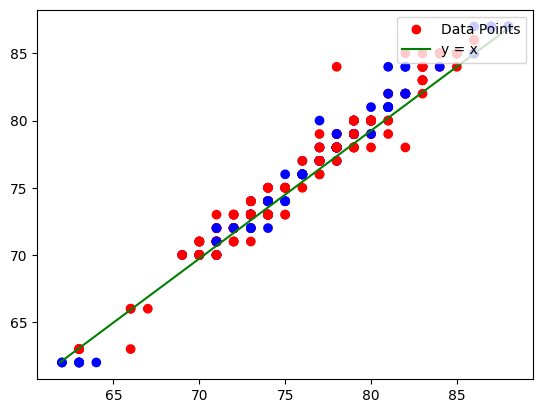

In [ ]:
# Plot scatter points with colors based on the third list
plt.scatter([round(x[0]) for x in predictions], y_test, c = [color[c] for c in z_test], label='Data Points')

# Draw the line x = y
plt.plot([min(predictions), max(predictions)], [min(y_test), max(y_test)], color='green', label='y = x')

# Add legend to the plot
plt.legend(loc='upper right')

# Display the plot
plt.show()

# MCI conversion Predictor

## Preparing the data

In [469]:
mci_df = pd.read_csv('/content/drive/MyDrive/MCI DATA/MCI_processed.csv')

In [470]:
mci_df

,Unnamed: 0,Image Data ID,Subject,Group,Sex,Age,Visit,Modality,Description,Type,Acq Date,Format,Downloaded,Label,Date
0,0,I211819,012_S_1033,MCI,F,73,bl,PET,"Tx Origin, Spatially Normalized",Post-processed,12/01/2006,NiFTI,NaN,pMCI,6
1,1,I212445,941_S_1311,MCI,M,69,bl,PET,"Tx Origin, Spatially Normalized",Post-processed,3/30/2007,NiFTI,NaN,pMCI,12
2,2,I211835,018_S_0155,MCI,M,81,bl,PET,"Tx Origin, Spatially Normalized",Post-processed,3/23/2006,NiFTI,NaN,pMCI,36
3,3,I211851,027_S_0485,MCI,M,65,bl,PET,"Tx Origin, Spatially Normalized",Post-processed,5/31/2006,NiFTI,NaN,sMCI,18
4,4,I211867,033_S_0906,MCI,F,65,bl,PET,"Tx Origin, Spatially Normalized",Post-processed,10/23/2006,NiFTI,NaN,pMCI,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
232,247,I210152,098_S_2052,EMCI,M,73,bl,PET,"Tx Origin, Spatially Normalized",Post-processed,9/29/2010,NiFTI,NaN,sMCI,60
233,248,I212404,127_S_1419,MCI,M,78,bl,PET,"Tx Origin, Spatially Normalized",Post-processed,8/31/2007,NiFTI,NaN,sMCI,48
234,249,I211794,003_S_1074,MCI,F,85,bl,PET,"Tx Origin, Spatially Normalized",Post-processed,2/15/2007,NiFTI,NaN,pMCI,108
235,250,I212420,128_S_1407,MCI,F,75,bl,PET,"Tx Origin, Spatially Normalized",Post-processed,6/08/2007,NiFTI,NaN,pMCI,36


In [471]:
mci_df['Sex'] = mci_df['Sex'].apply(lambda x: 1 if x == 'M' else -1)
mci_df['Label'] = mci_df['Label'].apply(lambda x: 1 if x == 'pMCI' else 0)

Lets see how are data is split depending on where we set the threshhold:

In [472]:
dates = sorted(mci_df.Date.unique())
for threshhold in dates:
  print('Threshhold',threshhold)
  pMCI_counts, sMCI_counts = 0,0
  for row in mci_df.iterrows():
    if row[1]['Label'] == 1:
      if row[1]['Date'] > threshhold:
        sMCI_counts += 1
      else:
        pMCI_counts += 1
    else:
      if row[1]['Date'] < threshhold:
        None
      else:
        sMCI_counts += 1
  print(f'pMCI count: {pMCI_counts}, sMCI count: {sMCI_counts}, we removed {237 - (sMCI_counts + pMCI_counts)} images')




Threshhold 6
pMCI count: 5, sMCI count: 232, we removed 0 images
Threshhold 12
pMCI count: 24, sMCI count: 200, we removed 13 images
Threshhold 18
pMCI count: 40, sMCI count: 173, we removed 24 images
Threshhold 24
pMCI count: 60, sMCI count: 145, we removed 32 images
Threshhold 36
pMCI count: 80, sMCI count: 108, we removed 49 images
Threshhold 48
pMCI count: 91, sMCI count: 75, we removed 71 images
Threshhold 60
pMCI count: 96, sMCI count: 58, we removed 83 images
Threshhold 72
pMCI count: 100, sMCI count: 42, we removed 95 images
Threshhold 78
pMCI count: 100, sMCI count: 38, we removed 99 images
Threshhold 84
pMCI count: 101, sMCI count: 36, we removed 100 images
Threshhold 96
pMCI count: 105, sMCI count: 26, we removed 106 images
Threshhold 108
pMCI count: 107, sMCI count: 20, we removed 110 images
Threshhold 120
pMCI count: 110, sMCI count: 12, we removed 115 images
Threshhold 132
pMCI count: 110, sMCI count: 8, we removed 119 images
Threshhold 138
pMCI count: 111, sMCI count: 6,

36 seems to be the best threshhold as it splits the data the best without removing too much data

In [473]:
mci_df['Golden Label'] = ''
for i, row in enumerate(mci_df.iterrows()):
    if row[1]['Label'] == 1:
      if row[1]['Date'] > 36:
        mci_df.loc[i, 'Golden Label'] = 'sMCI'

      else:
        mci_df.loc[i, 'Golden Label'] = 'pMCI'
    else:
      if row[1]['Date'] < 36:
        None
      else:
        mci_df.loc[i, 'Golden Label'] = 'sMCI'

In [474]:
mci_df= mci_df[mci_df['Golden Label'] != '']

In [475]:
mci_df['Golden Label'] = mci_df['Golden Label'].apply(lambda x: 1 if x == 'pMCI' else 0)

<ipython-input-475-0ebf558cb0a1>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mci_df['Golden Label'] = mci_df['Golden Label'].apply(lambda x: 1 if x == 'pMCI' else 0)


In [476]:
mci_dates = []
for row in mci_df.iterrows():
  if row[1]['Golden Label'] == 0:
    mci_dates.append(1000)
  else:
    res = row[1]['Date']
    mci_dates.append(res)

In [477]:
# new colunm for the paths
mci_df['Loc'] = ''
directory = '/content/drive/MyDrive/MCI DATA/output_imageID' # enter the dir were the images are stored

# iterate over files in that directory
for filename in os.listdir(directory):
    f = os.path.join(directory, filename)
    image_id_folder = filename
    if image_id_folder in list(mci_df['Image Data ID']):
      for image in os.listdir(f):
        f = os.path.join(f, image)
        if os.path.isfile(f) and f.endswith('nii'):  # checking if it is a file and a .nii file
            mci_df.loc[mci_df['Image Data ID']==image_id_folder, 'Loc' ] = f # appending the path



<ipython-input-477-28044c421478>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mci_df['Loc'] = ''


In [478]:
mci_df[mci_df['Loc'] == '']

,Unnamed: 0,Image Data ID,Subject,Group,Sex,Age,Visit,Modality,Description,Type,Acq Date,Format,Downloaded,Label,Date,Golden Label,Loc


In [479]:

# Extract image data and corresponding ages from the DataFrame
mci_image_paths = mci_df['Loc'].values
mci_ages = mci_df['Age'].values
mci_sexes = mci_df['Sex'].values
mci_labels = mci_df['Golden Label'].values

# Initialize empty lists to store image arrays and labels
mci_image_data = []

# Loop through each image path, load the image, and append to the lists
for path in mci_image_paths:
    image = nib.load(path).get_fdata()
    mci_image_data.append(image)

# Convert lists to numpy arrays
mci_image_data = np.array(mci_image_data)

In [480]:
count = 0
locations = []
shape = mci_image_data.shape
for a in range(shape[0]):
  for b in range(shape[1]):
    for c in range(shape[2]):
      for d in range(shape[3]):
        if pd.isna(mci_image_data[a][b][c][d]):
          locations.append([a,b,c,d])
          count+=1
print(count)

19805


In [481]:
from collections import Counter
Counter([ele[0] for ele in locations])

Counter({9: 7035, 60: 6490, 119: 817, 135: 3069, 185: 2394})

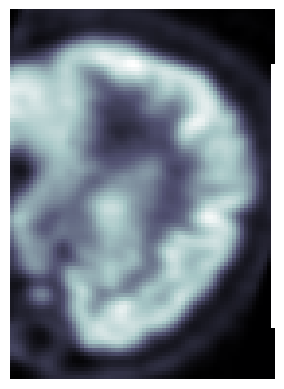

In [482]:
plt.imshow(mci_image_data[9][20], cmap='bone')
plt.axis('off')
plt.show()

In [483]:
for location in locations:
  surrounding_pixels = []
  try:
    surrounding_pixels.append(mci_image_data[location[0]][location[1]-1][location[2]][location[3]])
  except:
    None
  try:
    surrounding_pixels.append(mci_image_data[location[0]][location[1]+1][location[2]][location[3]])
  except:
    None
  try:
    surrounding_pixels.append(mci_image_data[location[0]][location[1]][location[2]-1][location[3]])
  except:
    None
  try:
    surrounding_pixels.append(mci_image_data[location[0]][location[1]][location[2]+1][location[3]])
  except:
    None
  try:
    surrounding_pixels.append(mci_image_data[location[0]][location[1]][location[2]][location[3]-1])
  except:
    None
  try:
    surrounding_pixels.append(mci_image_data[location[0]][location[1]][location[2]][location[3]+1])
  except:
    None
  mci_image_data[location[0]][location[1]][location[2]][location[3]]  =  np.nanmean(surrounding_pixels)

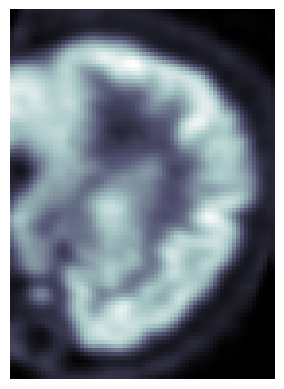

In [484]:
plt.imshow(mci_image_data[9][20], cmap='bone')
plt.axis('off')
plt.show()

In [485]:
"""count = 0
locations = []
shape = mci_image_data.shape
for a in range(shape[0]):
  for b in range(shape[1]):
    for c in range(shape[2]):
      for d in range(shape[3]):
        if pd.isna(mci_image_data[a][b][c][d]):
          locations.append([a,b,c,d])
          count+=1
print(count)"""

'count = 0\nlocations = []\nshape = mci_image_data.shape\nfor a in range(shape[0]):\n  for b in range(shape[1]):\n    for c in range(shape[2]):\n      for d in range(shape[3]):\n        if pd.isna(mci_image_data[a][b][c][d]):\n          locations.append([a,b,c,d])\n          count+=1\nprint(count)'

In [486]:
# Convert mci_labels and mci_sexes to string type
mci_labels_str = [str(i) for i in mci_labels]
mci_sexes_str = [str(i) for i in mci_sexes]

# Create a combined stratification variable
stratify_var = [label + sex for label, sex in zip(mci_labels_str, mci_sexes_str)]

# Split the data using the combined stratification variable
train_idx, test_idx, a, b = train_test_split(
    np.arange(188), mci_labels, test_size=0.2, stratify=stratify_var
)


In [487]:
from skimage.feature import greycomatrix
from skimage import img_as_ubyte
mci_twod_df = pd.DataFrame(columns = ['id','age','sex','entropy','data', 'label'])
slice_counter = 0
rotation_angle = 90
counter = 0
for image_array, age, sex, label in zip(mci_image_data, mci_ages, mci_sexes, mci_labels):
  print(image_array.shape)
  counter += 1
  total_volumes = 1
  total_slices = image_array.shape[2]
  for current_volume in range(0, total_volumes):
      # iterate through slices
      for current_slice in range(0, total_slices):
          if (slice_counter % 1) == 0:
              if rotation_angle == 90:
                  data = np.rot90(image_array[:, :, current_slice])
              elif rotation_angle == 180:
                  data = np.rot90(np.rot90(image_array[:, :, current_slice]))
              elif rotation_angle == 270:
                  data = np.rot90(np.rot90(np.rot90(image_array[:, :, current_slice])))
              #alternate slices and save as png
              if (slice_counter % 1) == 0:
                  print('Adding image...')
                  min_val = np.min(data)
                  max_val = np.max(data)
                  im = 2 * (data - min_val) / (max_val - min_val) - 1
                  im = img_as_ubyte(im)
                  glcm = np.squeeze(greycomatrix(im, distances=[1], angles=[0], symmetric=True, normed=True))
                  entropy = -np.sum(glcm*np.log2(glcm + (glcm==0)))
                  new_row = {'id':counter, 'age':age, 'sex':sex, 'entropy':entropy, 'data':data, 'label':label}
                  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
                  #imsave(imge_folder +str(counter)+'_'+x_label2+'.jpg', data,format='jpg')
                  print('Saved.')

(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur


Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Save

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: Th

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79,

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: Th

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding imag

<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: Th

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: Th

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: Th

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: Th

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur


Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Save

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: Th

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur


Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding ima

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur


Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Save

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: Th

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: Th

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: Th

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: Th

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: Th

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: Th

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: Th

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: Th

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: Th

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: Th

Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: Th

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: Th

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: Th

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79,

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur


Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: Th

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: Th

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: Th

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur


Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Save

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79,

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79,

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: Th

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: Th

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...


/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: Th

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: Th

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image..

<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: Th

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
(79, 95, 68)
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image..

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Adding image...
Saved.
Addi

/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/feature/__init__.py:35: skimage_deprecation: Function ``greycomatrix`` is deprecated and will be removed in version 1.0. Use ``skimage.feature.graycomatrix`` instead.
  removed_version='1.0')
<ipython-input-487-f50fbef8a3cd>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_twod_df = mci_twod_df.append(new_row, ignore_index=True)
/usr/local/lib/python3.10/dist-packages/skimage/featur

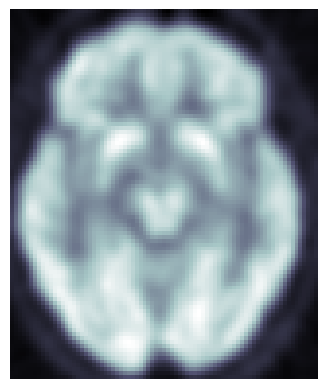

In [488]:
plt.imshow(mci_twod_df['data'][mci_twod_df['entropy'].idxmax()], cmap='bone')
plt.axis('off')
plt.show()

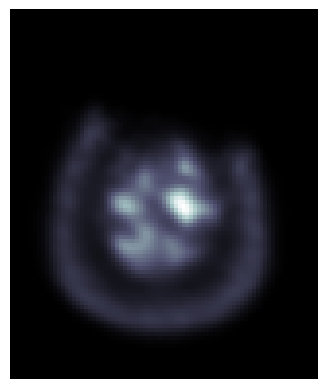

In [489]:
plt.imshow(mci_twod_df['data'][mci_twod_df['entropy'].idxmin()], cmap='bone')
plt.axis('off')
plt.show()

## Some visualisations of the data

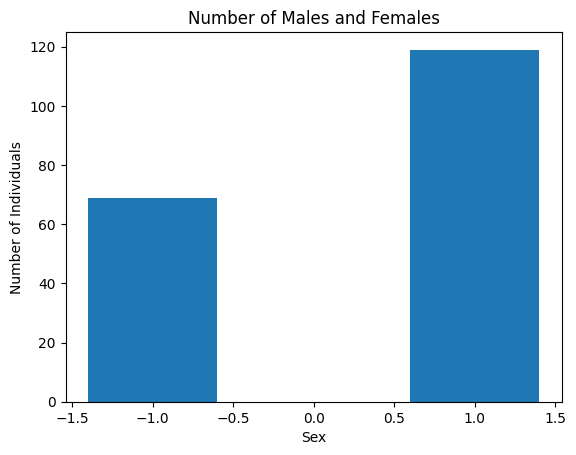

In [ ]:
sex_counts = mci_df["Sex"].value_counts()
# Plot the bar chart
plt.bar(sex_counts.index, sex_counts.values)
plt.xlabel("Sex")
plt.ylabel("Number of Individuals")
plt.title("Number of Males and Females")
plt.show()

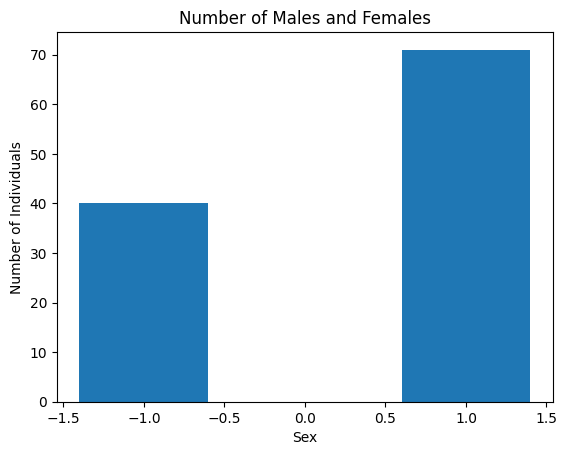

In [ ]:
sex_counts = mci_df[mci_df['Label']==1]["Sex"].value_counts()
# Plot the bar chart
plt.bar(sex_counts.index, sex_counts.values)
plt.xlabel("Sex")
plt.ylabel("Number of Individuals")
plt.title("Number of Males and Females")
plt.show()

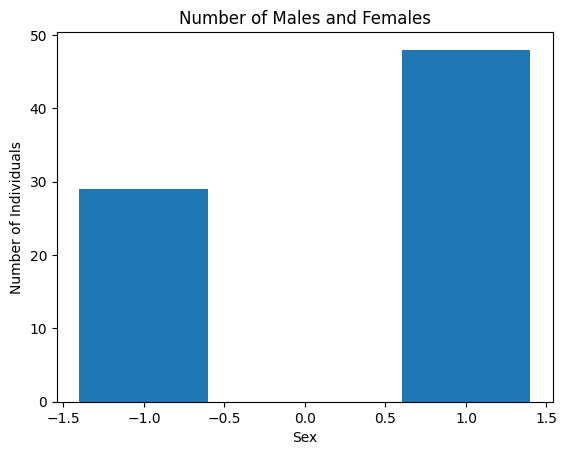

In [ ]:
sex_counts = mci_df[mci_df['Label']==-1]["Sex"].value_counts()
# Plot the bar chart
plt.bar(sex_counts.index, sex_counts.values)
plt.xlabel("Sex")
plt.ylabel("Number of Individuals")
plt.title("Number of Males and Females")
plt.show()

Text(0.5, 1.0, 'Age Distribution')

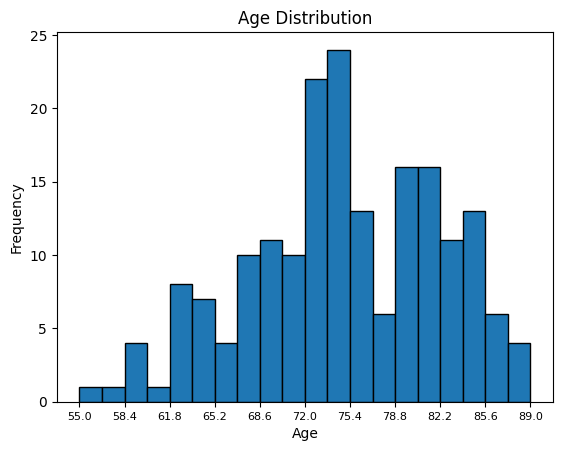

In [ ]:
plt.hist(mci_df["Age"], bins=20, edgecolor="black")
plt.xlabel("Age")
plt.ylabel("Frequency")
num_ticks = 11  # The number of ticks you want
x_ticks = np.linspace(mci_df["Age"].min(), mci_df["Age"].max(), num_ticks)
plt.xticks(x_ticks, fontsize=8)

plt.title("Age Distribution")

Text(0.5, 1.0, 'Age Distribution')

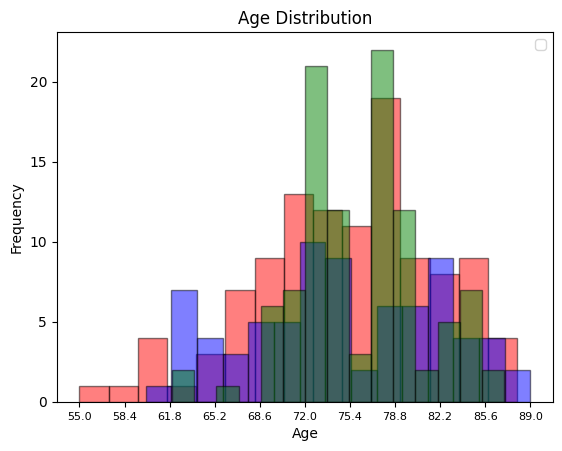

In [ ]:
plt.hist(mci_df[mci_df['Label']==1]["Age"], bins=15, alpha=0.5, edgecolor="black", color='red')
plt.hist(mci_df[mci_df['Label']==-1]["Age"], bins=15, alpha=0.5, edgecolor="black", color = 'blue')
plt.hist(df["Age"], bins=15, alpha=0.5, edgecolor="black", color='green')
plt.xlabel("Age")
plt.ylabel("Frequency")
plt.legend(loc='upper right')

num_ticks = 11  # The number of ticks you want
x_ticks = np.linspace(mci_df["Age"].min(), mci_df["Age"].max(), num_ticks)
plt.xticks(x_ticks, fontsize=8)

plt.title("Age Distribution")

In [ ]:
mci_twod_df

,id,age,sex,entropy,data,label
0,1,73,-1,2.962042,"[[0.0012566640507429838, 0.0006672602030448616...",1
1,1,73,-1,3.266010,"[[0.005831534508615732, 0.004074377007782459, ...",1
2,1,73,-1,3.586705,"[[0.0025276336818933487, 0.0037867948412895203...",1
3,1,73,-1,3.913472,"[[-0.0035421315114945173, 0.001200263504870236...",1
4,1,73,-1,4.186998,"[[-0.00891648419201374, -0.005033640656620264,...",1
...,...,...,...,...,...,...
12779,188,75,-1,1.968181,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.969149707292...",1
12780,188,75,-1,1.548230,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.2756951...",1
12781,188,75,-1,1.314213,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",1
12782,188,75,-1,1.111402,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",1


In [ ]:
mci_high_entropy_df = pd.DataFrame(columns = ['id','age','sex','entropy','data', 'label'])
for id in mci_twod_df.id.unique():
  filtered_df = mci_twod_df[mci_twod_df.id == id].sort_values(by=['entropy'], ascending=False).head(20)
  mci_high_entropy_df = mci_high_entropy_df.append(filtered_df)


<ipython-input-71-80ab6461e0e2>:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_high_entropy_df = mci_high_entropy_df.append(filtered_df)
<ipython-input-71-80ab6461e0e2>:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_high_entropy_df = mci_high_entropy_df.append(filtered_df)
<ipython-input-71-80ab6461e0e2>:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_high_entropy_df = mci_high_entropy_df.append(filtered_df)
<ipython-input-71-80ab6461e0e2>:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mci_high_entropy_df = mci_high_entropy_df.append(filtered_df)
<ipython-input-71-80ab6461e0e2>:4: FutureWarning: The frame.append metho

In [ ]:
mci_high_entropy_df

,id,age,sex,entropy,data,label
16,1,73,-1,8.503109,"[[-0.010737914592027664, -0.01956712268292904,...",1
18,1,73,-1,8.467059,"[[-0.009189191274344921, -0.010210409760475159...",1
15,1,73,-1,8.433147,"[[-0.008829991333186626, -0.018925653770565987...",1
17,1,73,-1,8.414684,"[[-0.011152115650475025, -0.016327910125255585...",1
14,1,73,-1,8.198814,"[[-0.0070784869603812695, -0.01700356416404247...",1
...,...,...,...,...,...,...
12731,188,75,-1,7.856287,"[[0.0, 0.0, 0.0, 0.0, 2.0399130562509526e-07, ...",1
12747,188,75,-1,7.417500,"[[0.0, 0.0, 0.0, 0.0, 1.7709224948703195e-06, ...",1
12730,188,75,-1,7.395668,"[[0.0, 0.0, 0.0, 0.0, 0.0, 1.7699372619972564e...",1
12748,188,75,-1,6.981628,"[[2.254813352919882e-06, 1.7587442471267423e-0...",1


In [ ]:
mci_X = np.array(mci_high_entropy_df['data'])
mci_y = np.array(mci_high_entropy_df['label'])

In [ ]:
mci_X = np.array([mci_X[i] for i in range(len(mci_X))])
mci_y = np.array([mci_y[i] for i in range(len(mci_y))])

In [ ]:
mci_age = np.array(mci_high_entropy_df['age'])
mci_sex = np.array(mci_high_entropy_df['sex'])

In [494]:
backup_model = tf.keras.models.clone_model(model)

In [495]:
backup_model

## Adding the Age gap biomarker

In [490]:
mci_X_vgg = np.repeat(mci_image_data[..., np.newaxis], 3, axis=-1)

In [ ]:
mci_age_predictions = []
for i in range(len(mci_X_vgg)):
  preds = model.predict([mci_X_vgg[i:i+1], mci_sexes[i:i+1]])
  mci_age_predictions.append(preds)


In [497]:
mci_age_predictions = [i[0][0] for i in mci_age_predictions]

In [498]:
mci_dates = np.array(mci_dates)

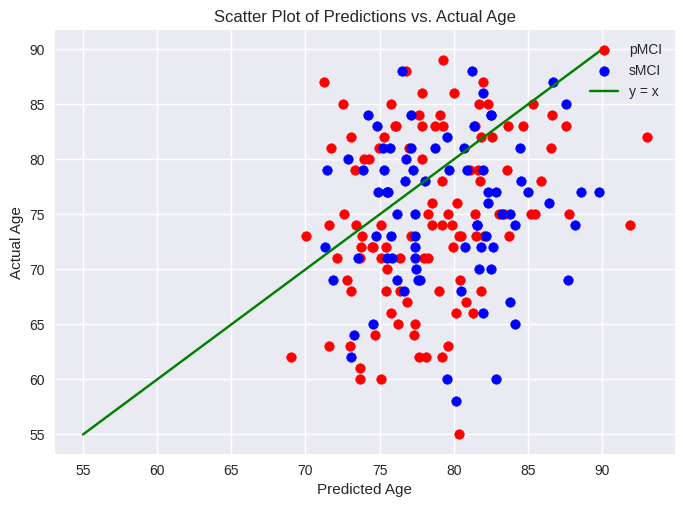

In [581]:
import matplotlib.pyplot as plt

# Create a color map: -1 is red and 1 is blue
colormap = {0: 'red', 1: 'blue'}
label = {1:'sMCI',0:'pMCI'}


for g in [0,1]:
    i = np.where(mci_labels == g)
    plt.scatter(np.array(mci_age_predictions)[i], np.array(mci_ages)[i], c=colormap[g], label = label[g])

# Plot scatter points with colors based on the third list
#plt.scatter(mci_age_predictions, mci_ages, c=[colormap[c] for c in mci_sexes], label='Data Points')

# Draw the line x = y
plt.plot([55,90], [55,90], color='green', label='y = x')

# Add legend to the plot
plt.xlabel('Predicted Age')
plt.ylabel('Actual Age')
plt.title('Scatter Plot of Predictions vs. Actual Age')
plt.legend(loc='upper right')



# Display the plot
plt.show()


In [ ]:
color = {1:'orange',-1:'blue'}
label = {1:'Male',-1:'Female'}
#plt.scatter(predictions, y_test, c=[color[i] for i in sex_test], label='Data points', label = 'a')
plt.plot([60,90], [60,90], c='green', label='x=y')

for g in [-1,1]:
    i = np.where(bae_3d_sexes_test == g)
    plt.scatter(predictions[i], bae_3d_ages_test[i], c=color[g], label = label[g])

# Add labels and title
plt.xlabel('Predicted Age')
plt.ylabel('Actual Age')
plt.title('Scatter Plot of Predictions vs. Actual Age')

# Add a legend
plt.legend()

# Show the plot
plt.show()

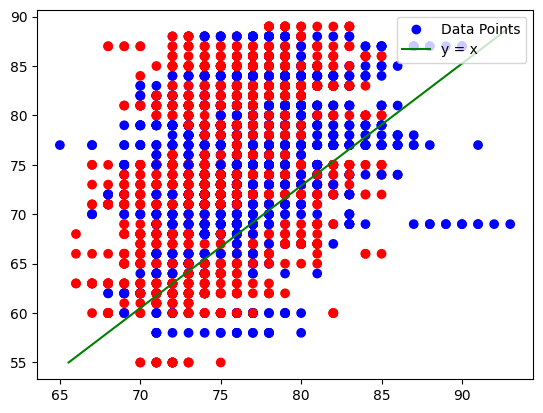

In [ ]:
import matplotlib.pyplot as plt


# Plot scatter points with colors based on the third list
plt.scatter([int(x[0]) for x in mci_age_predictions], mci_age, c=[colormap[c] for c in mci_y], label='Data Points')

# Draw the line x = y
plt.plot([min(mci_age_predictions), max(mci_age_predictions)], [min(mci_age), max(mci_age)], color='green', label='y = x')

# Add legend to the plot
plt.legend(loc='upper right')

# Display the plot
plt.show()

In [500]:
age_gap = [prediction - actual for prediction, actual in zip(mci_age_predictions, mci_ages)]

In [501]:
age_gap = np.array(age_gap)

In [502]:
conversion_date = []
mean_gap = []
for date in set(mci_dates):
  idx = np.where(mci_dates == date)
  age_gaps_for_date = age_gap[idx]
  conversion_date.append(date)
  mean_gap.append(np.mean(age_gaps_for_date))

In [503]:
conversion_date

[36, 6, 1000, 12, 18, 24]

In [504]:
mean_gap

[3.3757091522216798,
 8.141928100585938,
 3.669968287150065,
 4.945010135048314,
 2.977872848510742,
 4.872028350830078]

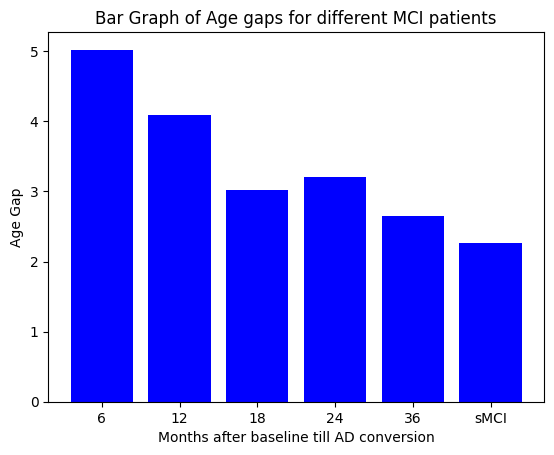

In [506]:
import matplotlib.pyplot as plt

# Sample data
categories = ['6','12','18','24','36','sMCI']
values = [5.022404479980469, 4.097671910336143, 3.018092632293701, 3.209321975708008,  2.651763153076172, 2.2664838013825594]

# Create a bar graph
plt.bar(categories, values, color='blue')

# Add labels and title
plt.xlabel('Months after baseline till AD conversion')
plt.ylabel('Age Gap')
plt.title('Bar Graph of Age gaps for different MCI patients')

# Display the graph
plt.show()


In [507]:
smci_age_gaps = [age for age,label in zip(age_gap, mci_labels) if label ==0]
pmci_age_gaps = [age for age,label in zip(age_gap, mci_labels) if label ==1]

In [300]:
len(smci_age_gaps) + len(pmci_age_gaps)

188

In [508]:
np.mean(smci_age_gaps)

3.669968287150065

In [509]:
np.mean(pmci_age_gaps)

4.340819358825684

In [510]:
np.mean(pmci_age_gaps) - np.mean(smci_age_gaps)

0.6708510716756186

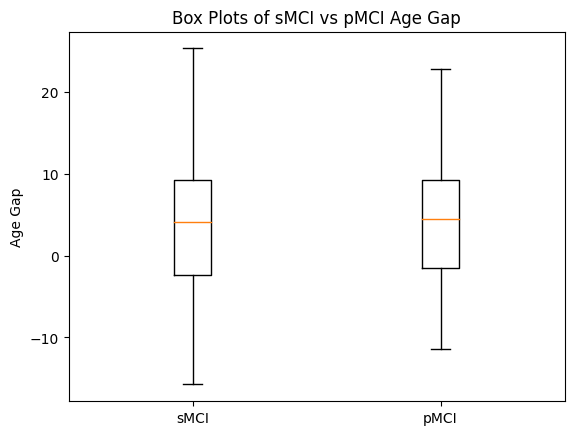

In [511]:
import matplotlib.pyplot as plt

# Create a combined dataset
box_plot_data = [[a for a in smci_age_gaps], [a for a in pmci_age_gaps]]

# Create labels for the box plots
labels = ['sMCI', 'pMCI']

# Create the box plots
plt.boxplot(box_plot_data, labels=labels)

# Set the title and y-axis label
plt.title("Box Plots of sMCI vs pMCI Age Gap")
plt.ylabel("Age Gap")

# Display the plot
plt.show()


## Building a model

In [514]:
import numpy as np
from keras.models import Sequential
from keras.layers import Conv3D, MaxPooling3D, BatchNormalization, Dense, Flatten, Activation
from keras.optimizers import SGD

def create_model():
    model = Sequential()

    # Number of feature channels
    num_channels = 8

    # Repeated 5 blocks
    for _ in range(4):
        # (3x3x3) Convolutional layer with stride of 1
        model.add(Conv3D(filters=num_channels, kernel_size=(3, 3, 3), strides=(1, 1, 1), padding='same', input_shape=(79, 95, 68, 1)))
        model.add(Activation('relu'))

        # Another (3x3x3) Convolutional layer with stride of 1
        model.add(Conv3D(filters=num_channels, kernel_size=(3, 3, 3), strides=(1, 1, 1), padding='same'))

        # 3D Batch-normalization layer
        model.add(BatchNormalization())

        # ReLU
        model.add(Activation('relu'))

        # (2x2x2) Max-pooling layer with stride of 2
        model.add(MaxPooling3D(pool_size=(2, 2, 2), strides=(2, 2, 2)))

        # Double the number of feature channels for the next block
        num_channels *= 2

    # Flatten the output
    model.add(Flatten())

    # Fully connected layer for age prediction
    model.add(Dense(1))
    model.add(Activation('sigmoid'))

    sgd = SGD(learning_rate=0.01, momentum=0.9)

    model.compile(loss=keras.losses.binary_crossentropy, optimizer=sgd, metrics=['accuracy'])
    return model


In [579]:
import keras
from keras.models import Model
from keras.layers import Conv3D, MaxPooling3D, BatchNormalization, Dense, Flatten, Activation, Input, concatenate
from keras.optimizers import SGD

def create_ag_model():
    # Main input (3D image input)
    main_input = Input(shape=(79, 95, 68, 1))

    x = main_input

    # Number of feature channels
    num_channels = 4

    # Repeated 5 blocks
    for _ in range(3):
        # (3x3x3) Convolutional layer with stride of 1
        x = Conv3D(filters=num_channels, kernel_size=(3, 3, 3), strides=(1, 1, 1), padding='same')(x)
        x = Activation('relu')(x)

        # Another (3x3x3) Convolutional layer with stride of 1
        x = Conv3D(filters=num_channels, kernel_size=(3, 3, 3), strides=(1, 1, 1), padding='same')(x)

        # 3D Batch-normalization layer
        x = BatchNormalization()(x)

        # ReLU
        x = Activation('relu')(x)

        # (2x2x2) Max-pooling layer with stride of 2
        x = MaxPooling3D(pool_size=(2, 2, 2), strides=(2, 2, 2))(x)

        # Double the number of feature channels for the next block
        num_channels *= 2

    # Flatten the output
    x = Flatten()(x)

    x = Dense(4, activation='relu')(x)

    # Additional input
    additional_input = Input(shape=(1,))  # Assuming the additional input has a shape of (10,)

    # Concatenate the flattened output with the additional input
    concatenated = concatenate([x, additional_input])

    # Add a fully connected layer after the concatenation
    # Output layer
    output = Dense(1, activation='sigmoid')(concatenated)

    sgd = SGD(learning_rate=0.01, momentum=0.9)

    # Create the final model
    model = Model(inputs=[main_input, additional_input], outputs=output)

    model.compile(loss=keras.losses.binary_crossentropy, optimizer=sgd, metrics=['accuracy'])
    return model


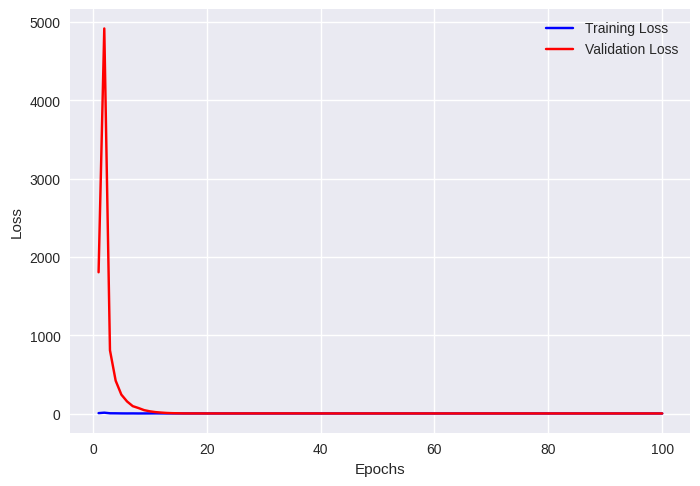

In [282]:
# Access the loss values from the training history
train_loss = history['loss']
val_loss = history['val_loss']

# Access the number of epochs
epochs = range(1, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

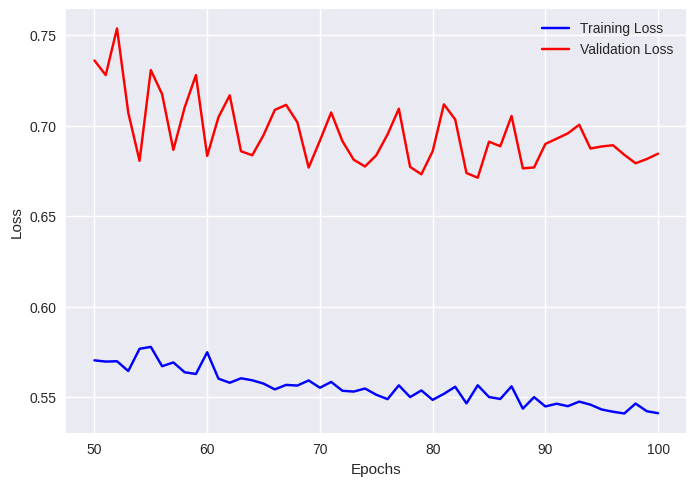

In [284]:
epochs = range(50, len(train_loss) + 1)

# Plot the training and validation curves
plt.plot(epochs, train_loss[49:], 'b', label='Training Loss')
plt.plot(epochs, val_loss[49:], 'r', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
import random
random.seed(42)
def cross_validate(X, y, z, K = 5):
    scores = []
    histories = []
    for train, test in KFold(n_splits=K, shuffle=True).split(X,y):
        z_train = z[train]
        z_test = z[test]
        random.shuffle(z_train)
        random.shuffle(z_test)
        model = compile_model() # compile model
        histories.append(model.fit([X[train], z_train], y[train],
                                   validation_data = ([X[test], z_test],y[test]), epochs=200, batch_size=32, shuffle = True # feed in the test data for plotting
                                   ).history)
        scores.append(model.evaluate([X[test], z_test], y[test], verbose = 0)) # evaluate the test dataset
    """print("average test MSE: ", np.asarray(scores)[:,0].mean())
    print("average test MAE: ", np.asarray(scores)[:,1].mean())"""
    print(model.summary())
    return scores, histories



In [ ]:
scores_mci_noag, histories_mci_noag = cross_validate(mci_X, mci_y, age_gap, K = 5)

Epoch 1/200
94/94 [==============================] - 4s 11ms/step - loss: 0.6890 - accuracy: 0.5625 - val_loss: 0.6903 - val_accuracy: 0.5532
Epoch 2/200
94/94 [==============================] - 1s 8ms/step - loss: 0.6852 - accuracy: 0.5775 - val_loss: 0.6924 - val_accuracy: 0.5505
Epoch 3/200
94/94 [==============================] - 1s 8ms/step - loss: 0.6611 - accuracy: 0.6220 - val_loss: 0.6385 - val_accuracy: 0.6569
Epoch 4/200
94/94 [==============================] - 1s 8ms/step - loss: 0.6319 - accuracy: 0.6546 - val_loss: 0.6274 - val_accuracy: 0.6543
Epoch 5/200
94/94 [==============================] - 1s 8ms/step - loss: 0.6187 - accuracy: 0.6606 - val_loss: 0.6160 - val_accuracy: 0.6569
Epoch 6/200
94/94 [==============================] - 1s 8ms/step - loss: 0.5821 - accuracy: 0.6805 - val_loss: 0.5889 - val_accuracy: 0.6848
Epoch 7/200
94/94 [==============================] - 1s 8ms/step - loss: 0.5116 - accuracy: 0.7354 - val_loss: 0.5399 - val_accuracy: 0.7460
Epoch 8/200


In [513]:
mci_X_train = mci_image_data[train_idx]
mci_X_test = mci_image_data[test_idx]
mci_ages_train = mci_ages[train_idx]
mci_sexes_train = mci_sexes[train_idx]
mci_labels_train = mci_labels[train_idx]
mci_ages_test  = mci_ages[test_idx]
mci_sexes_test = mci_sexes[test_idx]
mci_labels_test = mci_labels[test_idx]
age_gap_train = age_gap[train_idx]
age_gap_test = age_gap[test_idx]

In [580]:
# Assuming you have your data for predictions, test_labels, and sex_train
# Create a scatter plot
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, start_from_epoch=100, baseline = 50)
from keras.callbacks import ReduceLROnPlateau
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, verbose=1)

ag_mci_model = create_ag_model()
history = ag_mci_model.fit([mci_X_train, age_gap_train], mci_labels_train, validation_data = ([mci_X_test, age_gap_test], mci_labels_test), epochs = 100, batch_size = 64, callbacks = [callback, reduce_lr]).history
mci_predictions = ag_mci_model.predict([mci_X_test, age_gap_test])

Epoch 1/100
3/3 [==============================] - 16s 3s/step - loss: 4.3813 - accuracy: 0.4333 - val_loss: 0.8353 - val_accuracy: 0.4474 - lr: 0.0100
Epoch 2/100
3/3 [==============================] - 2s 594ms/step - loss: 0.7666 - accuracy: 0.4400 - val_loss: 2.9188 - val_accuracy: 0.4211 - lr: 0.0100
Epoch 3/100
3/3 [==============================] - 2s 589ms/step - loss: 0.6744 - accuracy: 0.6133 - val_loss: 4.9441 - val_accuracy: 0.4211 - lr: 0.0100
Epoch 4/100
3/3 [==============================] - 2s 591ms/step - loss: 0.7684 - accuracy: 0.5467 - val_loss: 4.4406 - val_accuracy: 0.4211 - lr: 0.0100
Epoch 5/100
3/3 [==============================] - 2s 588ms/step - loss: 0.7179 - accuracy: 0.5333 - val_loss: 3.5804 - val_accuracy: 0.4211 - lr: 0.0100
Epoch 6/100
3/3 [==============================] - 2s 589ms/step - loss: 0.7214 - accuracy: 0.4800 - val_loss: 2.7634 - val_accuracy: 0.4211 - lr: 0.0100
Epoch 7/100
3/3 [==============================] - 2s 585ms/step - loss: 0.702

In [554]:
mci_predictions = ag_mci_model.predict([mci_X_test, age_gap_test])

2/2 [==============================] - 0s 213ms/step


In [515]:
# Assuming you have your data for predictions, test_labels, and sex_train
# Create a scatter plot
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20, start_from_epoch=100, baseline = 50)
from keras.callbacks import ReduceLROnPlateau
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=10, verbose=1)

mci_model = create_model()
history = mci_model.fit(mci_X_train, mci_labels_train, validation_data = (mci_X_test, mci_labels_test), epochs = 100, batch_size = 28, callbacks = [callback, reduce_lr]).history
mci_predictions = mci_model.predict(mci_X_test)

Epoch 1/100
6/6 [==============================] - 16s 1s/step - loss: 7.3871 - accuracy: 0.5067 - val_loss: 318.1488 - val_accuracy: 0.5789 - lr: 0.0100
Epoch 2/100
6/6 [==============================] - 3s 559ms/step - loss: 4.5188 - accuracy: 0.5000 - val_loss: 1212.6957 - val_accuracy: 0.4211 - lr: 0.0100
Epoch 3/100
6/6 [==============================] - 3s 556ms/step - loss: 3.6791 - accuracy: 0.5800 - val_loss: 746.7692 - val_accuracy: 0.4211 - lr: 0.0100
Epoch 4/100
6/6 [==============================] - 3s 554ms/step - loss: 3.5353 - accuracy: 0.5667 - val_loss: 1613.3199 - val_accuracy: 0.4211 - lr: 0.0100
Epoch 5/100
6/6 [==============================] - 3s 547ms/step - loss: 4.0054 - accuracy: 0.5933 - val_loss: 255.8210 - val_accuracy: 0.4211 - lr: 0.0100
Epoch 6/100
6/6 [==============================] - 3s 549ms/step - loss: 2.2987 - accuracy: 0.6267 - val_loss: 580.7250 - val_accuracy: 0.4211 - lr: 0.0100
Epoch 7/100
6/6 [==============================] - 3s 547ms/step

In [262]:
predictions = model.predict(mci_X_test[..., np.newaxis])

2/2 [==============================] - 0s 227ms/step


In [555]:
from sklearn.metrics import roc_curve

# roc curve for models
fpr1, tpr1, thresh1 = roc_curve(mci_labels_test, mci_predictions, pos_label=1)

# roc curve for tpr = fpr
random_probs = [0 for i in range(len(mci_labels_test))]
p_fpr, p_tpr, _ = roc_curve(mci_labels_test, random_probs, pos_label=1)

In [556]:
from sklearn.metrics import roc_auc_score

# auc scores
auc_score1 = roc_auc_score(mci_labels_test, mci_predictions)

print(auc_score1)

0.5994318181818181


<ipython-input-557-beb66e16bd9f>:3: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


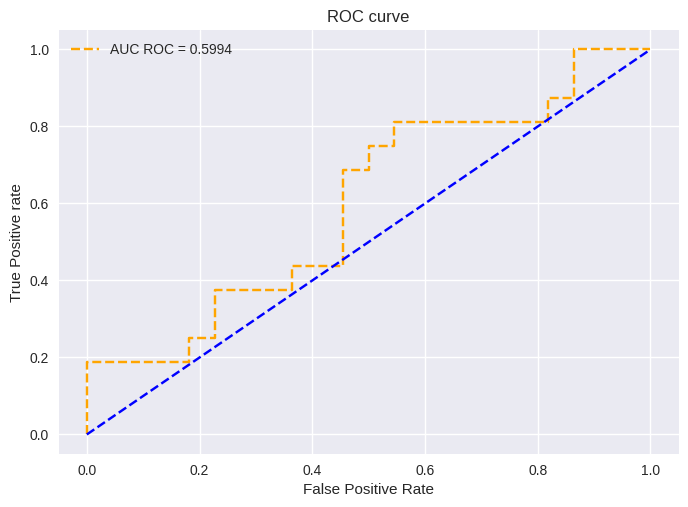

In [557]:
# matplotlib
import matplotlib.pyplot as plt
plt.style.use('seaborn')

# plot roc curves
plt.plot(fpr1, tpr1, linestyle='--',color='orange', label=f'AUC ROC = {round(auc_score1,4)}')
plt.plot(p_fpr, p_tpr, linestyle='--', color='blue')
# title
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')

plt.legend(loc='best')
plt.savefig('ROC',dpi=300)
plt.show();

In [562]:
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score, roc_auc_score

for i in range(40,60):
  threshhold_ = i/100
  print(threshhold_)
  class_predictions =[]
  for pred in mci_predictions:
    if pred<=threshhold_:
      class_predictions.append(0)
    else:
      class_predictions.append(1)
  print(accuracy_score(class_predictions, mci_labels_test))

0.4
0.42105263157894735
0.41
0.4473684210526316
0.42
0.4473684210526316
0.43
0.4473684210526316
0.44
0.5789473684210527
0.45
0.5526315789473685
0.46
0.5789473684210527
0.47
0.5526315789473685
0.48
0.5789473684210527
0.49
0.631578947368421
0.5
0.6578947368421053
0.51
0.5789473684210527
0.52
0.5789473684210527
0.53
0.5789473684210527
0.54
0.5789473684210527
0.55
0.5789473684210527
0.56
0.5789473684210527
0.57
0.5789473684210527
0.58
0.5789473684210527
0.59
0.5789473684210527


In [528]:
class_predictions =[]
for pred in mci_predictions:
    if pred<=0.3:
      class_predictions.append(0)
    else:
      class_predictions.append(1)

In [529]:
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score, roc_auc_score

# Sample true labels and predicted labels
y_true = mci_labels_test
y_pred = class_predictions
# Accuracy
acc = accuracy_score(y_true, y_pred)
print(f"Accuracy: {acc:.4f}")

# Confusion Matrix
tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()

# Specificity
specificity = tn / (tn + fp)
print(f"Specificity: {specificity:.4f}")

# Recall (Sensitivity)
recall = tp / (tp + fn)
print(f"Recall: {recall:.4f}")

# F1 Score
f1 = f1_score(y_true, y_pred)
print(f"F1 Score: {f1:.4f}")

# AUC-ROC
auc_roc = roc_auc_score(y_true, y_pred)
print(f"AUC-ROC: {auc_roc:.4f}")


Accuracy: 0.6579
Specificity: 0.9091
Recall: 0.3125
F1 Score: 0.4348
AUC-ROC: 0.6108


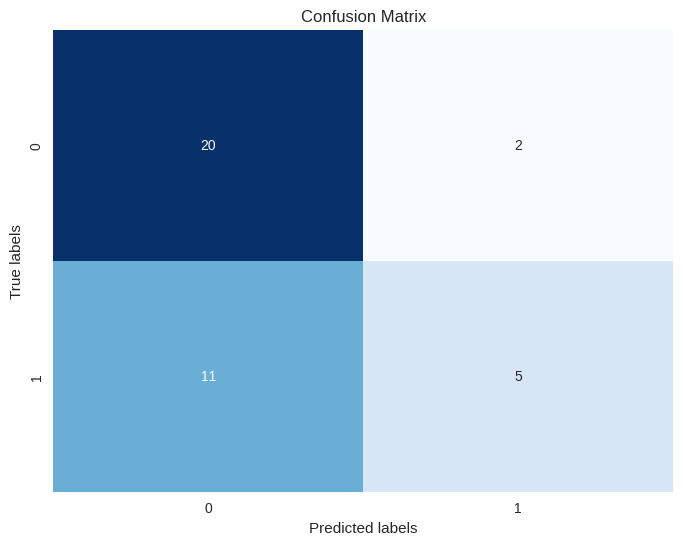

In [530]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns

# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plot confusion matrix
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', cbar=False)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.xticks([0.5,1.5], [0,1])
plt.yticks([0.5,1.5], [0,1], va='center')
plt.show()


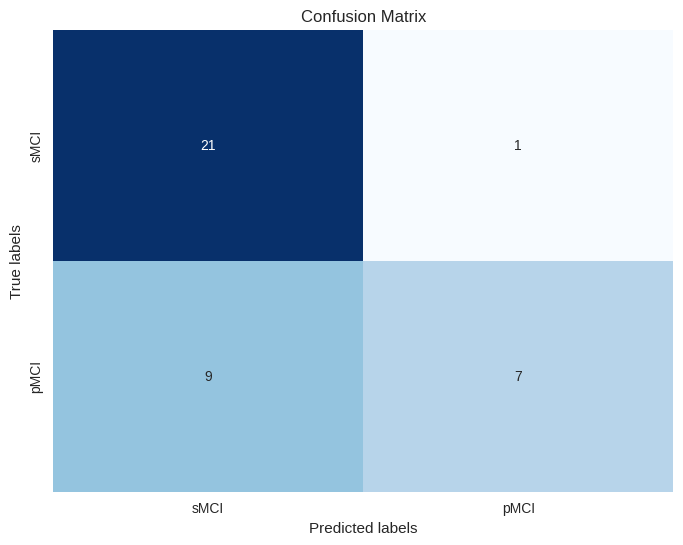

In [286]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns


# Compute confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plot confusion matrix
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', cbar=False)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.xticks([0.5,1.5], ['sMCI', 'pMCI'])
plt.yticks([0.5,1.5], ['sMCI', 'pMCI'], va='center')
plt.show()


### x